# 02_analysis_final.ipynb
# Street Typology Classification and Similarity Search
# Seyma Berker | MSc Urban Spatial Science | UCL CASA 2026
# In partnership with Foster + Partners
#
# Final analysis pipeline:
#   - Load cleaned street networks
#   - Feature engineering for all four cities
#   - Data quality and feature checks
#   - Movement and Place score construction
#   - K-means clustering to identify street typologies
#   - Cross-city comparison and visualisation
#   - Similarity search for validation
#
# All figures are saved to /home/jovyan/work/outputs/

In [1]:
# Import libraries used throughout the analysis

import os
import warnings

import osmnx as ox
import geopandas as gpd
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import contextily as ctx
import seaborn as sns

from shapely.ops import linemerge
from scipy.stats import entropy as shannon_entropy

from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.cluster import KMeans
from sklearn.neighbors import NearestNeighbors
from sklearn.metrics import silhouette_score

warnings.filterwarnings('ignore')

DATA_DIR = "/home/jovyan/work/data"
OUTPUT_DIR = "/home/jovyan/work/outputs"

os.makedirs(OUTPUT_DIR, exist_ok=True)

print("All libraries ready.")
print(f"OSMnx version: {ox.__version__}")
print(f"GeoPandas version: {gpd.__version__}")

All libraries ready.
OSMnx version: 2.1.1
GeoPandas version: 1.1.1


In [2]:
# Candidate street-level indicators used in the analysis
# Movement and Place grouping is defined later after feature review

RAW_FEATURE_COLS = [
    'length_m',
    'building_count_50m',
    'avg_building_area',
    'highway_rank',
    'sinuosity',
    'poi_count_50m',
    'poi_diversity',
    'food_drink_count',
    'street_furniture_count',
    'avg_connectivity'
]

print(f"Candidate indicators defined: {len(RAW_FEATURE_COLS)}")

Candidate indicators defined: 10


In [3]:
# Feature engineering pipeline
# Uses cleaned street geometries with OSM buildings and POIs
# The same procedure is applied to all four study areas

def run_pipeline(city_name, streets_file, buildings_file, pois_file):

    print(f"\nProcessing {city_name}...")

    # Load datasets
    edges = gpd.read_file(streets_file)
    buildings = gpd.read_file(buildings_file)
    pois = gpd.read_file(pois_file)

    print(
        f"  Loaded: {len(edges)} streets, "
        f"{len(buildings)} buildings, {len(pois)} POIs"
    )

    # Use a local projected CRS for distance and area calculations
    metric_crs = edges.estimate_utm_crs()

    edges_proj = edges.to_crs(metric_crs)
    buildings_proj = buildings.to_crs(metric_crs)
    pois_proj = pois.to_crs(metric_crs)

    print(f"  Metric CRS: {metric_crs}")

    # Street length
    edges_proj['length_m'] = edges_proj.geometry.length

    # 50 m buffer around each street
    edges_buffered = edges_proj[['geometry']].copy()
    edges_buffered['geometry'] = edges_proj.geometry.buffer(50)

    # --------------------------------------------------
    # Buildings
    # --------------------------------------------------

    buildings_proj = buildings_proj.copy()
    buildings_proj['building_area_m2'] = buildings_proj.geometry.area

    joined_b = gpd.sjoin(
        edges_buffered,
        buildings_proj[['geometry', 'building_area_m2']],
        how='left',
        predicate='intersects'
    )

    building_counts = joined_b.groupby(
        joined_b.index
    )['index_right'].count()

    edges_proj['building_count_50m'] = (
        building_counts.reindex(edges_proj.index, fill_value=0)
    )

    building_area = joined_b.groupby(
        joined_b.index
    )['building_area_m2'].mean()

    edges_proj['avg_building_area'] = (
        building_area.reindex(edges_proj.index).fillna(0)
    )

    # --------------------------------------------------
    # Highway rank
    # --------------------------------------------------

    highway_map = {
        'trunk': 6,
        'trunk_link': 6,
        'primary': 5,
        'primary_link': 5,
        'secondary': 4,
        'secondary_link': 4,
        'tertiary': 3,
        'tertiary_link': 3,
        'residential': 2,
        'living_street': 2,
        'unclassified': 1
    }

    def clean_highway(value):
        if isinstance(value, list):
            return value[0]
        return value

    if 'highway_rank' in edges_proj.columns:

        edges_proj['highway_rank'] = pd.to_numeric(
            edges_proj['highway_rank'],
            errors='coerce'
        ).fillna(1)

    elif 'highway' in edges_proj.columns:

        edges_proj['highway_clean'] = (
            edges_proj['highway'].apply(clean_highway)
        )

        edges_proj['highway_rank'] = (
            edges_proj['highway_clean']
            .map(highway_map)
            .fillna(1)
        )

    else:

        edges_proj['highway_rank'] = 1.0
        print("  Warning: highway information not available")

    # --------------------------------------------------
    # Sinuosity
    # --------------------------------------------------

    def calculate_sinuosity(geom):

        if geom is None or geom.is_empty:
            return np.nan

        if geom.geom_type == 'MultiLineString':
            geom = linemerge(geom)

        if geom.geom_type != 'LineString':
            return np.nan

        if geom.length == 0:
            return 1.0

        start = geom.coords[0]
        end = geom.coords[-1]

        straight_distance = np.sqrt(
            (end[0] - start[0]) ** 2 +
            (end[1] - start[1]) ** 2
        )

        if straight_distance == 0:
            return np.nan

        return geom.length / straight_distance

    edges_proj['sinuosity'] = (
        edges_proj.geometry.apply(calculate_sinuosity)
    )

    edges_proj['sinuosity_extreme'] = (
        edges_proj['sinuosity'] > 5
    )

    # --------------------------------------------------
    # POI categories
    # --------------------------------------------------

    food_drink_tags = [
        'restaurant',
        'fast_food',
        'cafe',
        'pub',
        'bar'
    ]

    furniture_tags = [
        'bench',
        'fountain',
        'clock',
        'telephone',
        'post_box'
    ]

    def categorise_poi(row):

        amenity = str(row.get('amenity', ''))
        shop = str(row.get('shop', ''))

        if amenity in food_drink_tags:
            return 'food_drink'

        elif amenity in [
            'bicycle_parking',
            'bicycle_rental',
            'motorcycle_parking',
            'parking'
        ]:
            return 'transport'

        elif amenity in ['bank', 'atm']:
            return 'finance'

        elif amenity in [
            'place_of_worship',
            'doctors',
            'dentist',
            'pharmacy'
        ]:
            return 'civic'

        elif amenity in furniture_tags:
            return 'street_furniture'

        elif shop not in ['nan', '', 'None']:
            return 'retail'

        else:
            return 'other'

    pois_proj = pois_proj.copy()
    pois_proj['category'] = pois_proj.apply(
        categorise_poi,
        axis=1
    )

    # --------------------------------------------------
    # POI count
    # --------------------------------------------------

    joined_p = gpd.sjoin(
        edges_buffered,
        pois_proj[['geometry', 'category']],
        how='left',
        predicate='intersects'
    )

    poi_counts = joined_p.groupby(
        joined_p.index
    )['index_right'].count()

    edges_proj['poi_count_50m'] = (
        poi_counts.reindex(edges_proj.index, fill_value=0)
    )

    # --------------------------------------------------
    # POI diversity
    # --------------------------------------------------

    def calculate_entropy(group):

        categories = group['category'].dropna()

        if len(categories) == 0:
            return 0.0

        counts = categories.value_counts()

        if len(counts) <= 1:
            return 0.0

        return shannon_entropy(counts)

    poi_entropy = joined_p.groupby(
        joined_p.index
    ).apply(calculate_entropy)

    edges_proj['poi_diversity'] = (
        poi_entropy.reindex(edges_proj.index, fill_value=0)
    )

    # --------------------------------------------------
    # Food and drink
    # --------------------------------------------------

    food_pois = pois_proj[
        pois_proj['category'] == 'food_drink'
    ]

    joined_food = gpd.sjoin(
        edges_buffered,
        food_pois[['geometry']],
        how='left',
        predicate='intersects'
    )

    food_counts = joined_food.groupby(
        joined_food.index
    )['index_right'].count()

    edges_proj['food_drink_count'] = (
        food_counts.reindex(edges_proj.index, fill_value=0)
    )

    # --------------------------------------------------
    # Street furniture
    # --------------------------------------------------

    furniture_pois = pois_proj[
        pois_proj['category'] == 'street_furniture'
    ]

    joined_furniture = gpd.sjoin(
        edges_buffered,
        furniture_pois[['geometry']],
        how='left',
        predicate='intersects'
    )

    furniture_counts = joined_furniture.groupby(
        joined_furniture.index
    )['index_right'].count()

    edges_proj['street_furniture_count'] = (
        furniture_counts.reindex(edges_proj.index, fill_value=0)
    )

    # --------------------------------------------------
    # Connectivity
    # --------------------------------------------------

    if 'avg_connectivity' in edges_proj.columns:

        edges_proj['avg_connectivity'] = pd.to_numeric(
            edges_proj['avg_connectivity'],
            errors='coerce'
        )

    else:

        edges_reset = edges_proj.reset_index()

        if 'u' in edges_reset.columns and 'v' in edges_reset.columns:

            all_nodes = pd.concat([
                edges_reset['u'],
                edges_reset['v']
            ])

            degree_dict = all_nodes.value_counts().to_dict()

            edges_reset['degree_u'] = (
                edges_reset['u'].map(degree_dict)
            )

            edges_reset['degree_v'] = (
                edges_reset['v'].map(degree_dict)
            )

            edges_reset['avg_connectivity'] = (
                edges_reset['degree_u'] +
                edges_reset['degree_v']
            ) / 2

            edges_proj = gpd.GeoDataFrame(
                edges_reset,
                geometry='geometry',
                crs=metric_crs
            )

        else:

            edges_proj['avg_connectivity'] = np.nan
            print("  Warning: connectivity could not be calculated")

    # --------------------------------------------------
    # Length-normalised candidate variables
    # --------------------------------------------------

    # Raw counts are retained and per-100 m versions are created
    # so both approaches can be checked before final feature selection

    safe_length = edges_proj['length_m'].replace(0, np.nan)

    edges_proj['building_count_per_100m'] = (
        edges_proj['building_count_50m'] /
        safe_length * 100
    )

    edges_proj['poi_count_per_100m'] = (
        edges_proj['poi_count_50m'] /
        safe_length * 100
    )

    edges_proj['food_drink_per_100m'] = (
        edges_proj['food_drink_count'] /
        safe_length * 100
    )

    edges_proj['street_furniture_per_100m'] = (
        edges_proj['street_furniture_count'] /
        safe_length * 100
    )

    edges_proj['city'] = city_name

    # Summary
    missing = edges_proj[RAW_FEATURE_COLS].isna().sum().sum()
    extreme_sinuosity = edges_proj['sinuosity_extreme'].sum()

    print("  Complete.")
    print(f"  Missing raw feature values: {missing}")
    print(f"  Extreme sinuosity values (>5): {extreme_sinuosity}")

    return edges_proj


print("Pipeline function ready.")

Pipeline function ready.


In [4]:
# Run feature engineering on Laurens' cleaned street networks
# Buildings and POIs remain from OpenStreetMap

london = run_pipeline(
    city_name="London",
    streets_file="/home/jovyan/work/data/london_cleaned.geojson",
    buildings_file="/home/jovyan/work/data/london_buildings.gpkg",
    pois_file="/home/jovyan/work/data/london_pois.gpkg"
)

barcelona = run_pipeline(
    city_name="Barcelona",
    streets_file="/home/jovyan/work/data/barcelona_cleaned.geojson",
    buildings_file="/home/jovyan/work/data/barcelona_buildings.gpkg",
    pois_file="/home/jovyan/work/data/barcelona_pois.gpkg"
)

singapore = run_pipeline(
    city_name="Singapore",
    streets_file="/home/jovyan/work/data/singapore_cleaned.geojson",
    buildings_file="/home/jovyan/work/data/singapore_buildings.gpkg",
    pois_file="/home/jovyan/work/data/singapore_pois.gpkg"
)

tokyo = run_pipeline(
    city_name="Tokyo",
    streets_file="/home/jovyan/work/data/tokyo_cleaned.geojson",
    buildings_file="/home/jovyan/work/data/tokyo_buildings.gpkg",
    pois_file="/home/jovyan/work/data/tokyo_pois.gpkg"
)

print("\nAll four cities processed on cleaned networks.")

print(
    f"London: {len(london)} | "
    f"Barcelona: {len(barcelona)} | "
    f"Singapore: {len(singapore)} | "
    f"Tokyo: {len(tokyo)}"
)

print(
    f"Total: "
    f"{len(london) + len(barcelona) + len(singapore) + len(tokyo)} segments"
)


Processing London...


Skipping field highway: unsupported OGR type: 5
Skipping field lanes: unsupported OGR type: 5
Skipping field name: unsupported OGR type: 5
Skipping field ref: unsupported OGR type: 5
Skipping field width: unsupported OGR type: 5
Skipping field highway_clean: unsupported OGR type: 5


  Loaded: 927 streets, 2104 buildings, 3388 POIs
  Metric CRS: EPSG:32630


Skipping field highway: unsupported OGR type: 5
Skipping field lanes: unsupported OGR type: 5
Skipping field maxspeed: unsupported OGR type: 5
Skipping field name: unsupported OGR type: 5
Skipping field width: unsupported OGR type: 5
Skipping field highway_clean: unsupported OGR type: 5


  Complete.
  Missing raw feature values: 178
  Extreme sinuosity values (>5): 2

Processing Barcelona...
  Loaded: 1522 streets, 8253 buildings, 8956 POIs
  Metric CRS: EPSG:32631


Skipping field lanes: unsupported OGR type: 5
Skipping field name: unsupported OGR type: 5


  Complete.
  Missing raw feature values: 88
  Extreme sinuosity values (>5): 0

Processing Singapore...
  Loaded: 385 streets, 2987 buildings, 643 POIs
  Metric CRS: EPSG:32648


Skipping field highway: unsupported OGR type: 5
Skipping field lanes: unsupported OGR type: 5
Skipping field name: unsupported OGR type: 5
Skipping field maxspeed: unsupported OGR type: 5
Skipping field highway_clean: unsupported OGR type: 5


  Complete.
  Missing raw feature values: 113
  Extreme sinuosity values (>5): 0

Processing Tokyo...
  Loaded: 848 streets, 9580 buildings, 702 POIs
  Metric CRS: EPSG:32654
  Complete.
  Missing raw feature values: 174
  Extreme sinuosity values (>5): 1

All four cities processed on cleaned networks.
London: 927 | Barcelona: 1522 | Singapore: 385 | Tokyo: 848
Total: 3682 segments


In [5]:
# Check missing values and basic feature ranges by city

city_dfs = {
    'London': london,
    'Barcelona': barcelona,
    'Singapore': singapore,
    'Tokyo': tokyo
}

for city_name, df in city_dfs.items():

    print(f"\n{'=' * 60}")
    print(city_name)
    print('=' * 60)

    missing = df[RAW_FEATURE_COLS].isna().sum()
    missing = missing[missing > 0]

    print("\nMissing values:")
    if len(missing) == 0:
        print("None")
    else:
        print(missing)

    print("\nFeature ranges:")
    print(
        df[RAW_FEATURE_COLS]
        .describe()
        .loc[['min', '50%', 'max']]
        .round(3)
        .T
    )


London

Missing values:
sinuosity             3
avg_connectivity    175
dtype: int64

Feature ranges:
                            min       50%       max
length_m                  1.118    46.704   640.367
building_count_50m        2.000    14.000    76.000
avg_building_area       195.473  1300.072  7751.694
highway_rank              1.000     2.000     6.000
sinuosity                 1.000     1.001    29.903
poi_count_50m             0.000    16.000   103.000
poi_diversity             0.000     1.313     1.873
food_drink_count          0.000     4.000    33.000
street_furniture_count    0.000     2.000    34.000
avg_connectivity          2.000     4.000     8.000

Barcelona

Missing values:
avg_connectivity    88
dtype: int64

Feature ranges:
                            min      50%        max
length_m                  2.720  125.610    482.095
building_count_50m        1.000   21.000     88.000
avg_building_area       118.377  539.246  12744.046
highway_rank              1.000    3

In [6]:
# Inspect missing and unusually high sinuosity values
# before deciding how they should be treated

for city_name, df in city_dfs.items():

    problem = df[
        df['sinuosity'].isna() |
        (df['sinuosity'] > 5)
    ].copy()

    print(f"\n{'=' * 60}")
    print(f"{city_name}: sinuosity cases to inspect")
    print('=' * 60)

    if len(problem) == 0:
        print("None")
    else:
        cols = ['length_m', 'sinuosity']

        # Include useful identifiers if they survived the cleaned file
        for col in ['name', 'highway', 'highway_rank']:
            if col in problem.columns:
                cols.append(col)

        print(problem[cols].to_string())


London: sinuosity cases to inspect
       length_m  sinuosity  highway_rank
590  640.366957   29.90281           1.0
619   74.582463    8.96173           1.0
830   58.275874        NaN           1.0
864   85.191633        NaN           1.0
922  137.848997        NaN           1.0

Barcelona: sinuosity cases to inspect
None

Singapore: sinuosity cases to inspect
       length_m  sinuosity highway  highway_rank
132   40.489301        NaN    None           1.0
249  376.036322        NaN    None           1.0
329   84.803257        NaN    None           1.0
382   96.739787        NaN    None           1.0

Tokyo: sinuosity cases to inspect
       length_m  sinuosity  highway_rank
589  251.725994        NaN           1.0
817  172.242815   5.158963           1.0


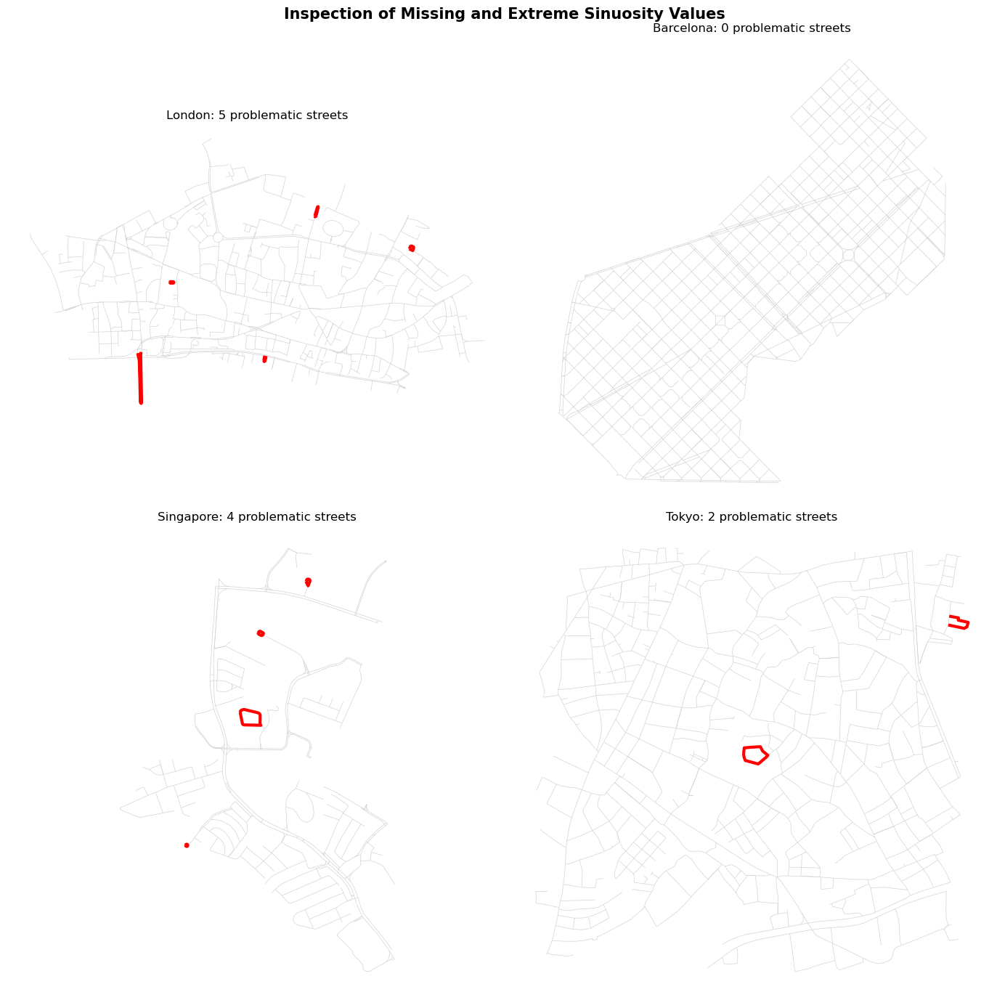

Saved: outputs/sinuosity_inspection.png


In [7]:
# Plot streets with missing or extreme sinuosity
# Problem streets are highlighted in red for visual inspection

fig, axes = plt.subplots(2, 2, figsize=(14, 14))

for ax, (city_name, df) in zip(axes.flatten(), city_dfs.items()):

    problem = df[
        df['sinuosity'].isna() |
        (df['sinuosity'] > 5)
    ]

    df.plot(
        ax=ax,
        linewidth=0.5,
        color='lightgrey'
    )

    if len(problem) > 0:
        problem.plot(
            ax=ax,
            linewidth=3,
            color='red'
        )

    ax.set_title(
        f"{city_name}: {len(problem)} problematic streets",
        fontsize=12
    )
    ax.set_axis_off()

plt.suptitle(
    "Inspection of Missing and Extreme Sinuosity Values",
    fontsize=15,
    fontweight='bold'
)

plt.tight_layout()

plt.savefig(
    "/home/jovyan/work/outputs/sinuosity_inspection.png",
    dpi=200,
    bbox_inches='tight',
    facecolor='white'
)

plt.show()

print("Saved: outputs/sinuosity_inspection.png")

In [8]:
# Clean invalid sinuosity values
# Closed or near-closed street geometries can produce undefined or
# extremely high values because their endpoints are very close together.
# These cases are treated as missing and replaced with the city median.

for city_name, df in city_dfs.items():

    # Treat missing and extreme values as invalid
    invalid = df['sinuosity'].isna() | (df['sinuosity'] > 5)

    n_invalid = invalid.sum()

    # Calculate median from valid streets only
    valid_median = df.loc[~invalid, 'sinuosity'].median()

    # Replace invalid values with the city median
    df.loc[invalid, 'sinuosity'] = valid_median

    print(
        f"{city_name}: replaced {n_invalid} invalid values "
        f"with median sinuosity {valid_median:.3f}"
    )

print("\nSinuosity cleaning complete.")

London: replaced 5 invalid values with median sinuosity 1.001
Barcelona: replaced 0 invalid values with median sinuosity 1.000
Singapore: replaced 4 invalid values with median sinuosity 1.000
Tokyo: replaced 2 invalid values with median sinuosity 1.000

Sinuosity cleaning complete.


In [9]:
# Confirm sinuosity values after cleaning

for city_name, df in city_dfs.items():
    print(
        f"{city_name}: "
        f"missing = {df['sinuosity'].isna().sum()}, "
        f"min = {df['sinuosity'].min():.3f}, "
        f"median = {df['sinuosity'].median():.3f}, "
        f"max = {df['sinuosity'].max():.3f}"
    )

London: missing = 0, min = 1.000, median = 1.001, max = 4.873
Barcelona: missing = 0, min = 1.000, median = 1.000, max = 2.461
Singapore: missing = 0, min = 1.000, median = 1.000, max = 3.292
Tokyo: missing = 0, min = 1.000, median = 1.000, max = 3.341


In [10]:
# Recalculate street connectivity from the cleaned street geometries
# Connectivity is measured as the number of street segments meeting
# each endpoint, averaged across the two endpoints of each street.

from shapely.geometry import Point


def calculate_connectivity(gdf, tolerance=2.0):

    gdf = gdf.copy()

    starts = []
    ends = []

    for geom in gdf.geometry:

        if geom is None or geom.is_empty:
            starts.append(None)
            ends.append(None)
            continue

        coords = list(geom.coords)

        starts.append(Point(coords[0]))
        ends.append(Point(coords[-1]))

    start_gdf = gpd.GeoDataFrame(
        {'street_index': gdf.index},
        geometry=starts,
        crs=gdf.crs
    )

    end_gdf = gpd.GeoDataFrame(
        {'street_index': gdf.index},
        geometry=ends,
        crs=gdf.crs
    )

    endpoints = pd.concat(
        [start_gdf, end_gdf],
        ignore_index=True
    )

    endpoint_buffers = endpoints.copy()
    endpoint_buffers['geometry'] = endpoints.geometry.buffer(tolerance)

    joined = gpd.sjoin(
        endpoint_buffers[['geometry']],
        endpoints[['geometry']],
        how='left',
        predicate='intersects'
    )

    endpoint_degree = (
        joined.groupby(joined.index)['index_right']
        .count()
    )

    endpoints['degree'] = endpoint_degree.reindex(
        endpoints.index,
        fill_value=1
    )

    n = len(gdf)

    start_degree = endpoints.iloc[:n]['degree'].to_numpy()
    end_degree = endpoints.iloc[n:]['degree'].to_numpy()

    gdf['avg_connectivity'] = (
        start_degree + end_degree
    ) / 2

    return gdf


# Apply connectivity calculation using a 0.5m tolerance
# Sensitivity testing showed that results were stable up to 1m,
# while 2m merged nearby endpoints.

for city_name in city_dfs:

    city_dfs[city_name] = calculate_connectivity(
        city_dfs[city_name],
        tolerance=0.5
    )

    df = city_dfs[city_name]

    print(
        f"{city_name}: "
        f"missing = {df['avg_connectivity'].isna().sum()}, "
        f"min = {df['avg_connectivity'].min():.1f}, "
        f"median = {df['avg_connectivity'].median():.1f}, "
        f"max = {df['avg_connectivity'].max():.1f}"
    )

London: missing = 0, min = 2.0, median = 3.5, max = 7.5
Barcelona: missing = 0, min = 2.0, median = 4.0, max = 7.0
Singapore: missing = 0, min = 2.0, median = 3.0, max = 5.0
Tokyo: missing = 0, min = 2.0, median = 3.0, max = 5.0


In [11]:
# Inspect streets with unusually high connectivity
# before accepting the recalculated connectivity feature

for city_name, df in city_dfs.items():

    high_conn = df[df['avg_connectivity'] > 8].copy()

    print(f"\n{'=' * 60}")
    print(f"{city_name}: connectivity above 8")
    print('=' * 60)

    if len(high_conn) == 0:
        print("None")
    else:
        cols = ['length_m', 'avg_connectivity', 'highway_rank']

        if 'name' in high_conn.columns:
            cols.append('name')

        print(high_conn[cols].to_string())


London: connectivity above 8
None

Barcelona: connectivity above 8
None

Singapore: connectivity above 8
None

Tokyo: connectivity above 8
None


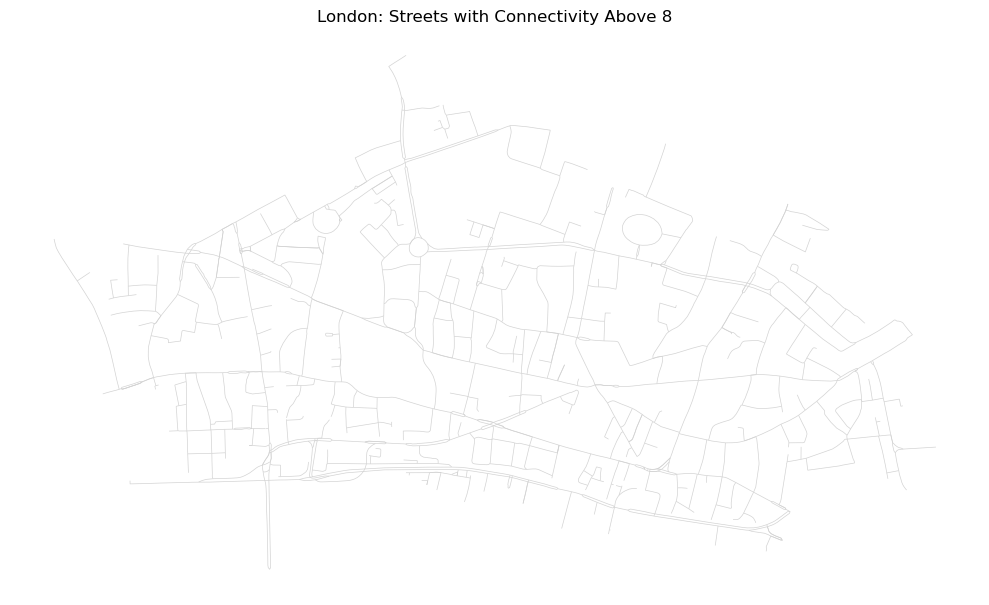

High-connectivity streets: 0
Saved: outputs/connectivity_inspection_london.png


In [12]:
# Visual inspection of streets with unusually high connectivity in London

high_conn = city_dfs['London'][
    city_dfs['London']['avg_connectivity'] > 8
]

fig, ax = plt.subplots(figsize=(10, 10))

city_dfs['London'].plot(
    ax=ax,
    linewidth=0.5,
    color='lightgrey'
)

if len(high_conn) > 0:
    high_conn.plot(
        ax=ax,
        linewidth=3,
        color='red'
    )

ax.set_title(
    f"London: Streets with Connectivity Above 8"
)
ax.set_axis_off()

plt.tight_layout()

plt.savefig(
    "/home/jovyan/work/outputs/connectivity_inspection_london.png",
    dpi=200,
    bbox_inches='tight',
    facecolor='white'
)

plt.show()

print(f"High-connectivity streets: {len(high_conn)}")
print("Saved: outputs/connectivity_inspection_london.png")

In [13]:
# Test connectivity using different endpoint tolerances
# This checks whether the 2m tolerance is artificially merging
# nearby endpoints in dense parts of the street network.

for tolerance in [0.01, 0.1, 0.5, 1.0, 2.0]:

    test = calculate_connectivity(
        city_dfs['London'],
        tolerance=tolerance
    )

    print(
        f"Tolerance {tolerance}m: "
        f"median = {test['avg_connectivity'].median():.1f}, "
        f"max = {test['avg_connectivity'].max():.1f}, "
        f">8 = {(test['avg_connectivity'] > 8).sum()}"
    )

Tolerance 0.01m: median = 3.5, max = 7.5, >8 = 0
Tolerance 0.1m: median = 3.5, max = 7.5, >8 = 0
Tolerance 0.5m: median = 3.5, max = 7.5, >8 = 0
Tolerance 1.0m: median = 3.5, max = 7.5, >8 = 0
Tolerance 2.0m: median = 3.5, max = 15.0, >8 = 19


In [14]:
# Define the 10 features used in the analysis

FEATURE_COLS = [
    'length_m',
    'building_count_50m',
    'avg_building_area',
    'highway_rank',
    'sinuosity',
    'poi_count_50m',
    'poi_diversity',
    'food_drink_count',
    'street_furniture_count',
    'avg_connectivity'
]

print(f"Features defined: {len(FEATURE_COLS)}")

Features defined: 10


In [15]:
# Final check of feature completeness after data cleaning

print("Final feature quality check")

for city_name, df in city_dfs.items():

    print(f"\n{city_name}")

    missing = df[FEATURE_COLS].isna().sum()
    missing = missing[missing > 0]

    if len(missing) == 0:
        print("  Missing feature values: 0")
    else:
        print("  Missing values:")
        print(missing)

    print(f"  Streets: {len(df)}")
    print(
        f"  Sinuosity range: "
        f"{df['sinuosity'].min():.3f} to "
        f"{df['sinuosity'].max():.3f}"
    )
    print(
        f"  Connectivity range: "
        f"{df['avg_connectivity'].min():.1f} to "
        f"{df['avg_connectivity'].max():.1f}"
    )

Final feature quality check

London
  Missing feature values: 0
  Streets: 927
  Sinuosity range: 1.000 to 4.873
  Connectivity range: 2.0 to 7.5

Barcelona
  Missing feature values: 0
  Streets: 1522
  Sinuosity range: 1.000 to 2.461
  Connectivity range: 2.0 to 7.0

Singapore
  Missing feature values: 0
  Streets: 385
  Sinuosity range: 1.000 to 3.292
  Connectivity range: 2.0 to 5.0

Tokyo
  Missing feature values: 0
  Streets: 848
  Sinuosity range: 1.000 to 3.341
  Connectivity range: 2.0 to 5.0


### Testing length-normalised count features

Length-normalised versions of the count features were tested to check whether
segment length was affecting the raw 50 m buffer counts. The results are
compared below before deciding which variables to use in the final clustering.

In [16]:
# Compare raw count features with length-normalised values
# This checks whether very short streets create extreme per-100m values.

NORMALISED_FEATURE_COLS = [
    'building_count_per_100m',
    'poi_count_per_100m',
    'food_drink_per_100m',
    'street_furniture_per_100m'
]

for city_name, df in city_dfs.items():

    print(f"\n{'=' * 60}")
    print(city_name)
    print('=' * 60)

    cols = [
        'length_m',
        'building_count_50m',
        'building_count_per_100m',
        'poi_count_50m',
        'poi_count_per_100m',
        'food_drink_count',
        'food_drink_per_100m',
        'street_furniture_count',
        'street_furniture_per_100m'
    ]

    print(
        df[cols]
        .describe(percentiles=[0.5, 0.95, 0.99])
        .loc[['min', '50%', '95%', '99%', 'max']]
        .round(3)
        .T
    )


London
                             min     50%      95%      99%       max
length_m                   1.118  46.704  174.420  272.553   640.367
building_count_50m         2.000  14.000   35.000   49.000    76.000
building_count_per_100m    1.249  30.102  169.593  826.437  1736.409
poi_count_50m              0.000  16.000   42.000   64.000   103.000
poi_count_per_100m         0.000  31.305  208.591  805.119  2701.080
food_drink_count           0.000   4.000   18.000   25.740    33.000
food_drink_per_100m        0.000   8.589   69.276  178.915  1221.917
street_furniture_count     0.000   2.000   13.000   25.740    34.000
street_furniture_per_100m  0.000   3.731   55.720  153.115   178.915

Barcelona
                             min      50%      95%      99%      max
length_m                   2.720  125.610  175.329  267.913  482.095
building_count_50m         1.000   21.000   51.000   70.790   88.000
building_count_per_100m    0.374   25.370   86.817  135.333  770.837
poi_count_50m  

In [17]:
# Inspect the shortest streets because these are most likely
# to produce inflated per-100m values.

for city_name, df in city_dfs.items():

    print(f"\n{'=' * 60}")
    print(f"{city_name}: 10 shortest streets")
    print('=' * 60)

    cols = [
        'length_m',
        'building_count_50m',
        'building_count_per_100m',
        'poi_count_50m',
        'poi_count_per_100m',
        'food_drink_count',
        'food_drink_per_100m',
        'street_furniture_count',
        'street_furniture_per_100m'
    ]

    print(
        df.nsmallest(10, 'length_m')[cols]
        .round(3)
        .to_string()
    )


London: 10 shortest streets
    length_m  building_count_50m  building_count_per_100m  poi_count_50m  poi_count_per_100m  food_drink_count  food_drink_per_100m  street_furniture_count  street_furniture_per_100m
19     1.118                  10                  894.576              9             805.119                 2              178.915                       2                    178.915
20     1.118                  10                  894.576              9             805.119                 2              178.915                       2                    178.915
21     1.118                  10                  894.576              9             805.119                 2              178.915                       2                    178.915
22     1.118                  10                  894.576              9             805.119                 2              178.915                       2                    178.915
23     1.118                  10                  894.57

### Final feature distribution check

Before clustering, I check the distribution of the 10 final features across
the four cities. This helps identify any remaining extreme values that could
have a large effect on K-means clustering.

In [18]:
# Combine the four cities for the feature distribution check

all_features = pd.concat(
    [
        city_dfs['London'][FEATURE_COLS].assign(city='London'),
        city_dfs['Barcelona'][FEATURE_COLS].assign(city='Barcelona'),
        city_dfs['Singapore'][FEATURE_COLS].assign(city='Singapore'),
        city_dfs['Tokyo'][FEATURE_COLS].assign(city='Tokyo')
    ],
    ignore_index=True
)

print(f"Total streets: {len(all_features)}")
print(f"Features: {len(FEATURE_COLS)}")

print("\nMissing values:")
print(all_features[FEATURE_COLS].isna().sum())

Total streets: 3682
Features: 10

Missing values:
length_m                  0
building_count_50m        0
avg_building_area         0
highway_rank              0
sinuosity                 0
poi_count_50m             0
poi_diversity             0
food_drink_count          0
street_furniture_count    0
avg_connectivity          0
dtype: int64


In [19]:
# Summary statistics for the final clustering features

summary = all_features[FEATURE_COLS].describe(
    percentiles=[0.50, 0.95, 0.99]
).T

summary = summary[
    ['min', '50%', '95%', '99%', 'max', 'mean', 'std']
].round(3)

summary

,min,50%,95%,99%,max,mean,std
length_m,1.118,65.320,181.587,286.726,640.367,80.628,63.934
building_count_50m,0.000,23.000,90.000,125.000,184.000,31.807,27.821
avg_building_area,0.000,509.630,2701.511,5739.775,14919.665,876.575,1192.341
highway_rank,1.000,2.000,5.000,5.000,6.000,2.514,1.314
sinuosity,1.000,1.000,1.171,1.714,4.873,1.036,0.191
poi_count_50m,0.000,13.000,43.000,62.000,103.000,16.163,14.126
poi_diversity,0.000,1.277,1.687,1.799,1.873,1.070,0.567
food_drink_count,0.000,2.000,14.000,20.190,33.000,4.076,4.872
street_furniture_count,0.000,0.000,9.000,19.000,34.000,1.712,3.514
avg_connectivity,2.000,3.500,5.000,6.000,7.500,3.637,0.836


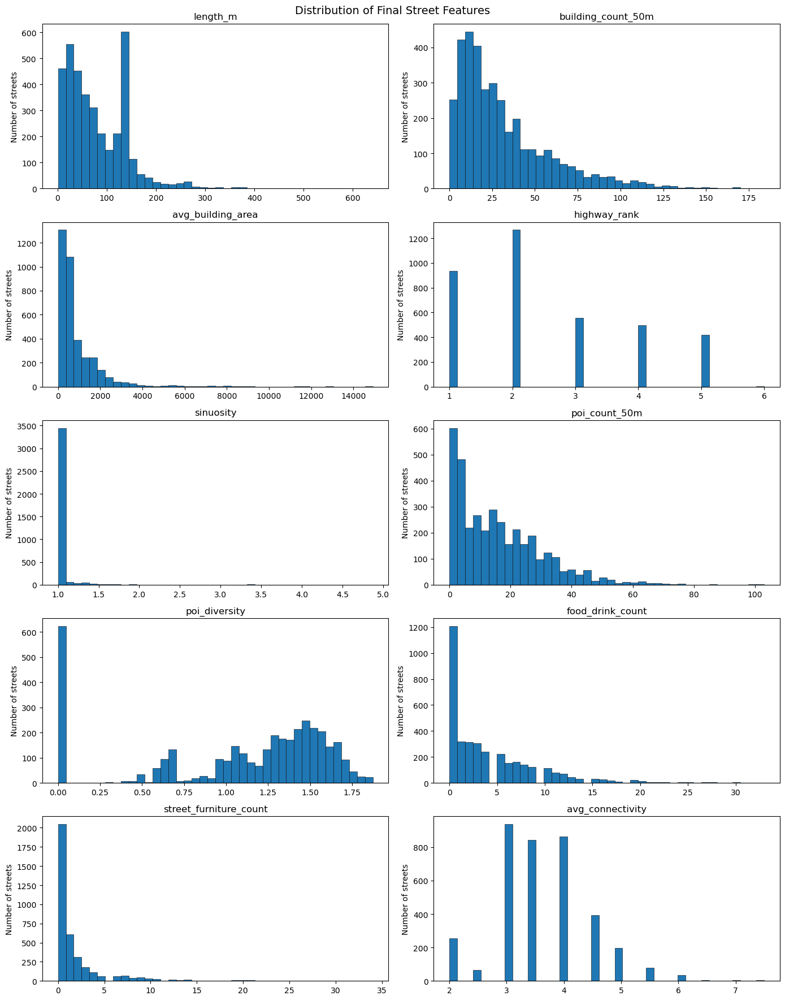

Saved: outputs/final_feature_distributions.png


In [20]:
# Plot the distribution of each final feature

fig, axes = plt.subplots(5, 2, figsize=(14, 18))
axes = axes.flatten()

for i, feature in enumerate(FEATURE_COLS):
    axes[i].hist(
        all_features[feature],
        bins=40,
        edgecolor='black',
        linewidth=0.4
    )
    axes[i].set_title(feature)
    axes[i].set_xlabel('')
    axes[i].set_ylabel('Number of streets')

plt.suptitle(
    'Distribution of Final Street Features',
    fontsize=14
)

plt.tight_layout()

plt.savefig(
    '/home/jovyan/work/outputs/final_feature_distributions.png',
    dpi=200,
    bbox_inches='tight',
    facecolor='white'
)

plt.show()

print("Saved: outputs/final_feature_distributions.png")

### Feature transformation before clustering

Several features have right skewed distributions, particularly building area,
POI related counts and street furniture. I use a log transformation for
skewed non-negative features before standardisation so that a small number of
large values do not dominate the clustering.

In [21]:
# Transform strongly right-skewed features before clustering
# log1p handles zero values without removing any streets

LOG_FEATURES = [
    'length_m',
    'building_count_50m',
    'avg_building_area',
    'poi_count_50m',
    'food_drink_count',
    'street_furniture_count'
]

NON_LOG_FEATURES = [
    'highway_rank',
    'poi_diversity',
    'avg_connectivity'
]

print("Log-transformed features:")
for feature in LOG_FEATURES:
    print(f"  {feature}")

print("\nFeatures kept unchanged:")
for feature in NON_LOG_FEATURES:
    print(f"  {feature}")


# Create a copy of the 10 final features for clustering

X_final = all_features[FEATURE_COLS].copy()


# Apply log transformation to the skewed features

for feature in LOG_FEATURES:
    X_final[feature] = np.log1p(X_final[feature])


# Sinuosity starts at 1.0, where 1 represents a straight street
# Transform the amount above 1 rather than the original value

X_final['sinuosity'] = np.log1p(
    X_final['sinuosity'] - 1
)


# Check the final feature matrix

print("\nFinal feature matrix:")
print(f"Streets: {len(X_final)}")
print(f"Features: {X_final.shape[1]}")
print(f"Missing values: {X_final.isna().sum().sum()}")


# Compare skewness before and after transformation

skew_comparison = pd.DataFrame({
    'before': all_features[FEATURE_COLS].skew(),
    'after': X_final[FEATURE_COLS].skew()
}).round(3)

print("\nSkewness before and after transformation:")
print(skew_comparison)

Log-transformed features:
  length_m
  building_count_50m
  avg_building_area
  poi_count_50m
  food_drink_count
  street_furniture_count

Features kept unchanged:
  highway_rank
  poi_diversity
  avg_connectivity

Final feature matrix:
Streets: 3682
Features: 10
Missing values: 0

Skewness before and after transformation:
                        before  after
length_m                 1.668 -0.585
building_count_50m       1.582 -0.438
avg_building_area        4.397 -0.521
highway_rank             0.587  0.587
sinuosity               10.906  7.302
poi_count_50m            1.174 -0.653
poi_diversity           -0.893 -0.893
food_drink_count         1.665  0.113
street_furniture_count   3.790  1.237
avg_connectivity         0.425  0.425


### Feature standardisation

The transformed features are standardised before clustering because they are measured on different scales. Standardisation gives each feature a mean of zero and a standard deviation of one so that variables with larger numerical values do not dominate the clustering.

In [22]:
# Standardise the 10 features before clustering
# Each feature gets mean 0 and standard deviation 1
# so variables with larger numerical values do not dominate

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_final[FEATURE_COLS])

X_scaled = pd.DataFrame(
    X_scaled,
    columns=FEATURE_COLS,
    index=X_final.index
)

print(f"Streets: {X_scaled.shape[0]}")
print(f"Features: {X_scaled.shape[1]}")
print("\nMean after standardisation (should be ~0):")
print(X_scaled.mean().round(3))
print("\nStd after standardisation (should be ~1):")
print(X_scaled.std(ddof=0).round(3))

Streets: 3682
Features: 10

Mean after standardisation (should be ~0):
length_m                  0.0
building_count_50m        0.0
avg_building_area        -0.0
highway_rank             -0.0
sinuosity                 0.0
poi_count_50m            -0.0
poi_diversity             0.0
food_drink_count          0.0
street_furniture_count    0.0
avg_connectivity         -0.0
dtype: float64

Std after standardisation (should be ~1):
length_m                  1.0
building_count_50m        1.0
avg_building_area         1.0
highway_rank              1.0
sinuosity                 1.0
poi_count_50m             1.0
poi_diversity             1.0
food_drink_count          1.0
street_furniture_count    1.0
avg_connectivity          1.0
dtype: float64


### Selecting the number of clusters

I test a range of K values before selecting the final number of street
typologies. The comparison uses inertia, silhouette score and cluster sizes
to assess both statistical performance and whether the resulting clusters
are large enough to represent meaningful street types.

In [23]:
# Test different numbers of clusters
# Compare inertia, silhouette score and the smallest cluster size

k_results = []

for k in range(2, 13):

    kmeans = KMeans(
        n_clusters=k,
        random_state=42,
        n_init=10
    )

    labels = kmeans.fit_predict(X_scaled)

    cluster_sizes = pd.Series(labels).value_counts()

    k_results.append({
        'k': k,
        'inertia': kmeans.inertia_,
        'silhouette': silhouette_score(X_scaled, labels),
        'smallest_cluster': cluster_sizes.min(),
        'largest_cluster': cluster_sizes.max()
    })

k_results = pd.DataFrame(k_results)

print(k_results.round(3).to_string(index=False))

 k   inertia  silhouette  smallest_cluster  largest_cluster
 2 26452.001       0.301              1203             2479
 3 22798.359       0.242               967             1692
 4 20931.612       0.211               748             1117
 5 18708.529       0.219                55             1092
 6 17301.975       0.216                54             1016
 7 16295.884       0.209                50              871
 8 15454.024       0.175                51              800
 9 14778.827       0.163                50              595
10 14233.786       0.168                18              594
11 13698.129       0.167                22              613
12 13255.929       0.167                24              561


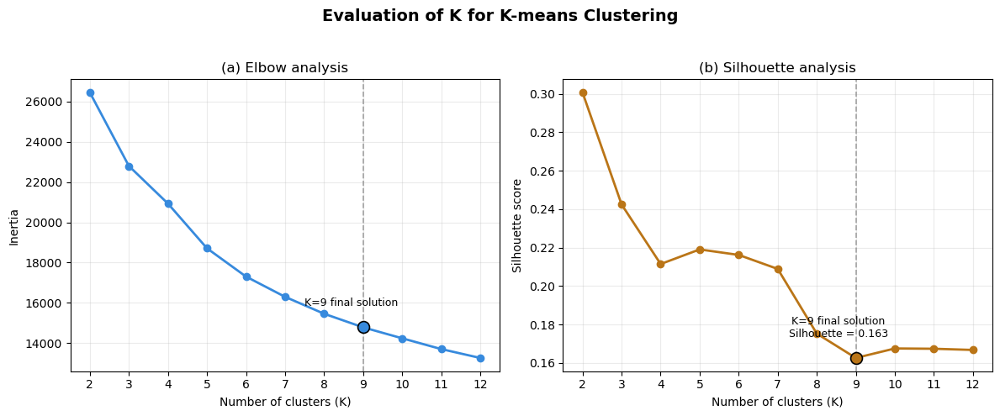

Saved: outputs/kmeans_k_evaluation_final.png


In [24]:
# Final evaluation figure for K-means clustering
# K=9 is highlighted as the final selected solution

fig, axes = plt.subplots(1, 2, figsize=(12, 5))

final_k = 9


# --------------------------------------------------
# (a) Elbow analysis
# --------------------------------------------------

axes[0].plot(
    k_results['k'],
    k_results['inertia'],
    marker='o',
    linewidth=2,
    markersize=6,
    color='#378ADD'
)

# Highlight final K=9 solution
k9_row = k_results[
    k_results['k'] == final_k
].iloc[0]

axes[0].scatter(
    k9_row['k'],
    k9_row['inertia'],
    s=100,
    color='#378ADD',
    edgecolor='black',
    linewidth=1.2,
    zorder=5
)

axes[0].axvline(
    final_k,
    linestyle='--',
    linewidth=1.2,
    color='grey',
    alpha=0.7
)

axes[0].annotate(
    'K=9 final solution',
    (k9_row['k'], k9_row['inertia']),
    xytext=(-10, 18),
    textcoords='offset points',
    ha='center',
    fontsize=9
)

axes[0].set_xlabel('Number of clusters (K)')
axes[0].set_ylabel('Inertia')
axes[0].set_title('(a) Elbow analysis')
axes[0].set_xticks(k_results['k'])
axes[0].grid(alpha=0.25)


# --------------------------------------------------
# (b) Silhouette analysis
# --------------------------------------------------

axes[1].plot(
    k_results['k'],
    k_results['silhouette'],
    marker='o',
    linewidth=2,
    markersize=6,
    color='#BA7517'
)

# Highlight final K=9 solution
axes[1].scatter(
    k9_row['k'],
    k9_row['silhouette'],
    s=100,
    color='#BA7517',
    edgecolor='black',
    linewidth=1.2,
    zorder=5
)

axes[1].axvline(
    final_k,
    linestyle='--',
    linewidth=1.2,
    color='grey',
    alpha=0.7
)

axes[1].annotate(
    f'K=9 final solution\n'
    f'Silhouette = {k9_row["silhouette"]:.3f}',
    (k9_row['k'], k9_row['silhouette']),
    xytext=(-15, 18),
    textcoords='offset points',
    ha='center',
    fontsize=9
)

axes[1].set_xlabel('Number of clusters (K)')
axes[1].set_ylabel('Silhouette score')
axes[1].set_title('(b) Silhouette analysis')
axes[1].set_xticks(k_results['k'])
axes[1].grid(alpha=0.25)


# --------------------------------------------------
# Overall figure
# --------------------------------------------------

fig.suptitle(
    'Evaluation of K for K-means Clustering',
    fontsize=14,
    fontweight='bold'
)

plt.tight_layout(
    rect=[0, 0, 1, 0.95]
)

plt.savefig(
    '/home/jovyan/work/outputs/'
    'kmeans_k_evaluation_final.png',
    dpi=300,
    bbox_inches='tight',
    facecolor='white'
)

plt.show()

print(
    "Saved: outputs/"
    "kmeans_k_evaluation_final.png"
)

In [25]:
# Compare the two candidate clustering solutions
# K=5 follows the strongest local statistical result
# K=9 is also tested for greater typological detail

candidate_models = {}

for k in [5, 9]:

    model = KMeans(
        n_clusters=k,
        random_state=42,
        n_init=10
    )

    labels = model.fit_predict(X_scaled)

    candidate_models[k] = {
        'model': model,
        'labels': labels
    }

    sizes = pd.Series(labels).value_counts().sort_index()

    print(f"\n{'=' * 50}")
    print(f"K = {k}")
    print('=' * 50)

    print(f"Silhouette score: {silhouette_score(X_scaled, labels):.3f}")
    print("\nCluster sizes:")
    print(sizes.to_string())


K = 5
Silhouette score: 0.219

Cluster sizes:
0     731
1    1092
2      55
3     938
4     866

K = 9
Silhouette score: 0.163

Cluster sizes:
0    443
1    595
2    442
3    310
4     50
5    464
6    463
7    410
8    505


In [26]:
# Compare mean feature profiles for K=5 and K=9
# Values are shown in the original feature units to help interpret
# the street characteristics represented by each cluster

for k in [5, 9]:

    labels = candidate_models[k]['labels']

    profiles = all_features[FEATURE_COLS].copy()
    profiles['cluster'] = labels

    cluster_profiles = profiles.groupby('cluster')[FEATURE_COLS].mean()

    print(f"\n{'=' * 70}")
    print(f"K = {k}: mean feature values by cluster")
    print('=' * 70)

    display(cluster_profiles.round(2))


K = 5: mean feature values by cluster


,length_m,building_count_50m,avg_building_area,highway_rank,sinuosity,poi_count_50m,poi_diversity,food_drink_count,street_furniture_count,avg_connectivity
cluster,,,,,,,,,,
0,92.76,19.76,1045.77,2.27,1.03,27.75,1.47,6.12,6.53,3.55
1,113.47,31.67,706.61,3.00,1.01,25.50,1.41,7.72,0.77,4.05
2,184.93,41.85,744.27,1.11,2.26,17.65,1.02,4.36,2.53,3.32
3,65.96,62.11,132.69,1.82,1.03,3.07,0.40,0.19,0.09,3.14
4,38.24,8.69,1762.21,2.95,1.01,8.70,1.03,1.94,0.54,3.75



K = 9: mean feature values by cluster


,length_m,building_count_50m,avg_building_area,highway_rank,sinuosity,poi_count_50m,poi_diversity,food_drink_count,street_furniture_count,avg_connectivity
cluster,,,,,,,,,,
0,73.00,63.02,127.26,1.74,1.03,5.66,0.90,0.54,0.21,3.19
1,122.67,32.57,748.32,2.11,1.01,26.82,1.41,7.91,0.66,4.08
2,114.11,22.29,999.39,2.32,1.03,33.31,1.49,6.72,8.57,3.78
3,48.21,5.22,2301.87,2.80,1.02,3.58,0.54,0.29,0.19,3.50
4,186.86,41.40,766.73,1.12,2.33,19.00,1.05,4.78,2.78,3.35
5,110.20,28.45,767.41,4.44,1.00,24.43,1.43,7.38,1.19,3.96
6,19.62,10.74,1125.75,3.47,1.00,14.46,1.37,3.58,1.56,4.37
7,65.15,14.93,1458.00,1.60,1.03,13.64,1.25,4.10,1.34,2.88
8,59.19,63.32,113.25,1.89,1.02,1.26,0.02,0.00,0.01,3.12


### Movement and Place composite scores

Movement and Place scores are calculated after clustering to support
interpretation of the data-driven street typologies within the TfL
Movement and Place framework. The composite scores are not used as
inputs to K-means clustering.

Before aggregation, the direction of each feature is defined so that
higher standardised values consistently represent a stronger Movement
or Place characteristic.

In [27]:
# Features used to interpret clusters within the Movement and Place framework

MOVEMENT_FEATURES = [
    'length_m',
    'building_count_50m',
    'avg_building_area',
    'highway_rank',
    'sinuosity'
]

PLACE_FEATURES = [
    'poi_count_50m',
    'poi_diversity',
    'food_drink_count',
    'street_furniture_count',
    'avg_connectivity'
]

print("Movement features:")
for feature in MOVEMENT_FEATURES:
    print(f"  {feature}")

print("\nPlace features:")
for feature in PLACE_FEATURES:
    print(f"  {feature}")

Movement features:
  length_m
  building_count_50m
  avg_building_area
  highway_rank
  sinuosity

Place features:
  poi_count_50m
  poi_diversity
  food_drink_count
  street_furniture_count
  avg_connectivity


### Feature direction for Movement and Place scores

The ten features capture different aspects of street morphology, network
function and surrounding activity. Before constructing the composite
Movement and Place scores, the expected relationship between each feature
and its respective dimension is defined explicitly. This prevents variables
with opposing conceptual directions from cancelling one another during
aggregation.

In [28]:
# Review the expected direction of each feature before aggregation
# Direction will be confirmed from the literature before final scores are calculated

feature_direction = pd.DataFrame({
    'feature': [
        'length_m',
        'building_count_50m',
        'avg_building_area',
        'highway_rank',
        'sinuosity',
        'poi_count_50m',
        'poi_diversity',
        'food_drink_count',
        'street_furniture_count',
        'avg_connectivity'
    ],
    'dimension': [
        'Movement',
        'Movement',
        'Movement',
        'Movement',
        'Movement',
        'Place',
        'Place',
        'Place',
        'Place',
        'Place'
    ]
})

display(feature_direction)

,feature,dimension
0,length_m,Movement
1,building_count_50m,Movement
2,avg_building_area,Movement
3,highway_rank,Movement
4,sinuosity,Movement
5,poi_count_50m,Place
6,poi_diversity,Place
7,food_drink_count,Place
8,street_furniture_count,Place
9,avg_connectivity,Place


### Movement and Place scores

Movement and Place scores are calculated to interpret the resulting clusters
within the two-dimensional Movement and Place framework. These scores are not
used as inputs to K-means clustering.

The clustering itself uses all ten standardised features. The composite scores
are calculated afterwards by combining the five features assigned to each
dimension.

In [29]:
# Calculate Movement and Place scores for interpretation
# Scores are calculated from the standardised feature values
# and are not used as inputs to K-means

score_features = X_scaled.copy()

# Higher sinuosity represents a less direct street geometry,
# so reverse its direction for the Movement score
score_features['sinuosity'] = -score_features['sinuosity']

score_features['movement_score'] = (
    score_features[MOVEMENT_FEATURES].mean(axis=1)
)

score_features['place_score'] = (
    score_features[PLACE_FEATURES].mean(axis=1)
)

print("Movement and Place scores calculated.")
print(
    score_features[['movement_score', 'place_score']]
    .describe()
    .round(3)
)

Movement and Place scores calculated.
       movement_score  place_score
count        3682.000     3682.000
mean           -0.000       -0.000
std             0.405        0.768
min            -2.824       -1.606
25%            -0.232       -0.643
50%             0.020        0.146
75%             0.272        0.601
max             1.011        1.708


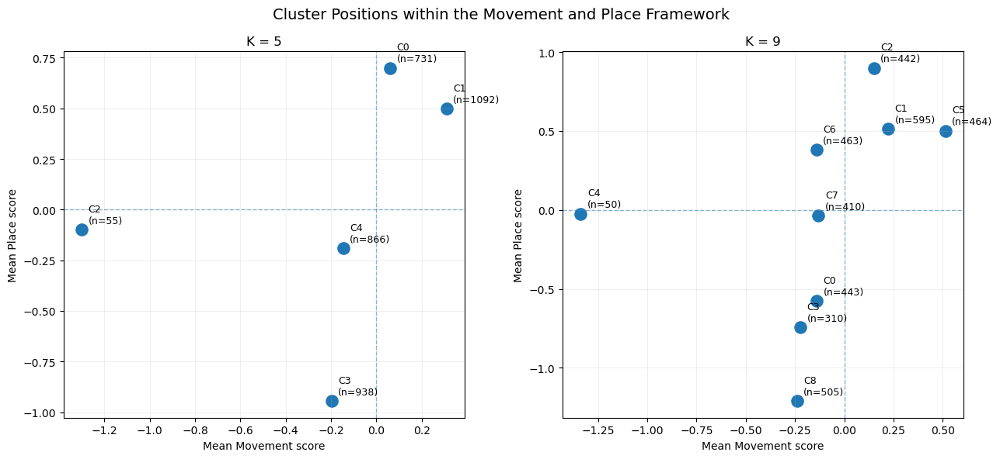

Saved: outputs/movement_place_k5_k9_comparison.png


In [30]:
# Compare cluster positions within the Movement and Place framework
# Each point shows the mean Movement and Place score of one cluster

fig, axes = plt.subplots(1, 2, figsize=(13, 6))

for ax, k in zip(axes, [5, 9]):

    plot_data = score_features[
        ['movement_score', 'place_score']
    ].copy()

    plot_data['cluster'] = candidate_models[k]['labels']

    cluster_means = (
        plot_data
        .groupby('cluster')[['movement_score', 'place_score']]
        .mean()
    )

    cluster_sizes = plot_data['cluster'].value_counts()

    # Plot cluster means
    ax.scatter(
        cluster_means['movement_score'],
        cluster_means['place_score'],
        s=120
    )

    # Add cluster number and size
    for cluster, row in cluster_means.iterrows():
        ax.annotate(
            f"C{cluster}\n(n={cluster_sizes[cluster]})",
            (row['movement_score'], row['place_score']),
            xytext=(6, 6),
            textcoords='offset points',
            fontsize=9
        )

    # Overall mean reference lines
    ax.axvline(0, linewidth=1, linestyle='--', alpha=0.5)
    ax.axhline(0, linewidth=1, linestyle='--', alpha=0.5)

    ax.set_xlabel('Mean Movement score')
    ax.set_ylabel('Mean Place score')
    ax.set_title(f'K = {k}')
    ax.grid(alpha=0.2)

fig.suptitle(
    'Cluster Positions within the Movement and Place Framework',
    fontsize=14
)

plt.tight_layout()

plt.savefig(
    '/home/jovyan/work/outputs/'
    'movement_place_k5_k9_comparison.png',
    dpi=300,
    bbox_inches='tight',
    facecolor='white'
)

plt.show()

print(
    "Saved: outputs/movement_place_k5_k9_comparison.png"
)

In [31]:
# Print exact cluster mean Movement and Place scores
# for comparison between the two candidate solutions

for k in [5, 9]:

    comparison = score_features[
        ['movement_score', 'place_score']
    ].copy()

    comparison['cluster'] = candidate_models[k]['labels']

    cluster_summary = (
        comparison
        .groupby('cluster')
        .agg(
            movement_score=('movement_score', 'mean'),
            place_score=('place_score', 'mean'),
            n=('cluster', 'size')
        )
        .round(3)
    )

    print(f"\n{'=' * 55}")
    print(f"K = {k}: Movement and Place cluster means")
    print('=' * 55)

    display(cluster_summary)


K = 5: Movement and Place cluster means


,movement_score,place_score,n
cluster,,,
0,0.061,0.699,731
1,0.310,0.499,1092
2,-1.299,-0.100,55
3,-0.197,-0.945,938
4,-0.146,-0.190,866



K = 9: Movement and Place cluster means


,movement_score,place_score,n
cluster,,,
0,-0.139,-0.578,443
1,0.223,0.515,595
2,0.150,0.899,442
3,-0.222,-0.742,310
4,-1.337,-0.024,50
5,0.513,0.501,464
6,-0.140,0.382,463
7,-0.131,-0.036,410
8,-0.240,-1.210,505


In [32]:
# Add the K=9 cluster labels to the combined dataset
# and compare how the clusters are distributed across the four cities

all_features_k9 = all_features.copy()
all_features_k9['cluster'] = candidate_models[9]['labels']

city_cluster_counts = pd.crosstab(
    all_features_k9['city'],
    all_features_k9['cluster']
)

city_cluster_percent = pd.crosstab(
    all_features_k9['city'],
    all_features_k9['cluster'],
    normalize='index'
) * 100

print("Number of streets in each cluster by city:")
display(city_cluster_counts)

print("\nPercentage of each city's streets in each cluster:")
display(city_cluster_percent.round(1))

Number of streets in each cluster by city:


cluster,0,1,2,3,4,5,6,7,8
city,,,,,,,,,
Barcelona,15,480,230,88,9,335,281,84,0
London,1,79,210,94,19,85,162,277,0
Singapore,39,20,1,119,11,10,15,42,128
Tokyo,388,16,1,9,11,34,5,7,377



Percentage of each city's streets in each cluster:


cluster,0,1,2,3,4,5,6,7,8
city,,,,,,,,,
Barcelona,1.0,31.5,15.1,5.8,0.6,22.0,18.5,5.5,0.0
London,0.1,8.5,22.7,10.1,2.0,9.2,17.5,29.9,0.0
Singapore,10.1,5.2,0.3,30.9,2.9,2.6,3.9,10.9,33.2
Tokyo,45.8,1.9,0.1,1.1,1.3,4.0,0.6,0.8,44.5


In [33]:
# Compare the standardised feature profile of each K=9 cluster
# Positive values are above the overall dataset mean
# Negative values are below the overall dataset mean

k9_profile = X_scaled.copy()
k9_profile['cluster'] = candidate_models[9]['labels']

k9_standardised_means = (
    k9_profile
    .groupby('cluster')[FEATURE_COLS]
    .mean()
    .round(2)
)

print("K=9 standardised feature profiles:")
display(k9_standardised_means)

K=9 standardised feature profiles:


,length_m,building_count_50m,avg_building_area,highway_rank,sinuosity,poi_count_50m,poi_diversity,food_drink_count,street_furniture_count,avg_connectivity
cluster,,,,,,,,,,
0,0.03,1.01,-1.17,-0.59,-0.01,-0.57,-0.30,-0.92,-0.57,-0.53
1,0.75,0.31,0.21,-0.31,-0.15,0.79,0.61,0.88,-0.24,0.53
2,0.55,-0.11,0.47,-0.15,0.00,0.98,0.74,0.64,1.95,0.18
3,-0.71,-1.63,0.93,0.22,-0.08,-1.00,-0.93,-1.01,-0.59,-0.17
4,1.04,0.20,-0.02,-1.06,6.85,0.00,-0.03,-0.04,0.30,-0.34
5,0.59,0.13,0.15,1.46,-0.23,0.69,0.64,0.78,0.02,0.38
6,-1.28,-0.85,0.49,0.72,-0.21,0.24,0.52,0.14,0.13,0.88
7,-0.15,-0.52,0.72,-0.69,0.01,0.16,0.32,0.23,0.01,-0.90
8,-0.30,0.90,-1.37,-0.47,-0.05,-1.65,-1.86,-1.19,-0.74,-0.61


In [34]:
# Show the strongest characteristics of each cluster
# This helps identify which features distinguish each street type

for cluster in k9_standardised_means.index:

    profile = k9_standardised_means.loc[cluster]

    strongest = profile.reindex(
        profile.abs().sort_values(ascending=False).index
    ).head(5)

    print(f"\nCluster {cluster}")
    print(strongest)


Cluster 0
avg_building_area        -1.17
building_count_50m        1.01
food_drink_count         -0.92
highway_rank             -0.59
street_furniture_count   -0.57
Name: 0, dtype: float64

Cluster 1
food_drink_count    0.88
poi_count_50m       0.79
length_m            0.75
poi_diversity       0.61
avg_connectivity    0.53
Name: 1, dtype: float64

Cluster 2
street_furniture_count    1.95
poi_count_50m             0.98
poi_diversity             0.74
food_drink_count          0.64
length_m                  0.55
Name: 2, dtype: float64

Cluster 3
building_count_50m   -1.63
food_drink_count     -1.01
poi_count_50m        -1.00
poi_diversity        -0.93
avg_building_area     0.93
Name: 3, dtype: float64

Cluster 4
sinuosity                 6.85
highway_rank             -1.06
length_m                  1.04
avg_connectivity         -0.34
street_furniture_count    0.30
Name: 4, dtype: float64

Cluster 5
highway_rank        1.46
food_drink_count    0.78
poi_count_50m       0.69
poi_diversity 

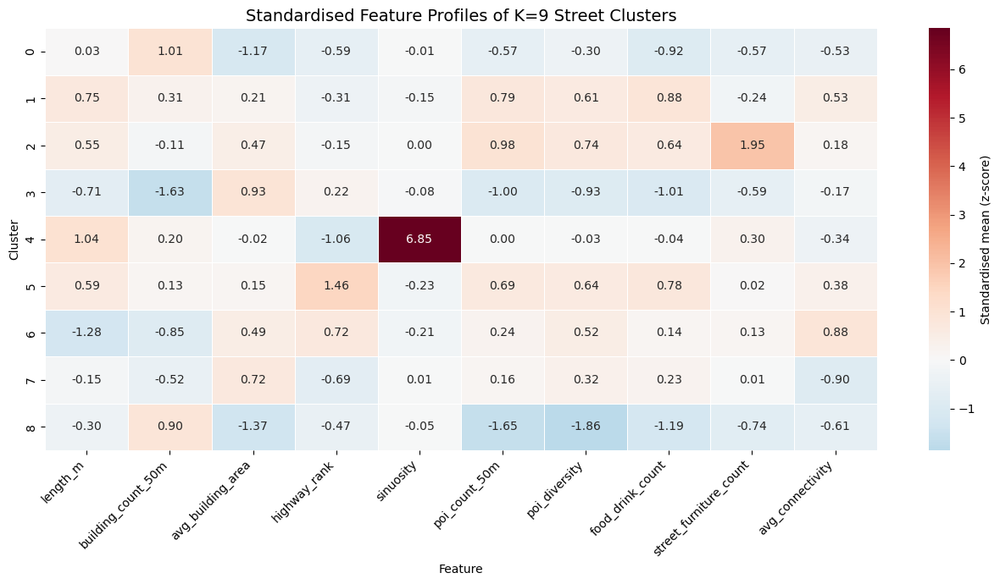

In [35]:
# Visualise standardised K=9 cluster profiles as a heatmap

import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(13, 7))

sns.heatmap(
    k9_standardised_means,
    annot=True,
    fmt=".2f",
    cmap="RdBu_r",
    center=0,
    linewidths=0.5,
    cbar_kws={'label': 'Standardised mean (z-score)'}
)

plt.title(
    'Standardised Feature Profiles of K=9 Street Clusters',
    fontsize=14
)
plt.xlabel('Feature')
plt.ylabel('Cluster')

plt.xticks(rotation=45, ha='right')
plt.tight_layout()

plt.show()

In [36]:
# Attach K=9 cluster labels to the combined street dataset
# This allows the cluster results to be mapped across all four cities

all_features['cluster'] = candidate_models[9]['labels']

print("K=9 cluster labels added.")
print("\nCluster sizes:")
print(
    all_features['cluster']
    .value_counts()
    .sort_index()
)

K=9 cluster labels added.

Cluster sizes:
cluster
0    443
1    595
2    442
3    310
4     50
5    464
6    463
7    410
8    505
Name: count, dtype: int64


In [37]:
# Split the combined results back into the four cities
# while keeping the same K=9 cluster labels

london_k9 = all_features[
    all_features['city'] == 'London'
].copy()

barcelona_k9 = all_features[
    all_features['city'] == 'Barcelona'
].copy()

singapore_k9 = all_features[
    all_features['city'] == 'Singapore'
].copy()

tokyo_k9 = all_features[
    all_features['city'] == 'Tokyo'
].copy()

print("K=9 streets by city:")
print(f"London: {len(london_k9)}")
print(f"Barcelona: {len(barcelona_k9)}")
print(f"Singapore: {len(singapore_k9)}")
print(f"Tokyo: {len(tokyo_k9)}")

K=9 streets by city:
London: 927
Barcelona: 1522
Singapore: 385
Tokyo: 848


### Cross-city Movement and Place comparison

To examine whether the identified street types occupy similar positions within the Movement and Place framework across different urban contexts, mean Movement and Place scores are calculated for each cluster within each city.

In [38]:
# Calculate mean Movement and Place scores for each cluster within each city

city_cluster_scores = all_features[
    ['city', 'cluster']
].copy()

city_cluster_scores['movement_score'] = (
    score_features['movement_score'].values
)

city_cluster_scores['place_score'] = (
    score_features['place_score'].values
)

city_cluster_means = (
    city_cluster_scores
    .groupby(['city', 'cluster'])
    .agg(
        movement_score=('movement_score', 'mean'),
        place_score=('place_score', 'mean'),
        n=('cluster', 'size')
    )
    .reset_index()
)

print(
    f"City-cluster combinations: "
    f"{len(city_cluster_means)}"
)

display(
    city_cluster_means.round(3)
)

City-cluster combinations: 34


,city,cluster,movement_score,place_score,n
0,Barcelona,0,-0.032,-0.420,15
1,Barcelona,1,0.259,0.523,480
2,Barcelona,2,0.214,1.033,230
3,Barcelona,3,-0.134,-0.471,88
4,Barcelona,4,-0.847,0.468,9
5,Barcelona,5,0.522,0.541,335
6,Barcelona,6,-0.181,0.372,281
7,Barcelona,7,0.052,0.024,84
8,London,0,-0.432,-0.110,1
9,London,1,0.104,0.582,79


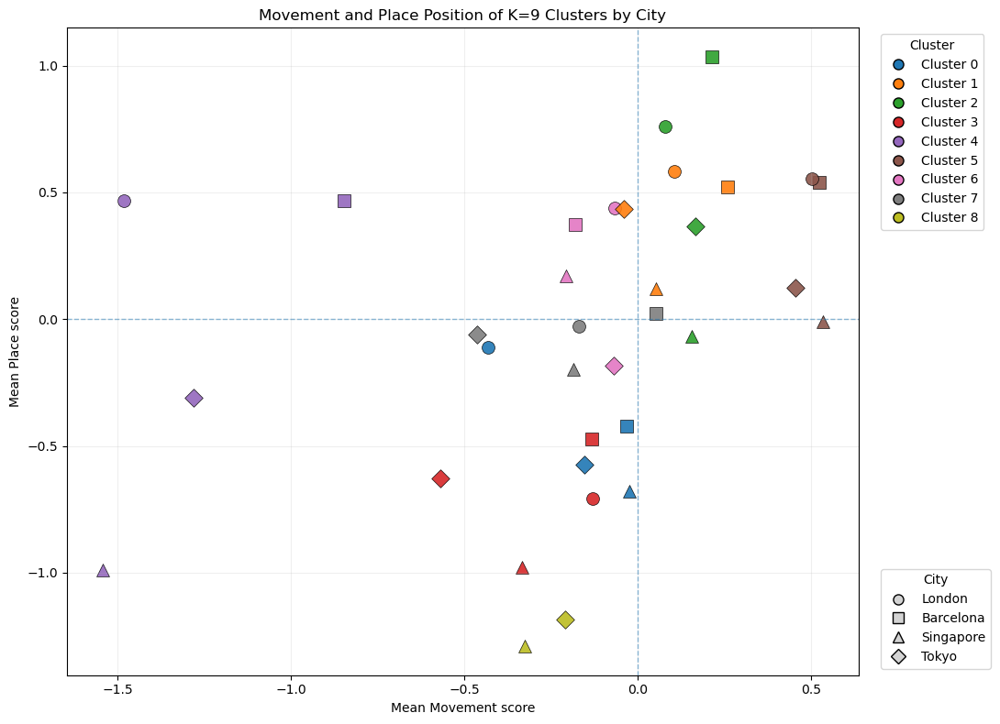

Saved: outputs/movement_place_clusters_by_city.png


In [39]:
# Plot cluster mean Movement and Place scores by city
# Cluster colour stays consistent and marker shape identifies the city

from matplotlib.lines import Line2D

cluster_colours = {
    0: '#1f77b4',
    1: '#ff7f0e',
    2: '#2ca02c',
    3: '#d62728',
    4: '#9467bd',
    5: '#8c564b',
    6: '#e377c2',
    7: '#7f7f7f',
    8: '#bcbd22'
}

city_markers = {
    'London': 'o',
    'Barcelona': 's',
    'Singapore': '^',
    'Tokyo': 'D'
}

fig, ax = plt.subplots(figsize=(11, 8))

for _, row in city_cluster_means.iterrows():

    ax.scatter(
        row['movement_score'],
        row['place_score'],
        color=cluster_colours[row['cluster']],
        marker=city_markers[row['city']],
        s=100,
        edgecolor='black',
        linewidth=0.5,
        alpha=0.9
    )

# Overall mean reference lines
ax.axvline(
    0,
    linestyle='--',
    linewidth=1,
    alpha=0.5
)

ax.axhline(
    0,
    linestyle='--',
    linewidth=1,
    alpha=0.5
)

ax.set_xlabel('Mean Movement score')
ax.set_ylabel('Mean Place score')

ax.set_title(
    'Movement and Place Position of K=9 Clusters by City'
)

ax.grid(alpha=0.2)


# Cluster legend

cluster_handles = [
    Line2D(
        [0],
        [0],
        marker='o',
        linestyle='None',
        markerfacecolor=cluster_colours[c],
        markeredgecolor='black',
        markersize=8,
        label=f'Cluster {c}'
    )
    for c in range(9)
]

cluster_legend = ax.legend(
    handles=cluster_handles,
    title='Cluster',
    loc='upper left',
    bbox_to_anchor=(1.02, 1)
)

ax.add_artist(cluster_legend)


# City legend

city_handles = [
    Line2D(
        [0],
        [0],
        marker=marker,
        linestyle='None',
        markerfacecolor='lightgrey',
        markeredgecolor='black',
        markersize=8,
        label=city
    )
    for city, marker in city_markers.items()
]

ax.legend(
    handles=city_handles,
    title='City',
    loc='lower left',
    bbox_to_anchor=(1.02, 0)
)

plt.tight_layout()

plt.savefig(
    '/home/jovyan/work/outputs/'
    'movement_place_clusters_by_city.png',
    dpi=300,
    bbox_inches='tight',
    facecolor='white'
)

plt.show()

print(
    "Saved: outputs/"
    "movement_place_clusters_by_city.png"
)

### Spatial distribution of the K=9 clusters

The final cluster labels are attached back to the cleaned street geometries to examine how the typologies are distributed within each city. The same cluster numbering is retained across all four cities.

In [40]:
# Attach K=9 labels back to the original street geometries
# The order matches the combined dataset used for clustering

k9_labels = candidate_models[9]['labels']

n_london = len(city_dfs['London'])
n_barcelona = len(city_dfs['Barcelona'])
n_singapore = len(city_dfs['Singapore'])
n_tokyo = len(city_dfs['Tokyo'])

start = 0

london_k9 = city_dfs['London'].copy()
london_k9['cluster'] = k9_labels[
    start:start + n_london
]
start += n_london

barcelona_k9 = city_dfs['Barcelona'].copy()
barcelona_k9['cluster'] = k9_labels[
    start:start + n_barcelona
]
start += n_barcelona

singapore_k9 = city_dfs['Singapore'].copy()
singapore_k9['cluster'] = k9_labels[
    start:start + n_singapore
]
start += n_singapore

tokyo_k9 = city_dfs['Tokyo'].copy()
tokyo_k9['cluster'] = k9_labels[
    start:start + n_tokyo
]

print("K=9 labels attached to street geometries.")

for city_name, df in [
    ('London', london_k9),
    ('Barcelona', barcelona_k9),
    ('Singapore', singapore_k9),
    ('Tokyo', tokyo_k9)
]:
    print(
        f"{city_name}: {len(df)} streets, "
        f"{df['cluster'].nunique()} clusters, "
        f"geometry = {'geometry' in df.columns}"
    )

K=9 labels attached to street geometries.
London: 927 streets, 8 clusters, geometry = True
Barcelona: 1522 streets, 8 clusters, geometry = True
Singapore: 385 streets, 9 clusters, geometry = True
Tokyo: 848 streets, 9 clusters, geometry = True


In [41]:
# Check that the mapped cluster counts match the earlier results

for city_name, df in [
    ('London', london_k9),
    ('Barcelona', barcelona_k9),
    ('Singapore', singapore_k9),
    ('Tokyo', tokyo_k9)
]:

    print(f"\n{city_name}")
    print(
        df['cluster']
        .value_counts()
        .sort_index()
    )


London
cluster
0      1
1     79
2    210
3     94
4     19
5     85
6    162
7    277
Name: count, dtype: int64

Barcelona
cluster
0     15
1    480
2    230
3     88
4      9
5    335
6    281
7     84
Name: count, dtype: int64

Singapore
cluster
0     39
1     20
2      1
3    119
4     11
5     10
6     15
7     42
8    128
Name: count, dtype: int64

Tokyo
cluster
0    388
1     16
2      1
3      9
4     11
5     34
6      5
7      7
8    377
Name: count, dtype: int64


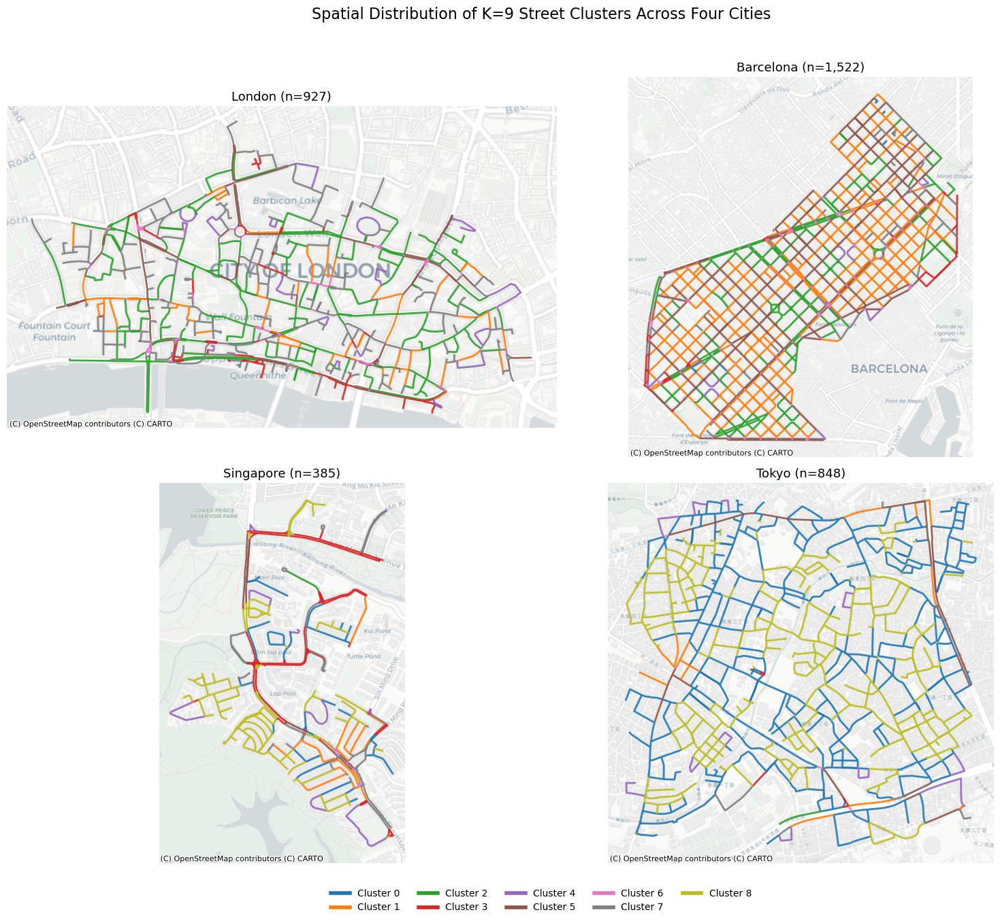

Saved: outputs/k9_clusters_four_cities.png


In [42]:
# Map the K=9 clusters across all four cities
# The same cluster colours are used in every city

from matplotlib.lines import Line2D

cluster_colours = {
    0: '#1f77b4',
    1: '#ff7f0e',
    2: '#2ca02c',
    3: '#d62728',
    4: '#9467bd',
    5: '#8c564b',
    6: '#e377c2',
    7: '#7f7f7f',
    8: '#bcbd22'
}

city_maps = {
    'London': london_k9,
    'Barcelona': barcelona_k9,
    'Singapore': singapore_k9,
    'Tokyo': tokyo_k9
}

fig, axes = plt.subplots(
    2, 2,
    figsize=(16, 14)
)

axes = axes.flatten()

for ax, (city_name, gdf) in zip(axes, city_maps.items()):

    # Convert to Web Mercator for the basemap
    plot_gdf = gdf.to_crs(epsg=3857)

    # Plot each cluster using the same colour across cities
    for cluster in range(9):

        cluster_streets = plot_gdf[
            plot_gdf['cluster'] == cluster
        ]

        if len(cluster_streets) > 0:
            cluster_streets.plot(
                ax=ax,
                color=cluster_colours[cluster],
                linewidth=2.0,
                alpha=0.9
            )

    # Add a light basemap for spatial context
    ctx.add_basemap(
        ax,
        source=ctx.providers.CartoDB.Positron
    )

    ax.set_title(
        f'{city_name} (n={len(gdf):,})',
        fontsize=13
    )

    ax.set_axis_off()


# Shared cluster legend
legend_handles = [
    Line2D(
        [0],
        [0],
        color=cluster_colours[cluster],
        linewidth=4,
        label=f'Cluster {cluster}'
    )
    for cluster in range(9)
]

fig.legend(
    handles=legend_handles,
    loc='lower center',
    ncol=5,
    frameon=False,
    fontsize=10,
    bbox_to_anchor=(0.5, 0.02)
)

fig.suptitle(
    'Spatial Distribution of K=9 Street Clusters Across Four Cities',
    fontsize=16
)

plt.tight_layout(
    rect=[0, 0.07, 1, 0.96]
)

plt.savefig(
    '/home/jovyan/work/outputs/'
    'k9_clusters_four_cities.png',
    dpi=300,
    bbox_inches='tight',
    facecolor='white'
)

plt.show()

print(
    "Saved: outputs/"
    "k9_clusters_four_cities.png"
)

### Inspection of the high-sinuosity cluster

Cluster 4 is examined separately because its feature profile is strongly distinguished by high sinuosity. Its spatial distribution and underlying street geometries are inspected to determine whether it represents a meaningful morphological street type or a small group of geometric outliers.

In [43]:
# Inspect Cluster 4 across the four cities
# This cluster is strongly distinguished by high sinuosity

cluster4_cities = {
    'London': london_k9,
    'Barcelona': barcelona_k9,
    'Singapore': singapore_k9,
    'Tokyo': tokyo_k9
}

print("Cluster 4 summary by city:")

for city_name, gdf in cluster4_cities.items():

    c4 = gdf[gdf['cluster'] == 4]

    print(f"\n{city_name}")
    print(f"Streets: {len(c4)}")

    if len(c4) > 0:
        print(
            f"Sinuosity: "
            f"min={c4['sinuosity'].min():.3f}, "
            f"median={c4['sinuosity'].median():.3f}, "
            f"max={c4['sinuosity'].max():.3f}"
        )

        print(
            f"Length: "
            f"min={c4['length_m'].min():.1f} m, "
            f"median={c4['length_m'].median():.1f} m, "
            f"max={c4['length_m'].max():.1f} m"
        )

Cluster 4 summary by city:

London
Streets: 19
Sinuosity: min=1.533, median=2.472, max=4.873
Length: min=15.1 m, median=158.5 m, max=377.4 m

Barcelona
Streets: 9
Sinuosity: min=1.585, median=1.689, max=2.461
Length: min=28.4 m, median=264.9 m, max=364.1 m

Singapore
Streets: 11
Sinuosity: min=1.710, median=2.056, max=3.292
Length: min=16.3 m, median=123.2 m, max=541.1 m

Tokyo
Streets: 11
Sinuosity: min=1.558, median=2.038, max=3.341
Length: min=92.3 m, median=136.7 m, max=332.9 m


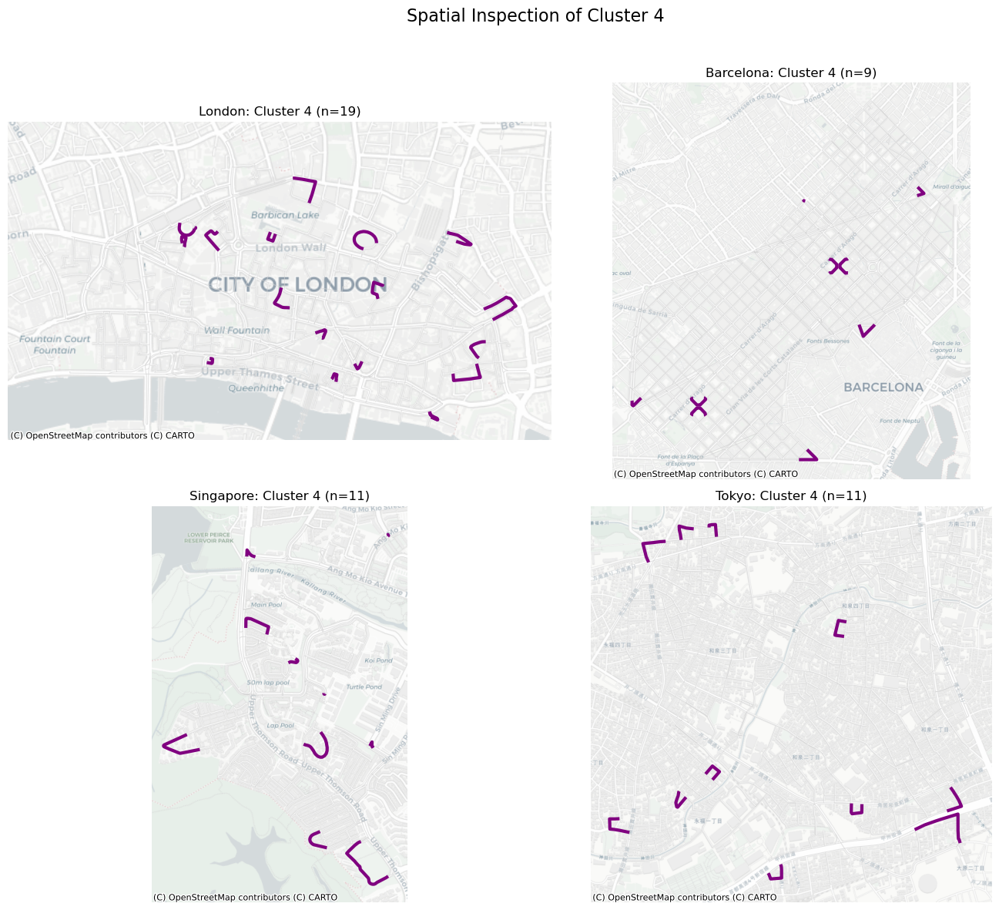

Saved: outputs/cluster4_spatial_inspection.png


In [44]:
# Map Cluster 4 separately in each city

fig, axes = plt.subplots(
    2, 2,
    figsize=(14, 12)
)

axes = axes.flatten()

for ax, (city_name, gdf) in zip(
    axes,
    cluster4_cities.items()
):

    plot_gdf = gdf.to_crs(epsg=3857)

    # Full study network in the background
    plot_gdf.plot(
        ax=ax,
        color='lightgrey',
        linewidth=0.8,
        alpha=0.6
    )

    cluster4 = plot_gdf[
        plot_gdf['cluster'] == 4
    ]

    if len(cluster4) > 0:
        cluster4.plot(
            ax=ax,
            color='purple',
            linewidth=3
        )

    ctx.add_basemap(
        ax,
        source=ctx.providers.CartoDB.Positron
    )

    ax.set_title(
        f'{city_name}: Cluster 4 (n={len(cluster4)})'
    )

    ax.set_axis_off()

fig.suptitle(
    'Spatial Inspection of Cluster 4',
    fontsize=16
)

plt.tight_layout(
    rect=[0, 0, 1, 0.96]
)

plt.savefig(
    '/home/jovyan/work/outputs/'
    'cluster4_spatial_inspection.png',
    dpi=300,
    bbox_inches='tight',
    facecolor='white'
)

plt.show()

print(
    "Saved: outputs/"
    "cluster4_spatial_inspection.png"
)

### Interpretation of the final K=9 street typologies

The final clusters are interpreted using their standardised feature profiles, Movement and Place scores, cluster sizes and distribution across the four study cities. This allows the data-driven clusters to be translated into interpretable street typologies.

In [45]:
# Build a summary table for interpreting and naming the final K=9 clusters

typology_summary = k9_standardised_means.copy()

# Add overall Movement and Place scores
k9_mp_summary = (
    score_features
    .assign(cluster=candidate_models[9]['labels'])
    .groupby('cluster')[
        ['movement_score', 'place_score']
    ]
    .mean()
)

typology_summary[
    ['movement_score', 'place_score']
] = k9_mp_summary

# Add cluster size
typology_summary['n'] = (
    pd.Series(candidate_models[9]['labels'])
    .value_counts()
    .sort_index()
)

# Add percentage of the complete dataset
typology_summary['percent'] = (
    typology_summary['n']
    / len(all_features)
    * 100
)

typology_summary = typology_summary.round(2)

print("Final K=9 typology interpretation table:")
display(typology_summary)

Final K=9 typology interpretation table:


,length_m,building_count_50m,avg_building_area,highway_rank,sinuosity,poi_count_50m,poi_diversity,food_drink_count,street_furniture_count,avg_connectivity,movement_score,place_score,n,percent
cluster,,,,,,,,,,,,,,
0,0.03,1.01,-1.17,-0.59,-0.01,-0.57,-0.30,-0.92,-0.57,-0.53,-0.14,-0.58,443,12.03
1,0.75,0.31,0.21,-0.31,-0.15,0.79,0.61,0.88,-0.24,0.53,0.22,0.51,595,16.16
2,0.55,-0.11,0.47,-0.15,0.00,0.98,0.74,0.64,1.95,0.18,0.15,0.90,442,12.00
3,-0.71,-1.63,0.93,0.22,-0.08,-1.00,-0.93,-1.01,-0.59,-0.17,-0.22,-0.74,310,8.42
4,1.04,0.20,-0.02,-1.06,6.85,0.00,-0.03,-0.04,0.30,-0.34,-1.34,-0.02,50,1.36
5,0.59,0.13,0.15,1.46,-0.23,0.69,0.64,0.78,0.02,0.38,0.51,0.50,464,12.60
6,-1.28,-0.85,0.49,0.72,-0.21,0.24,0.52,0.14,0.13,0.88,-0.14,0.38,463,12.57
7,-0.15,-0.52,0.72,-0.69,0.01,0.16,0.32,0.23,0.01,-0.90,-0.13,-0.04,410,11.14
8,-0.30,0.90,-1.37,-0.47,-0.05,-1.65,-1.86,-1.19,-0.74,-0.61,-0.24,-1.21,505,13.72


In [46]:
# Show the city composition of each final cluster

cluster_city_counts = pd.crosstab(
    all_features['cluster'],
    all_features['city']
)

cluster_city_percent = (
    cluster_city_counts
    .div(
        cluster_city_counts.sum(axis=1),
        axis=0
    )
    * 100
).round(1)

print("Number of streets from each city:")
display(cluster_city_counts)

print("\nPercentage composition of each cluster:")
display(cluster_city_percent)

Number of streets from each city:


city,Barcelona,London,Singapore,Tokyo
cluster,,,,
0,15,1,39,388
1,480,79,20,16
2,230,210,1,1
3,88,94,119,9
4,9,19,11,11
5,335,85,10,34
6,281,162,15,5
7,84,277,42,7
8,0,0,128,377



Percentage composition of each cluster:


city,Barcelona,London,Singapore,Tokyo
cluster,,,,
0,3.4,0.2,8.8,87.6
1,80.7,13.3,3.4,2.7
2,52.0,47.5,0.2,0.2
3,28.4,30.3,38.4,2.9
4,18.0,38.0,22.0,22.0
5,72.2,18.3,2.2,7.3
6,60.7,35.0,3.2,1.1
7,20.5,67.6,10.2,1.7
8,0.0,0.0,25.3,74.7


In [171]:
# Final names for the K=9 street typologies
# Names are based on the standardised feature profiles,
# Movement and Place scores and spatial inspection

TYPOLOGY_NAMES = {
    0: 'High-Building-Count Low-Activity Streets',
    1: 'Active Mixed-Use Streets',
    2: 'Amenity-Rich Public Realm Streets',
    3: 'Low-Building-Count Low-Activity Streets',
    4: 'Sinuous Streets',
    5: 'Movement-Intensive Active Streets',
    6: 'Short Connected Activity Streets',
    7: 'Low-Connectivity Mixed Streets',
    8: 'High-Building-Count Low-Place Streets'
}

all_features['typology'] = (
    all_features['cluster']
    .map(TYPOLOGY_NAMES)
)

for gdf in [
    london_k9,
    barcelona_k9,
    singapore_k9,
    tokyo_k9
]:
    gdf['typology'] = (
        gdf['cluster']
        .map(TYPOLOGY_NAMES)
    )

print("Final typology names added.")

for cluster, name in TYPOLOGY_NAMES.items():
    print(f"C{cluster}: {name}")

Final typology names added.
C0: High-Building-Count Low-Activity Streets
C1: Active Mixed-Use Streets
C2: Amenity-Rich Public Realm Streets
C3: Low-Building-Count Low-Activity Streets
C4: Sinuous Streets
C5: Movement-Intensive Active Streets
C6: Short Connected Activity Streets
C7: Low-Connectivity Mixed Streets
C8: High-Building-Count Low-Place Streets


### Final street typology profiles

The nine street typologies are compared using their mean standardised feature values. Positive values indicate characteristics above the overall dataset mean, while negative values indicate characteristics below the overall mean.

In [172]:
# Final names for the nine K=9 street typologies

typology_names = {
    0: 'High-Building-Count Low-Activity Streets',
    1: 'Active Mixed-Use Streets',
    2: 'Amenity-Rich Public Realm Streets',
    3: 'Low-Building-Count Low-Activity Streets',
    4: 'Sinuous Streets',
    5: 'Movement-Intensive Active Streets',
    6: 'Short Connected Activity Streets',
    7: 'Low-Connectivity Mixed Streets',
    8: 'High-Building-Count Low-Place Streets'
}

print("Typology names defined.")

Typology names defined.


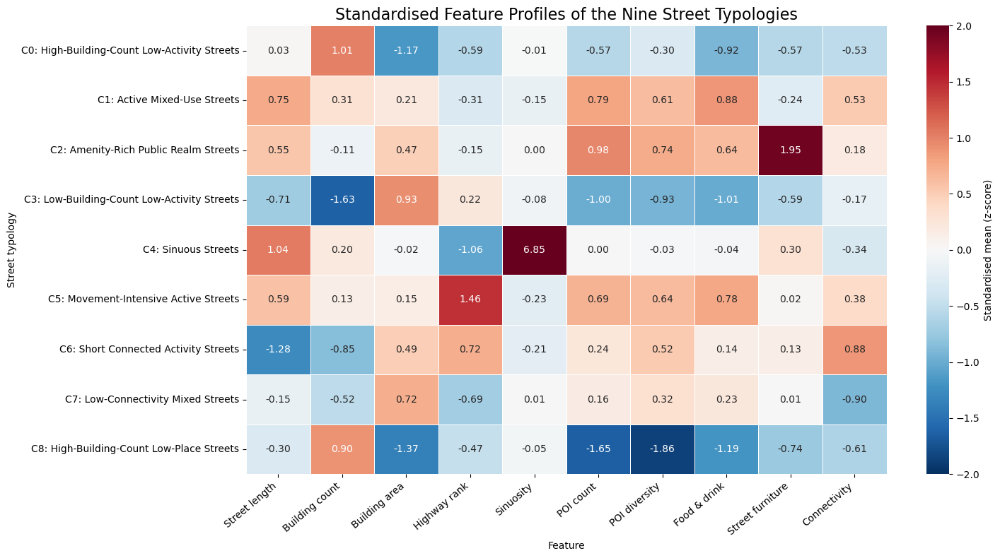

Saved: outputs/k9_typology_profiles_final.png


In [173]:
# Plot the final typology profiles
# Colour scale is capped at +/-2 so the profiles remain visually comparable
# Cell annotations still show the actual standardised values

typology_profile = k9_standardised_means.copy()

# Show both cluster number and typology name
typology_profile.index = [
    f'C{cluster}: {typology_names[cluster]}'
    for cluster in typology_profile.index
]

feature_labels = {
    'length_m': 'Street length',
    'building_count_50m': 'Building count',
    'avg_building_area': 'Building area',
    'highway_rank': 'Highway rank',
    'sinuosity': 'Sinuosity',
    'poi_count_50m': 'POI count',
    'poi_diversity': 'POI diversity',
    'food_drink_count': 'Food & drink',
    'street_furniture_count': 'Street furniture',
    'avg_connectivity': 'Connectivity'
}

typology_profile = typology_profile.rename(
    columns=feature_labels
)

plt.figure(figsize=(15, 8))

sns.heatmap(
    typology_profile,
    annot=True,
    fmt='.2f',
    cmap='RdBu_r',
    center=0,
    vmin=-2,
    vmax=2,
    linewidths=0.5,
    cbar_kws={
        'label': 'Standardised mean (z-score)'
    }
)

plt.title(
    'Standardised Feature Profiles of the Nine Street Typologies',
    fontsize=16
)

plt.xlabel('Feature')
plt.ylabel('Street typology')

plt.xticks(
    rotation=40,
    ha='right'
)

plt.yticks(rotation=0)

plt.tight_layout()

plt.savefig(
    '/home/jovyan/work/outputs/'
    'k9_typology_profiles_final.png',
    dpi=300,
    bbox_inches='tight',
    facecolor='white'
)

plt.show()

print(
    "Saved: outputs/"
    "k9_typology_profiles_final.png"
)

In [209]:
# Check the variables currently available for the PCA analysis
%whos

Variable                  Type                Data/Info
-------------------------------------------------------
Circle                    type                <class 'matplotlib.patches.Circle'>
DATA_DIR                  str                 /home/jovyan/work/data
FEATURE_COLS              list                n=10
FancyArrowPatch           type                <class 'matplotlib.patches.FancyArrowPatch'>
FancyBboxPatch            type                <class 'matplotlib.patches.FancyBboxPatch'>
KMeans                    ABCMeta             <class 'sklearn.cluster._kmeans.KMeans'>
LOG_FEATURES              list                n=6
Line2D                    type                <class 'matplotlib.lines.Line2D'>
MOVEMENT_FEATURES         list                n=5
MinMaxScaler              type                <class 'sklearn.preproces<...>sing._data.MinMaxScaler'>
NON_LOG_FEATURES          list                n=3
NORMALISED_FEATURE_COLS   list                n=4
NamespaceMagics           MetaHasTra

In [210]:
# ============================================================
# FINAL STREET TYPOLOGY NAMES
# Single source used throughout the notebook
# ============================================================

TYPOLOGY_NAMES = {
    0: 'High-Building-Count Low-Activity Streets',
    1: 'Active Mixed-Use Streets',
    2: 'Amenity-Rich Public Realm Streets',
    3: 'Low-Building-Count Low-Activity Streets',
    4: 'Sinuous Streets',
    5: 'Movement-Intensive Active Streets',
    6: 'Short Connected Activity Streets',
    7: 'Low-Connectivity Mixed Streets',
    8: 'High-Building-Count Low-Place Streets'
}

# Keep lower-case alias for existing plotting code
typology_names = TYPOLOGY_NAMES

print("Final typology names confirmed:")
for k, v in TYPOLOGY_NAMES.items():
    print(f"C{k}: {v}")

Final typology names confirmed:
C0: High-Building-Count Low-Activity Streets
C1: Active Mixed-Use Streets
C2: Amenity-Rich Public Realm Streets
C3: Low-Building-Count Low-Activity Streets
C4: Sinuous Streets
C5: Movement-Intensive Active Streets
C6: Short Connected Activity Streets
C7: Low-Connectivity Mixed Streets
C8: High-Building-Count Low-Place Streets


In [211]:
# ============================================================
# PCA OF THE STANDARDISED STREET-LEVEL FEATURE SPACE
# ============================================================

from sklearn.decomposition import PCA
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Use the same standardised 10-feature matrix used for K-means
pca = PCA(n_components=2)

pca_scores = pca.fit_transform(X_scaled)

# Create plotting dataframe
pca_df = pd.DataFrame({
    'PC1': pca_scores[:, 0],
    'PC2': pca_scores[:, 1],
    'cluster': k9_labels
})

# Final typology names
pca_typology_names = {
    0: 'High-Building-Count Low-Activity Streets',
    1: 'Active Mixed-Use Streets',
    2: 'Amenity-Rich Public Realm Streets',
    3: 'Low-Building-Count Low-Activity Streets',
    4: 'Sinuous Streets',
    5: 'Movement-Intensive Active Streets',
    6: 'Short Connected Activity Streets',
    7: 'Low-Connectivity Mixed Streets',
    8: 'High-Building-Count Low-Place Streets'
}

pca_df['typology'] = (
    pca_df['cluster']
    .map(pca_typology_names)
)

# Percentage of total variance represented by each component
pc1_var = pca.explained_variance_ratio_[0] * 100
pc2_var = pca.explained_variance_ratio_[1] * 100
total_var = pc1_var + pc2_var

print(f'PC1 variance explained: {pc1_var:.2f}%')
print(f'PC2 variance explained: {pc2_var:.2f}%')
print(f'Total variance explained by PC1 + PC2: {total_var:.2f}%')

print('\nPCA dataset shape:', pca_df.shape)

display(pca_df.head())

PC1 variance explained: 35.81%
PC2 variance explained: 17.79%
Total variance explained by PC1 + PC2: 53.60%

PCA dataset shape: (3682, 4)


,PC1,PC2,cluster,typology
0,1.453159,-2.728448,6,Short Connected Activity Streets
1,1.791460,0.000065,7,Low-Connectivity Mixed Streets
2,1.349629,-1.050094,6,Short Connected Activity Streets
3,0.655653,-1.736155,7,Low-Connectivity Mixed Streets
4,0.607560,-0.757028,7,Low-Connectivity Mixed Streets


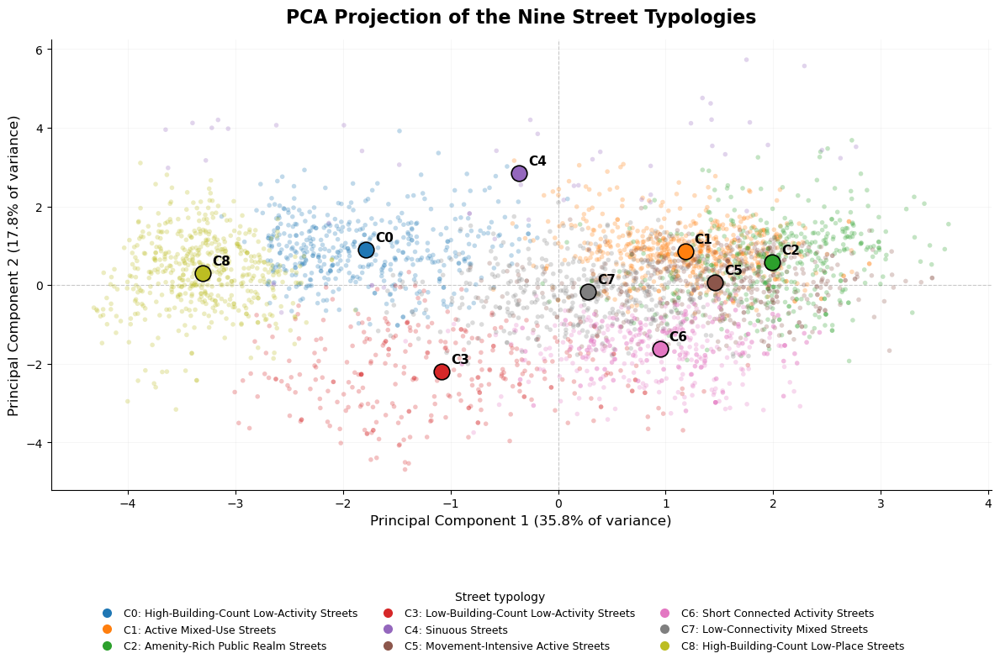

Saved: outputs/pca_typology_projection_final.png
PC1 + PC2 explain 53.6% of total variance.


In [222]:
# ============================================================
# FINAL PCA FIGURE
# ============================================================

from matplotlib.lines import Line2D
import matplotlib.pyplot as plt

# Create figure
fig, ax = plt.subplots(figsize=(12, 8))

# Same typology colours used throughout the dissertation
typology_colours = {
    0: '#1f77b4',
    1: '#ff7f0e',
    2: '#2ca02c',
    3: '#d62728',
    4: '#9467bd',
    5: '#8c564b',
    6: '#e377c2',
    7: '#7f7f7f',
    8: '#bcbd22'
}

# ------------------------------------------------------------
# Plot individual street segments
# ------------------------------------------------------------

for cluster in range(9):

    subset = pca_df[
        pca_df['cluster'] == cluster
    ]

    ax.scatter(
        subset['PC1'],
        subset['PC2'],
        s=16,
        alpha=0.28,
        color=typology_colours[cluster],
        edgecolors='none',
        rasterized=True,
        zorder=2
    )

# ------------------------------------------------------------
# Calculate cluster mean positions in PCA space
# ------------------------------------------------------------

pca_centroids = (
    pca_df
    .groupby('cluster')[['PC1', 'PC2']]
    .mean()
)

# ------------------------------------------------------------
# Plot and label cluster mean positions
# ------------------------------------------------------------

for cluster, row in pca_centroids.iterrows():

    ax.scatter(
        row['PC1'],
        row['PC2'],
        s=180,
        color=typology_colours[cluster],
        edgecolor='black',
        linewidth=1.2,
        zorder=4
    )

    ax.annotate(
        f'C{cluster}',
        (
            row['PC1'],
            row['PC2']
        ),
        xytext=(8, 7),
        textcoords='offset points',
        fontsize=11,
        fontweight='bold',
        zorder=5
    )

# ------------------------------------------------------------
# PCA origin reference lines
# ------------------------------------------------------------

ax.axhline(
    0,
    linestyle='--',
    linewidth=0.8,
    color='#999999',
    alpha=0.5,
    zorder=1
)

ax.axvline(
    0,
    linestyle='--',
    linewidth=0.8,
    color='#999999',
    alpha=0.5,
    zorder=1
)

# ------------------------------------------------------------
# Axis labels
# ------------------------------------------------------------

ax.set_xlabel(
    f'Principal Component 1 ({pc1_var:.1f}% of variance)',
    fontsize=12
)

ax.set_ylabel(
    f'Principal Component 2 ({pc2_var:.1f}% of variance)',
    fontsize=12
)

# ------------------------------------------------------------
# Title
# ------------------------------------------------------------

ax.set_title(
    'PCA Projection of the Nine Street Typologies',
    fontsize=16,
    fontweight='bold',
    pad=14
)

# ------------------------------------------------------------
# Figure formatting
# ------------------------------------------------------------

ax.grid(
    alpha=0.12,
    linewidth=0.6
)

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

ax.tick_params(
    axis='both',
    labelsize=10
)

# ------------------------------------------------------------
# Full typology legend underneath the figure
# ------------------------------------------------------------

legend_handles = [
    Line2D(
        [0],
        [0],
        marker='o',
        linestyle='None',
        markerfacecolor=typology_colours[c],
        markeredgecolor='none',
        markersize=8,
        label=f'C{c}: {typology_names[c]}'
    )
    for c in range(9)
]

fig.legend(
    handles=legend_handles,
    title='Street typology',
    loc='lower center',
    bbox_to_anchor=(0.5, 0.01),
    ncol=3,
    frameon=False,
    fontsize=9,
    title_fontsize=10,
    columnspacing=1.8,
    handletextpad=0.6
)

# Leave space underneath for the legend
plt.tight_layout(
    rect=[0, 0.19, 1, 1]
)

# ------------------------------------------------------------
# Save final dissertation figure
# ------------------------------------------------------------

plt.savefig(
    '/home/jovyan/work/outputs/'
    'pca_typology_projection_final.png',
    dpi=300,
    bbox_inches='tight',
    facecolor='white'
)

plt.show()

print(
    'Saved: outputs/'
    'pca_typology_projection_final.png'
)

print(
    f'PC1 + PC2 explain '
    f'{pc1_var + pc2_var:.1f}% of total variance.'
)

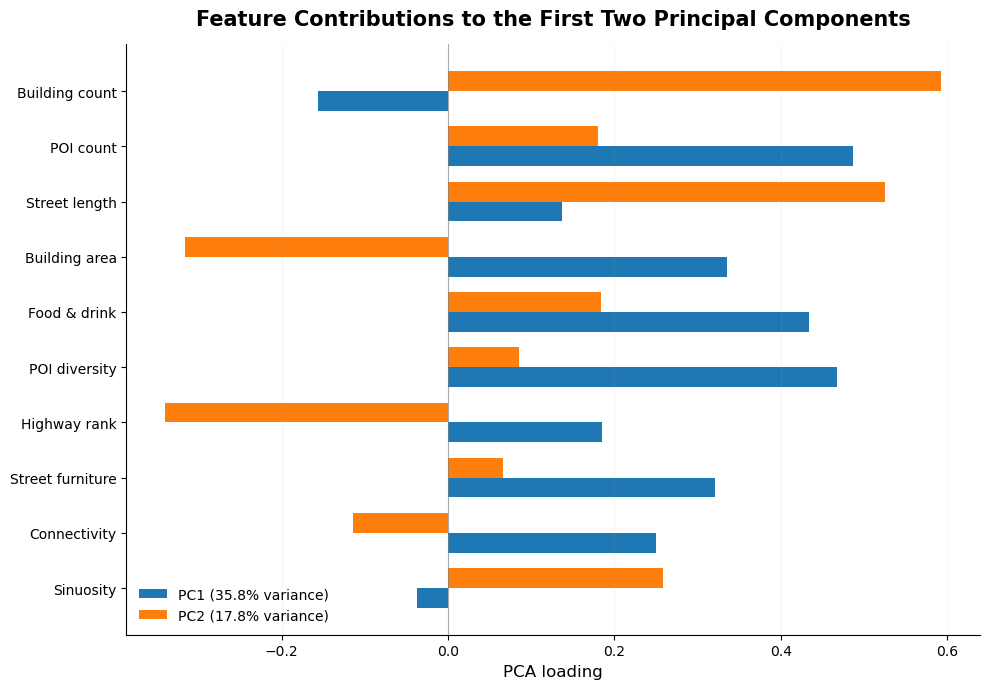

Saved: outputs/pca_feature_loadings_final.png


,PC1,PC2
Sinuosity,-0.037,0.259
Connectivity,0.251,-0.114
Street furniture,0.320,0.066
Highway rank,0.185,-0.340
POI diversity,0.467,0.085
Food & drink,0.434,0.183
Building area,0.336,-0.316
Street length,0.137,0.525
POI count,0.486,0.180
Building count,-0.157,0.593


In [216]:
# ============================================================
# PCA FEATURE LOADINGS
# ============================================================

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# PCA loadings for the ten clustering features
loadings = pd.DataFrame(
    pca.components_.T,
    index=X_scaled.columns,
    columns=['PC1', 'PC2']
)

# Cleaner labels for the dissertation figure
loading_labels = {
    'length_m': 'Street length',
    'building_count_50m': 'Building count',
    'avg_building_area': 'Building area',
    'highway_rank': 'Highway rank',
    'sinuosity': 'Sinuosity',
    'poi_count_50m': 'POI count',
    'poi_diversity': 'POI diversity',
    'food_drink_count': 'Food & drink',
    'street_furniture_count': 'Street furniture',
    'avg_connectivity': 'Connectivity'
}

loadings.index = [
    loading_labels.get(feature, feature)
    for feature in loadings.index
]

# Order by absolute combined contribution to PC1 and PC2
loadings['combined_strength'] = (
    loadings['PC1'].abs()
    + loadings['PC2'].abs()
)

loadings = loadings.sort_values(
    'combined_strength',
    ascending=True
)

# Plot
fig, ax = plt.subplots(figsize=(10, 7))

y = np.arange(len(loadings))
bar_height = 0.36

ax.barh(
    y - bar_height / 2,
    loadings['PC1'],
    height=bar_height,
    label=f'PC1 ({pc1_var:.1f}% variance)'
)

ax.barh(
    y + bar_height / 2,
    loadings['PC2'],
    height=bar_height,
    label=f'PC2 ({pc2_var:.1f}% variance)'
)

ax.axvline(
    0,
    linewidth=0.8,
    color='#777777',
    alpha=0.6
)

ax.set_yticks(y)
ax.set_yticklabels(loadings.index)

ax.set_xlabel(
    'PCA loading',
    fontsize=12
)

ax.set_title(
    'Feature Contributions to the First Two Principal Components',
    fontsize=15,
    fontweight='bold',
    pad=14
)

ax.grid(
    axis='x',
    alpha=0.15,
    linewidth=0.6
)

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

ax.legend(
    frameon=False
)

plt.tight_layout()

plt.savefig(
    '/home/jovyan/work/outputs/'
    'pca_feature_loadings_final.png',
    dpi=300,
    bbox_inches='tight',
    facecolor='white'
)

plt.show()

print(
    'Saved: outputs/'
    'pca_feature_loadings_final.png'
)

display(
    loadings[['PC1', 'PC2']].round(3)
)

In [223]:
# ============================================================
# K=9 CLUSTER STABILITY ANALYSIS
# Repeated 80% subsampling evaluated using Adjusted Rand Index
# ============================================================

import numpy as np
import pandas as pd

from sklearn.cluster import KMeans
from sklearn.metrics import adjusted_rand_score

# Number of repeated stability tests
n_repeats = 100

# Proportion of observations retained in each repeat
sample_fraction = 0.80

# Reproducible random generator
rng = np.random.default_rng(42)

stability_results = []

n_samples = len(X_scaled)
sample_size = int(n_samples * sample_fraction)

for repeat in range(n_repeats):

    # Randomly sample 80% of observations without replacement
    sample_idx = rng.choice(
        n_samples,
        size=sample_size,
        replace=False
    )

    X_subsample = X_scaled.iloc[sample_idx]

    # Reference labels from the final K=9 solution
    reference_labels = k9_labels[sample_idx]

    # Refit K-means to the subsample
    model = KMeans(
        n_clusters=9,
        random_state=repeat,
        n_init=10
    )

    new_labels = model.fit_predict(X_subsample)

    # Compare new assignments with final K=9 assignments
    ari = adjusted_rand_score(
        reference_labels,
        new_labels
    )

    stability_results.append({
        'repeat': repeat + 1,
        'ARI': ari
    })

stability_df = pd.DataFrame(stability_results)

print("K=9 stability analysis complete.")
print()
print(
    f"Mean ARI:   "
    f"{stability_df['ARI'].mean():.3f}"
)
print(
    f"Median ARI: "
    f"{stability_df['ARI'].median():.3f}"
)
print(
    f"Minimum ARI:"
    f" {stability_df['ARI'].min():.3f}"
)
print(
    f"Maximum ARI:"
    f" {stability_df['ARI'].max():.3f}"
)
print(
    f"SD:         "
    f"{stability_df['ARI'].std():.3f}"
)

K=9 stability analysis complete.

Mean ARI:   0.827
Median ARI: 0.851
Minimum ARI: 0.633
Maximum ARI: 0.986
SD:         0.112


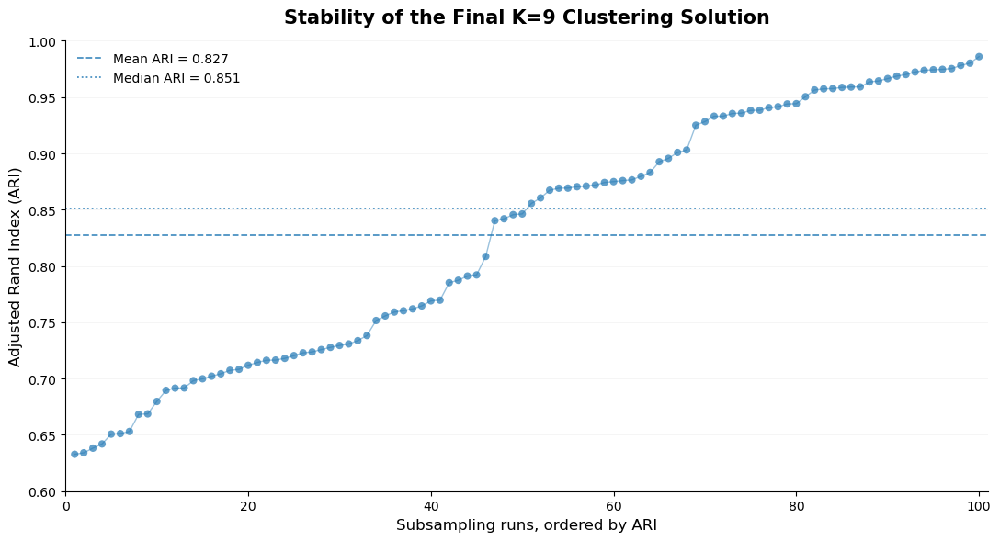

Saved: outputs/k9_stability_final.png

Mean ARI:   0.827
Median ARI: 0.851
Minimum:    0.633
Maximum:    0.986
SD:         0.112


In [228]:
# ============================================================
# FINAL DISSERTATION FIGURE:
# STABILITY OF THE K=9 CLUSTERING SOLUTION
# ============================================================

import numpy as np
import matplotlib.pyplot as plt

# ARI values from the 100 subsampling runs
ari_scores = stability_df['ARI'].values

# Sort from lowest to highest for visual clarity
ari_sorted = np.sort(ari_scores)

runs = np.arange(1, len(ari_sorted) + 1)

# Summary statistics
mean_ari = np.mean(ari_scores)
median_ari = np.median(ari_scores)

# ------------------------------------------------------------
# Create figure
# ------------------------------------------------------------

fig, ax = plt.subplots(figsize=(11, 6))

# Plot all 100 stability results
ax.scatter(
    runs,
    ari_sorted,
    s=34,
    alpha=0.70,
    edgecolors='none',
    zorder=3
)

# Subtle connecting line to show the distribution
ax.plot(
    runs,
    ari_sorted,
    linewidth=1.0,
    alpha=0.45,
    zorder=2
)

# ------------------------------------------------------------
# Mean and median reference lines
# ------------------------------------------------------------

ax.axhline(
    mean_ari,
    linestyle='--',
    linewidth=1.3,
    alpha=0.8,
    label=f'Mean ARI = {mean_ari:.3f}'
)

ax.axhline(
    median_ari,
    linestyle=':',
    linewidth=1.3,
    alpha=0.8,
    label=f'Median ARI = {median_ari:.3f}'
)

# ------------------------------------------------------------
# Formatting
# ------------------------------------------------------------

ax.set_xlabel(
    'Subsampling runs, ordered by ARI',
    fontsize=12
)

ax.set_ylabel(
    'Adjusted Rand Index (ARI)',
    fontsize=12
)

ax.set_title(
    'Stability of the Final K=9 Clustering Solution',
    fontsize=15,
    fontweight='bold',
    pad=14
)

ax.set_ylim(
    0.60,
    1.00
)

ax.set_xlim(
    0,
    len(ari_sorted) + 1
)

ax.grid(
    axis='y',
    alpha=0.15,
    linewidth=0.6
)

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

ax.legend(
    frameon=False,
    loc='upper left',
    fontsize=10
)

plt.tight_layout()

# ------------------------------------------------------------
# Save
# ------------------------------------------------------------

plt.savefig(
    '/home/jovyan/work/outputs/'
    'k9_stability_final.png',
    dpi=300,
    bbox_inches='tight',
    facecolor='white'
)

plt.show()

# ------------------------------------------------------------
# Report statistics
# ------------------------------------------------------------

print('Saved: outputs/k9_stability_final.png')

print(f'\nMean ARI:   {mean_ari:.3f}')
print(f'Median ARI: {median_ari:.3f}')
print(f'Minimum:    {ari_scores.min():.3f}')
print(f'Maximum:    {ari_scores.max():.3f}')
print(f'SD:         {ari_scores.std(ddof=1):.3f}')

In [232]:
# ============================================================
# ROBUSTNESS CURVE FOR THE FINAL K=9 CLUSTERING SOLUTION
# Repeated subsampling across multiple sample fractions
# ============================================================

import numpy as np
import pandas as pd

from sklearn.cluster import KMeans
from sklearn.metrics import adjusted_rand_score

# Fractions of the full dataset to retain
sample_fractions = [
    0.50,
    0.60,
    0.70,
    0.80,
    0.90
]

# Number of repeated subsamples at each fraction
n_repeats = 100

# Reproducible random generator
robustness_rng = np.random.default_rng(42)

# Store all results here
robustness_curve_results = []

n_samples = len(X_scaled)

for fraction in sample_fractions:

    sample_size = int(
        n_samples * fraction
    )

    for repeat in range(n_repeats):

        # Random subsample without replacement
        sample_idx = robustness_rng.choice(
            n_samples,
            size=sample_size,
            replace=False
        )

        # Temporary subsample only
        X_sub = X_scaled.iloc[
            sample_idx
        ]

        # Corresponding labels from the final K=9 solution
        reference_labels = k9_labels[
            sample_idx
        ]

        # Temporary K-means model
        temp_model = KMeans(
            n_clusters=9,
            random_state=repeat,
            n_init=10
        )

        temp_labels = (
            temp_model
            .fit_predict(X_sub)
        )

        # Agreement with final K=9 assignments
        ari_value = adjusted_rand_score(
            reference_labels,
            temp_labels
        )

        robustness_curve_results.append({
            'sample_fraction': fraction,
            'sample_percent': fraction * 100,
            'repeat': repeat + 1,
            'ARI': ari_value
        })

# Convert to dataframe
robustness_curve_df = pd.DataFrame(
    robustness_curve_results
)

# ============================================================
# SUMMARISE ROBUSTNESS RESULTS
# ============================================================

robustness_summary = (
    robustness_curve_df
    .groupby(
        ['sample_fraction', 'sample_percent']
    )['ARI']
    .agg(
        mean='mean',
        median='median',
        q25=lambda x: x.quantile(0.25),
        q75=lambda x: x.quantile(0.75),
        sd='std',
        minimum='min',
        maximum='max'
    )
    .reset_index()
)

display(
    robustness_summary.round(3)
)

,sample_fraction,sample_percent,mean,median,q25,q75,sd,minimum,maximum
0,0.5,50.0,0.762,0.745,0.690,0.838,0.096,0.578,0.941
1,0.6,60.0,0.785,0.782,0.698,0.880,0.106,0.610,0.961
2,0.7,70.0,0.811,0.808,0.718,0.919,0.106,0.608,0.974
3,0.8,80.0,0.827,0.831,0.735,0.944,0.106,0.594,0.976
4,0.9,90.0,0.851,0.857,0.765,0.953,0.100,0.644,0.987


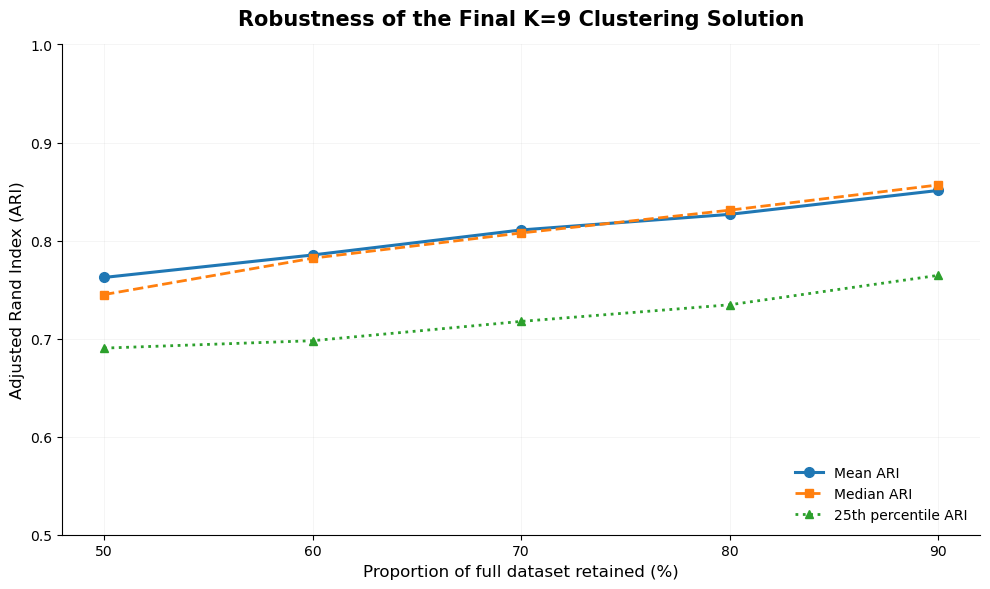

Saved: outputs/k9_robustness_multiline_final.png


In [234]:
# ============================================================
# FINAL MULTI-LINE ROBUSTNESS FIGURE
# ============================================================

import matplotlib.pyplot as plt

fig, ax = plt.subplots(
    figsize=(10, 6)
)

x = robustness_summary['sample_percent']

# ------------------------------------------------------------
# Mean ARI
# ------------------------------------------------------------

ax.plot(
    x,
    robustness_summary['mean'],
    marker='o',
    linewidth=2.2,
    markersize=7,
    linestyle='-',
    label='Mean ARI'
)

# ------------------------------------------------------------
# Median ARI
# ------------------------------------------------------------

ax.plot(
    x,
    robustness_summary['median'],
    marker='s',
    linewidth=2.0,
    markersize=6,
    linestyle='--',
    label='Median ARI'
)

# ------------------------------------------------------------
# 25th percentile
# Shows the lower end of typical clustering stability
# ------------------------------------------------------------

ax.plot(
    x,
    robustness_summary['q25'],
    marker='^',
    linewidth=2.0,
    markersize=6,
    linestyle=':',
    label='25th percentile ARI'
)

# ------------------------------------------------------------
# Labels
# ------------------------------------------------------------

ax.set_xlabel(
    'Proportion of full dataset retained (%)',
    fontsize=12
)

ax.set_ylabel(
    'Adjusted Rand Index (ARI)',
    fontsize=12
)

ax.set_title(
    'Robustness of the Final K=9 Clustering Solution',
    fontsize=15,
    fontweight='bold',
    pad=14
)

ax.set_xticks(
    [50, 60, 70, 80, 90]
)

ax.set_ylim(
    0.5,
    1.0
)

# ------------------------------------------------------------
# Formatting
# ------------------------------------------------------------

ax.grid(
    alpha=0.15,
    linewidth=0.6
)

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

ax.legend(
    frameon=False,
    loc='lower right'
)

plt.tight_layout()

# ------------------------------------------------------------
# Save
# ------------------------------------------------------------

plt.savefig(
    '/home/jovyan/work/outputs/'
    'k9_robustness_multiline_final.png',
    dpi=300,
    bbox_inches='tight',
    facecolor='white'
)

plt.show()

print(
    'Saved: outputs/'
    'k9_robustness_multiline_final.png'
)

### Spatial distribution of the final street typologies

The spatial distribution of the nine data-driven street typologies is mapped across the four study cities. A consistent colour scheme is used to represent each typology, allowing their spatial patterns and prevalence across different urban contexts to be compared.

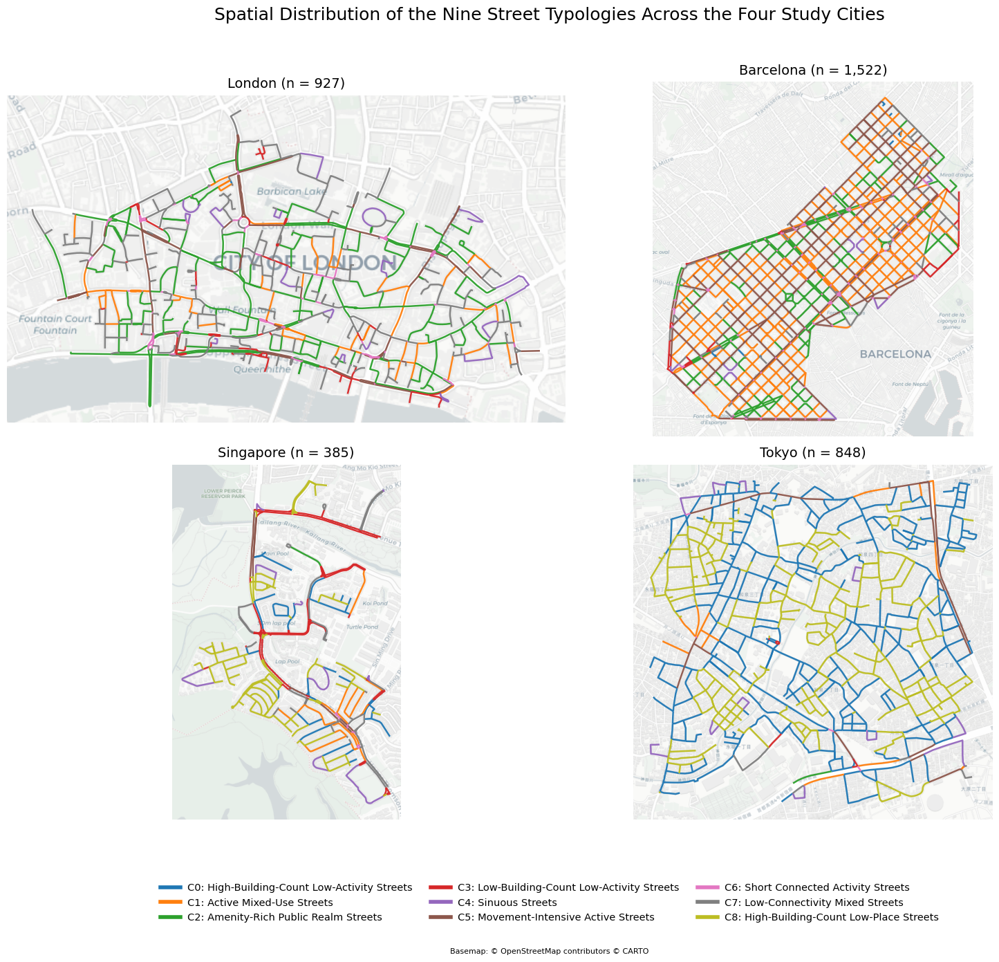

Saved: outputs/final_typology_map_four_cities.png


In [174]:
# Create the final dissertation map of the nine street typologies
# The same colour represents each typology across all four cities

from matplotlib.lines import Line2D

typology_colours = {
    0: '#1f77b4',  # High-Building-Count Low-Activity Streets
    1: '#ff7f0e',  # Active Mixed-Use Streets
    2: '#2ca02c',  # Amenity-Rich Public Realm Streets
    3: '#d62728',  # Low-Building-Count Low-Activity Streets
    4: '#9467bd',  # Sinuous Streets
    5: '#8c564b',  # Movement-Intensive Active Streets
    6: '#e377c2',  # Short Connected Activity Streets
    7: '#7f7f7f',  # Low-Connectivity Mixed Streets
    8: '#bcbd22'   # High-Building-Count Low-Place Streets
}

city_maps = {
    'London': london_k9,
    'Barcelona': barcelona_k9,
    'Singapore': singapore_k9,
    'Tokyo': tokyo_k9
}

fig, axes = plt.subplots(
    2, 2,
    figsize=(16, 14)
)

axes = axes.flatten()

for ax, (city_name, gdf) in zip(axes, city_maps.items()):

    # Convert to Web Mercator for the basemap
    plot_gdf = gdf.to_crs(epsg=3857)

    # Plot each typology using the same colour across cities
    for cluster in range(9):

        streets = plot_gdf[
            plot_gdf['cluster'] == cluster
        ]

        if len(streets) > 0:
            streets.plot(
                ax=ax,
                color=typology_colours[cluster],
                linewidth=1.8,
                alpha=0.95
            )

    # Add basemap for spatial context
    ctx.add_basemap(
        ax,
        source=ctx.providers.CartoDB.Positron,
        attribution=False
    )

    ax.set_title(
        f'{city_name} (n = {len(gdf):,})',
        fontsize=14,
        pad=8
    )

    ax.set_axis_off()


# Shared typology legend
legend_handles = [
    Line2D(
        [0],
        [0],
        color=typology_colours[cluster],
        linewidth=4,
        label=f'C{cluster}: {typology_names[cluster]}'
    )
    for cluster in range(9)
]

fig.legend(
    handles=legend_handles,
    loc='lower center',
    bbox_to_anchor=(0.5, 0.025),
    ncol=3,
    frameon=False,
    fontsize=10.5,
    columnspacing=1.8,
    handletextpad=0.7
)

fig.suptitle(
    'Spatial Distribution of the Nine Street Typologies Across the Four Study Cities',
    fontsize=18,
    y=0.98
)

# Basemap attribution
fig.text(
    0.5,
    0.002,
    'Basemap: © OpenStreetMap contributors © CARTO',
    ha='center',
    fontsize=8
)

plt.tight_layout(
    rect=[0, 0.13, 1, 0.96]
)

plt.savefig(
    '/home/jovyan/work/outputs/'
    'final_typology_map_four_cities.png',
    dpi=300,
    bbox_inches='tight',
    facecolor='white'
)

plt.show()

print(
    "Saved: outputs/"
    "final_typology_map_four_cities.png"
)

### Cross-city typology composition

The relative composition of the nine street typologies is compared across the
four study cities. Percentages are calculated within each city so that differences in typology prevalence can be compared despite the different numbers of street segments in each study area.

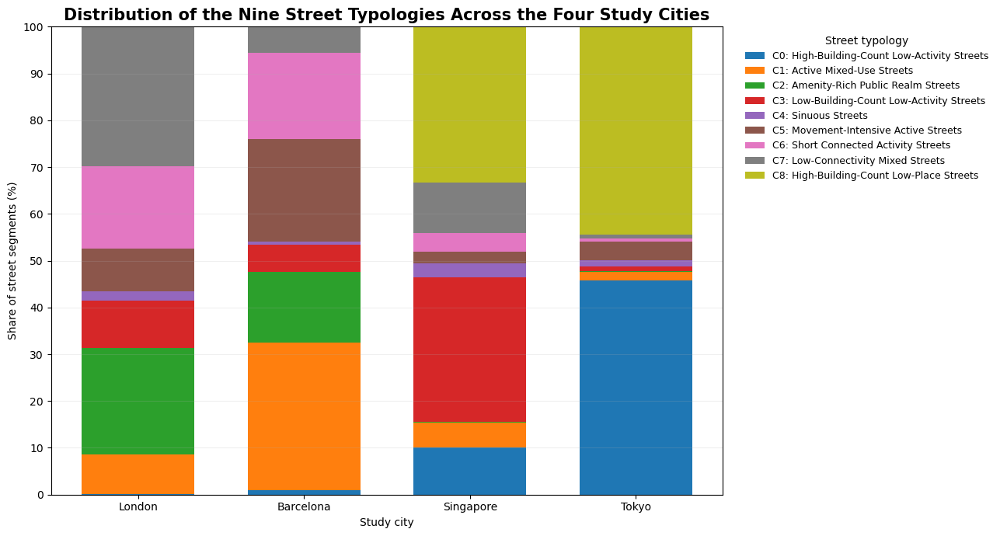

Saved: outputs/city_typology_composition_final.png

Percentage composition by city:


cluster,0,1,2,3,4,5,6,7,8
city,,,,,,,,,
London,0.1,8.5,22.7,10.1,2.0,9.2,17.5,29.9,0.0
Barcelona,1.0,31.5,15.1,5.8,0.6,22.0,18.5,5.5,0.0
Singapore,10.1,5.2,0.3,30.9,2.9,2.6,3.9,10.9,33.2
Tokyo,45.8,1.9,0.1,1.1,1.3,4.0,0.6,0.8,44.5


In [175]:
# Compare the percentage composition of street typologies across the four cities

# Calculate percentage of each city's streets assigned to each cluster
city_typology_percent = pd.crosstab(
    all_features['city'],
    all_features['cluster'],
    normalize='index'
) * 100

# Make sure all clusters C0 to C8 are present as columns
city_typology_percent = city_typology_percent.reindex(
    columns=range(9),
    fill_value=0
)

# Put cities in the order used throughout the dissertation
city_order = [
    'London',
    'Barcelona',
    'Singapore',
    'Tokyo'
]

city_typology_percent = city_typology_percent.loc[
    city_order
]

# Plot 100% stacked bars
fig, ax = plt.subplots(figsize=(13, 7))

bottom = np.zeros(len(city_typology_percent))

for cluster in range(9):

    values = city_typology_percent[cluster].values

    ax.bar(
        city_typology_percent.index,
        values,
        bottom=bottom,
        color=typology_colours[cluster],
        width=0.68,
        label=f'C{cluster}: {typology_names[cluster]}'
    )

    bottom += values


# Format chart
ax.set_ylabel('Share of street segments (%)')
ax.set_xlabel('Study city')

ax.set_title(
    'Distribution of the Nine Street Typologies Across the Four Study Cities',
    fontsize=15,
    fontweight='bold'
)

ax.set_ylim(0, 100)

ax.set_yticks(
    np.arange(0, 101, 10)
)

ax.grid(
    axis='y',
    alpha=0.2
)

# Legend outside the plot
ax.legend(
    title='Street typology',
    bbox_to_anchor=(1.02, 1),
    loc='upper left',
    frameon=False,
    fontsize=9
)

plt.tight_layout()

plt.savefig(
    '/home/jovyan/work/outputs/'
    'city_typology_composition_final.png',
    dpi=300,
    bbox_inches='tight',
    facecolor='white'
)

plt.show()

print(
    "Saved: outputs/"
    "city_typology_composition_final.png"
)

print("\nPercentage composition by city:")
display(
    city_typology_percent.round(1)
)

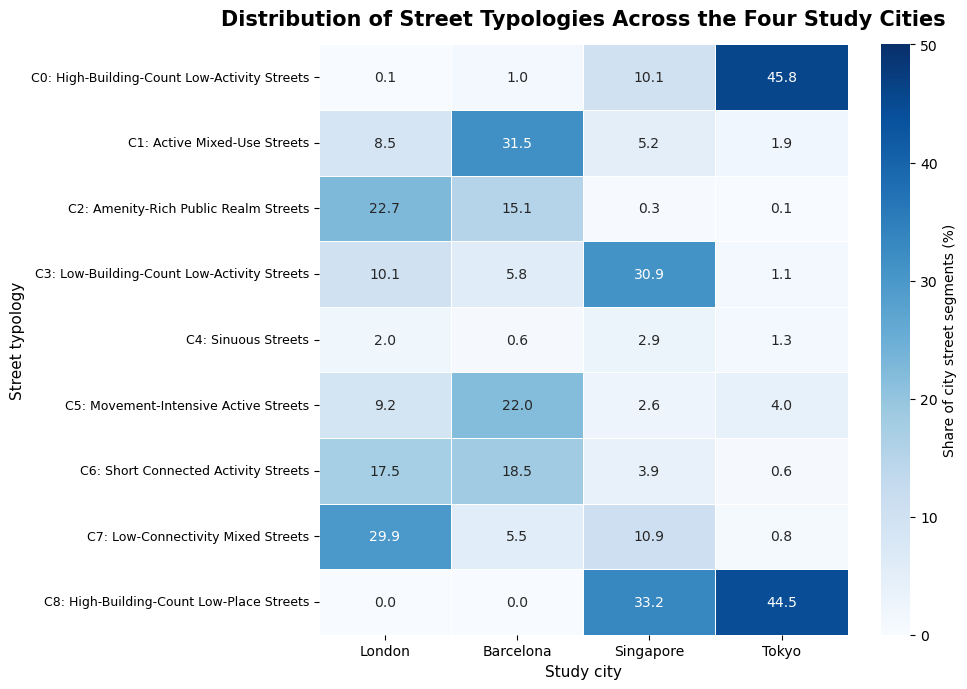

Saved: outputs/city_typology_composition_heatmap_final.png

Percentage composition by city:


cluster,0,1,2,3,4,5,6,7,8
city,,,,,,,,,
London,0.1,8.5,22.7,10.1,2.0,9.2,17.5,29.9,0.0
Barcelona,1.0,31.5,15.1,5.8,0.6,22.0,18.5,5.5,0.0
Singapore,10.1,5.2,0.3,30.9,2.9,2.6,3.9,10.9,33.2
Tokyo,45.8,1.9,0.1,1.1,1.3,4.0,0.6,0.8,44.5


In [229]:
# ============================================================
# CITY × STREET TYPOLOGY COMPOSITION HEATMAP
# ============================================================

import matplotlib.pyplot as plt
import seaborn as sns

# Use the city composition percentages already calculated
city_typology_heatmap = city_typology_percent.T.copy()

# Add full typology names to the rows
city_typology_heatmap.index = [
    f'C{cluster}: {typology_names[cluster]}'
    for cluster in city_typology_heatmap.index
]

# ------------------------------------------------------------
# Plot
# ------------------------------------------------------------

fig, ax = plt.subplots(figsize=(10, 7))

sns.heatmap(
    city_typology_heatmap,
    annot=True,
    fmt='.1f',
    cmap='Blues',
    vmin=0,
    vmax=50,
    linewidths=0.6,
    linecolor='white',
    cbar_kws={
        'label': 'Share of city street segments (%)'
    },
    ax=ax
)

# ------------------------------------------------------------
# Labels and title
# ------------------------------------------------------------

ax.set_title(
    'Distribution of Street Typologies Across the Four Study Cities',
    fontsize=15,
    fontweight='bold',
    pad=14
)

ax.set_xlabel(
    'Study city',
    fontsize=11
)

ax.set_ylabel(
    'Street typology',
    fontsize=11
)

ax.tick_params(
    axis='x',
    labelrotation=0,
    labelsize=10
)

ax.tick_params(
    axis='y',
    labelrotation=0,
    labelsize=9
)

plt.tight_layout()

# ------------------------------------------------------------
# Save
# ------------------------------------------------------------

plt.savefig(
    '/home/jovyan/work/outputs/'
    'city_typology_composition_heatmap_final.png',
    dpi=300,
    bbox_inches='tight',
    facecolor='white'
)

plt.show()

print(
    'Saved: outputs/'
    'city_typology_composition_heatmap_final.png'
)

# Check values used in the figure
print('\nPercentage composition by city:')
display(
    city_typology_percent.round(1)
)

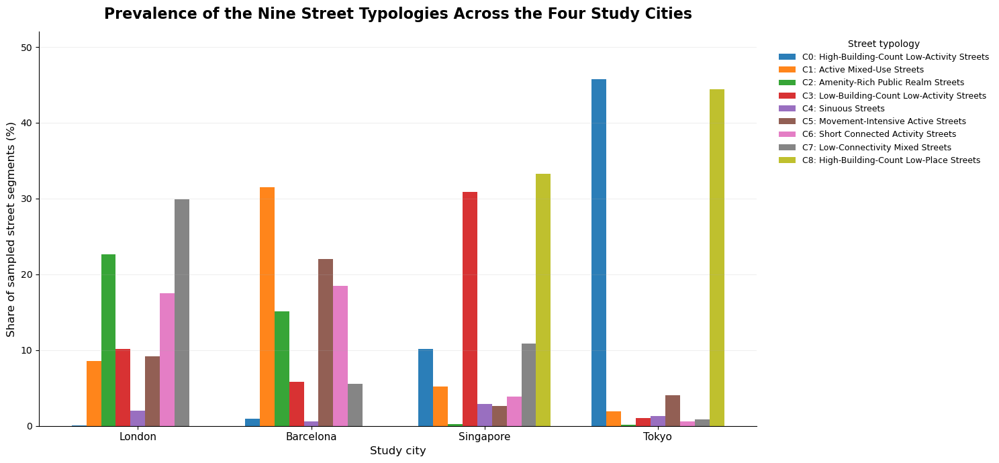

Saved: outputs/typology_prevalence_by_city_final.png


In [177]:
# Create grouped bar chart showing typology prevalence within each city
# The same typology colours are used throughout the dissertation

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Calculate within-city typology percentages
city_cluster_counts = pd.DataFrame({
    'London': [
        1, 79, 210, 94, 19, 85, 162, 277, 0
    ],
    'Barcelona': [
        15, 480, 230, 88, 9, 335, 281, 84, 0
    ],
    'Singapore': [
        39, 20, 1, 119, 11, 10, 15, 42, 128
    ],
    'Tokyo': [
        388, 16, 1, 9, 11, 34, 5, 7, 377
    ]
}, index=range(9))

city_percentages = (
    city_cluster_counts
    / city_cluster_counts.sum(axis=0)
    * 100
)

typology_names = {
    0: 'High-Building-Count Low-Activity Streets',
    1: 'Active Mixed-Use Streets',
    2: 'Amenity-Rich Public Realm Streets',
    3: 'Low-Building-Count Low-Activity Streets',
    4: 'Sinuous Streets',
    5: 'Movement-Intensive Active Streets',
    6: 'Short Connected Activity Streets',
    7: 'Low-Connectivity Mixed Streets',
    8: 'High-Building-Count Low-Place Streets'
}

typology_colours = {
    0: '#1f77b4',
    1: '#ff7f0e',
    2: '#2ca02c',
    3: '#d62728',
    4: '#9467bd',
    5: '#8c564b',
    6: '#e377c2',
    7: '#7f7f7f',
    8: '#bcbd22'
}

fig, ax = plt.subplots(figsize=(15, 7))

cities = [
    'London',
    'Barcelona',
    'Singapore',
    'Tokyo'
]

x = np.arange(len(cities))
bar_width = 0.085

offsets = (
    np.arange(9) - 4
) * bar_width

for cluster in range(9):

    values = [
        city_percentages.loc[
            cluster,
            city
        ]
        for city in cities
    ]

    ax.bar(
        x + offsets[cluster],
        values,
        width=bar_width,
        color=typology_colours[cluster],
        label=f'C{cluster}: {typology_names[cluster]}',
        alpha=0.95
    )

ax.set_xticks(x)

ax.set_xticklabels(
    cities,
    fontsize=11
)

ax.set_xlabel(
    'Study city',
    fontsize=12
)

ax.set_ylabel(
    'Share of sampled street segments (%)',
    fontsize=12
)

ax.set_ylim(
    0,
    52
)

ax.set_title(
    'Prevalence of the Nine Street Typologies Across the Four Study Cities',
    fontsize=16,
    fontweight='bold',
    pad=14
)

ax.grid(
    axis='y',
    alpha=0.2
)

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

ax.legend(
    title='Street typology',
    bbox_to_anchor=(1.02, 1),
    loc='upper left',
    frameon=False,
    fontsize=9,
    title_fontsize=10
)

plt.tight_layout()

plt.savefig(
    '/home/jovyan/work/outputs/'
    'typology_prevalence_by_city_final.png',
    dpi=300,
    bbox_inches='tight',
    facecolor='white'
)

plt.show()

print(
    "Saved: outputs/"
    "typology_prevalence_by_city_final.png"
)

### Movement and Place position of the street typologies

The final street typologies are positioned within the Movement and Place
framework using composite scores calculated from the standardised features.
These scores are used as an interpretive layer after clustering and were not
used as inputs to the K-means model.

In [178]:
# Calculate the overall mean Movement and Place position
# of each typology using all 3,682 individual street segments

overall_mp_means = (
    city_cluster_scores
    .groupby('cluster')
    .agg(
        movement_score=('movement_score', 'mean'),
        place_score=('place_score', 'mean'),
        n=('cluster', 'size')
    )
    .reset_index()
)

overall_mp_means['typology'] = (
    overall_mp_means['cluster']
    .map(typology_names)
)

print("Overall Movement and Place position of each typology:")

display(
    overall_mp_means.round(3)
)

Overall Movement and Place position of each typology:


,cluster,movement_score,place_score,n,typology
0,0,-0.139,-0.578,443,High-Building-Count Low-Activity Streets
1,1,0.223,0.515,595,Active Mixed-Use Streets
2,2,0.150,0.899,442,Amenity-Rich Public Realm Streets
3,3,-0.222,-0.742,310,Low-Building-Count Low-Activity Streets
4,4,-1.337,-0.024,50,Sinuous Streets
5,5,0.513,0.501,464,Movement-Intensive Active Streets
6,6,-0.140,0.382,463,Short Connected Activity Streets
7,7,-0.131,-0.036,410,Low-Connectivity Mixed Streets
8,8,-0.240,-1.210,505,High-Building-Count Low-Place Streets


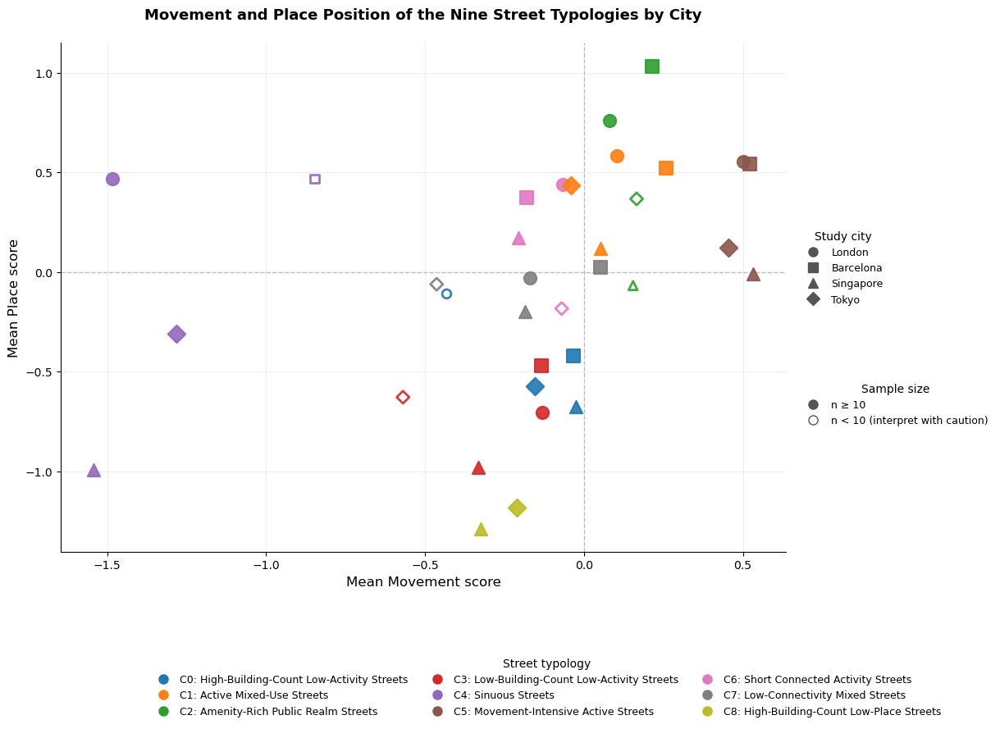

Saved.


In [182]:
# Movement and Place position of the nine typologies by city
# Typology legend below the plot
# Hollow markers indicate n < 10

from matplotlib.lines import Line2D
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(14, 9))

# ------------------------------------------------------------
# City markers
# ------------------------------------------------------------

city_markers = {
    'London': 'o',
    'Barcelona': 's',
    'Singapore': '^',
    'Tokyo': 'D'
}

# ------------------------------------------------------------
# Typology colours
# ------------------------------------------------------------

typology_colours = {
    0: '#1f77b4',
    1: '#ff7f0e',
    2: '#2ca02c',
    3: '#d62728',
    4: '#9467bd',
    5: '#8c564b',
    6: '#e377c2',
    7: '#7f7f7f',
    8: '#bcbd22'
}

# ------------------------------------------------------------
# Plot city-typology means
# Filled markers = n >= 10
# Hollow markers = n < 10
# ------------------------------------------------------------

for _, row in city_cluster_means.iterrows():

    city = row['city']
    cluster = int(row['cluster'])
    n = row['n']

    marker = city_markers[city]
    colour = typology_colours[cluster]

    size = 120 if n >= 10 else 60
    edgewidth = 1.5 if n >= 10 else 2.0
    facecolour = colour if n >= 10 else 'none'

    ax.scatter(
        row['movement_score'],
        row['place_score'],
        s=size,
        marker=marker,
        facecolors=facecolour,
        edgecolors=colour,
        linewidths=edgewidth,
        zorder=3,
        alpha=0.9
    )

# ------------------------------------------------------------
# Zero reference lines
# ------------------------------------------------------------

ax.axvline(
    0,
    linestyle='--',
    linewidth=1,
    color='#AAAAAA',
    alpha=0.7
)

ax.axhline(
    0,
    linestyle='--',
    linewidth=1,
    color='#AAAAAA',
    alpha=0.7
)

# ------------------------------------------------------------
# Labels and title
# ------------------------------------------------------------

ax.set_xlabel(
    'Mean Movement score',
    fontsize=12
)

ax.set_ylabel(
    'Mean Place score',
    fontsize=12
)

ax.set_title(
    'Movement and Place Position of the Nine Street Typologies by City\n',
    fontsize=13,
    fontweight='bold'
)

ax.grid(alpha=0.2)

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

# ------------------------------------------------------------
# Typology names
# ------------------------------------------------------------

typology_names = {
    0: 'High-Building-Count Low-Activity Streets',
    1: 'Active Mixed-Use Streets',
    2: 'Amenity-Rich Public Realm Streets',
    3: 'Low-Building-Count Low-Activity Streets',
    4: 'Sinuous Streets',
    5: 'Movement-Intensive Active Streets',
    6: 'Short Connected Activity Streets',
    7: 'Low-Connectivity Mixed Streets',
    8: 'High-Building-Count Low-Place Streets'
}

# ------------------------------------------------------------
# Typology legend underneath plot
# ------------------------------------------------------------

typology_handles = [
    Line2D(
        [0],
        [0],
        marker='o',
        linestyle='None',
        markerfacecolor=typology_colours[c],
        markeredgecolor=typology_colours[c],
        markersize=8,
        label=typology_names_short[c]
    )
    for c in range(9)
]

fig.legend(
    handles=typology_handles,
    title='Street typology',
    loc='lower center',
    bbox_to_anchor=(0.48, 0.01),
    ncol=3,
    frameon=False,
    fontsize=9,
    title_fontsize=10,
    columnspacing=1.8,
    handletextpad=0.6
)

# ------------------------------------------------------------
# City legend on right
# ------------------------------------------------------------

city_handles = [
    Line2D(
        [0],
        [0],
        marker=marker,
        linestyle='None',
        markerfacecolor='#555555',
        markeredgecolor='#555555',
        markersize=8,
        label=city
    )
    for city, marker in city_markers.items()
]

leg_city = ax.legend(
    handles=city_handles,
    title='Study city',
    loc='upper left',
    bbox_to_anchor=(1.01, 0.65),
    fontsize=9,
    title_fontsize=10,
    frameon=False
)

ax.add_artist(leg_city)

# ------------------------------------------------------------
# Sample-size legend on right
# ------------------------------------------------------------

sample_size_handles = [
    Line2D(
        [0],
        [0],
        marker='o',
        linestyle='None',
        markerfacecolor='#555555',
        markeredgecolor='#555555',
        markersize=8,
        label='n ≥ 10'
    ),
    Line2D(
        [0],
        [0],
        marker='o',
        linestyle='None',
        markerfacecolor='none',
        markeredgecolor='#555555',
        markersize=8,
        label='n < 10 (interpret with caution)'
    )
]

ax.legend(
    handles=sample_size_handles,
    title='Sample size',
    loc='upper left',
    bbox_to_anchor=(1.01, 0.35),
    fontsize=9,
    title_fontsize=10,
    frameon=False
)

# ------------------------------------------------------------
# Layout
# Leave bottom space for typology legend
# ------------------------------------------------------------

plt.tight_layout(
    rect=[0, 0.18, 0.88, 1]
)

# ------------------------------------------------------------
# Save
# ------------------------------------------------------------

plt.savefig(
    '/home/jovyan/work/outputs/'
    'movement_place_by_city_final.png',
    dpi=300,
    bbox_inches='tight',
    facecolor='white'
)

plt.show()

print("Saved.")

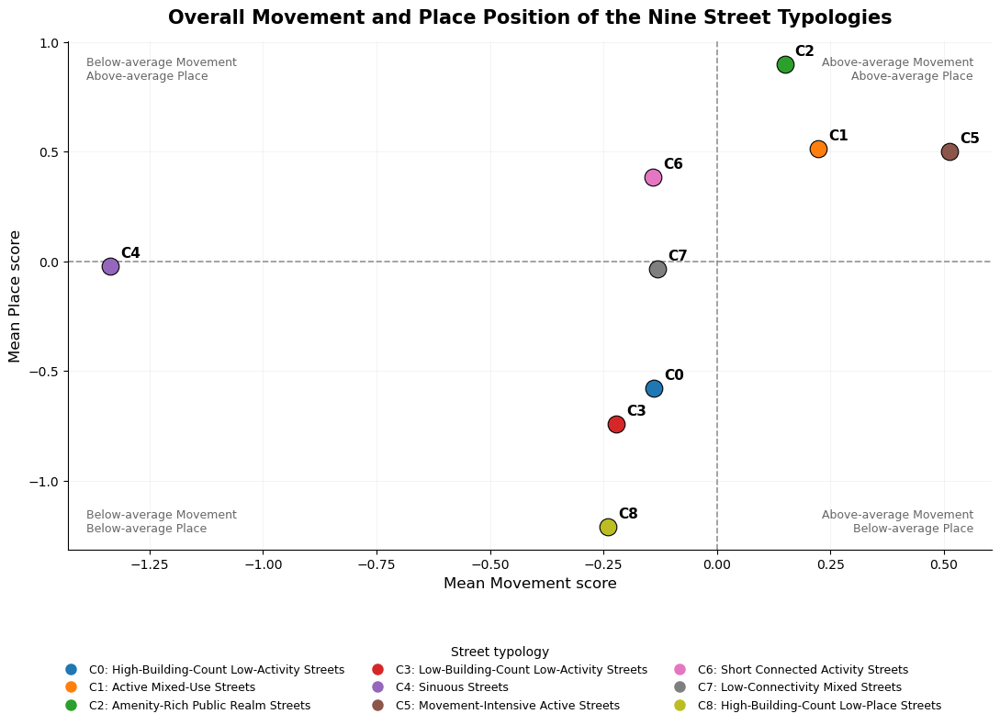

Saved: outputs/movement_place_typologies_overall_final.png


In [188]:
# Overall Movement and Place position of the nine street typologies
# One point represents the overall mean position of one typology
# across all 3,682 street segments

from matplotlib.lines import Line2D
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(11, 8))

# Typology colours used consistently throughout the dissertation
typology_colours = {
    0: '#1f77b4',
    1: '#ff7f0e',
    2: '#2ca02c',
    3: '#d62728',
    4: '#9467bd',
    5: '#8c564b',
    6: '#e377c2',
    7: '#7f7f7f',
    8: '#bcbd22'
}

typology_names_short = {
    0: 'C0: High-Building-Count Low-Activity Streets',
    1: 'C1: Active Mixed-Use Streets',
    2: 'C2: Amenity-Rich Public Realm Streets',
    3: 'C3: Low-Building-Count Low-Activity Streets',
    4: 'C4: Sinuous Streets',
    5: 'C5: Movement-Intensive Active Streets',
    6: 'C6: Short Connected Activity Streets',
    7: 'C7: Low-Connectivity Mixed Streets',
    8: 'C8: High-Building-Count Low-Place Streets'
}

# Plot one point per typology
for _, row in overall_mp_means.iterrows():

    cluster = int(row['cluster'])

    ax.scatter(
        row['movement_score'],
        row['place_score'],
        s=180,
        color=typology_colours[cluster],
        edgecolor='black',
        linewidth=0.8,
        zorder=3
    )

    # Add cluster label beside each point
    ax.annotate(
        f'C{cluster}',
        (
            row['movement_score'],
            row['place_score']
        ),
        xytext=(8, 7),
        textcoords='offset points',
        fontsize=11,
        fontweight='bold'
    )

# Zero reference lines
ax.axvline(
    0,
    linestyle='--',
    linewidth=1.2,
    color='#777777',
    alpha=0.8,
    zorder=1
)

ax.axhline(
    0,
    linestyle='--',
    linewidth=1.2,
    color='#777777',
    alpha=0.8,
    zorder=1
)

# Relative quadrant labels
ax.text(
    0.02,
    0.97,
    'Below-average Movement\nAbove-average Place',
    transform=ax.transAxes,
    ha='left',
    va='top',
    fontsize=9,
    color='#666666'
)

ax.text(
    0.98,
    0.97,
    'Above-average Movement\nAbove-average Place',
    transform=ax.transAxes,
    ha='right',
    va='top',
    fontsize=9,
    color='#666666'
)

ax.text(
    0.02,
    0.03,
    'Below-average Movement\nBelow-average Place',
    transform=ax.transAxes,
    ha='left',
    va='bottom',
    fontsize=9,
    color='#666666'
)

ax.text(
    0.98,
    0.03,
    'Above-average Movement\nBelow-average Place',
    transform=ax.transAxes,
    ha='right',
    va='bottom',
    fontsize=9,
    color='#666666'
)

# Axis labels and title
ax.set_xlabel(
    'Mean Movement score',
    fontsize=12
)

ax.set_ylabel(
    'Mean Place score',
    fontsize=12
)

ax.set_title(
    'Overall Movement and Place Position of the Nine Street Typologies',
    fontsize=15,
    fontweight='bold',
    pad=14
)

# Light grid
ax.grid(
    alpha=0.15,
    linewidth=0.7
)

# Remove unnecessary borders
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

# Typology legend underneath the figure
typology_handles = [
    Line2D(
        [0],
        [0],
        marker='o',
        linestyle='None',
        markerfacecolor=typology_colours[c],
        markeredgecolor=typology_colours[c],
        markersize=8,
        label=typology_names_short[c]
    )
    for c in range(9)
]

fig.legend(
    handles=typology_handles,
    title='Street typology',
    loc='lower center',
    bbox_to_anchor=(0.5, 0.01),
    ncol=3,
    frameon=False,
    fontsize=9,
    title_fontsize=10,
    columnspacing=1.8,
    handletextpad=0.6
)

# Leave space for the bottom legend
plt.tight_layout(
    rect=[0, 0.17, 1, 1]
)

# Save figure
plt.savefig(
    '/home/jovyan/work/outputs/'
    'movement_place_typologies_overall_final.png',
    dpi=300,
    bbox_inches='tight',
    facecolor='white'
)

plt.show()

print(
    'Saved: outputs/'
    'movement_place_typologies_overall_final.png'
)

In [189]:
# Inspect the existing typology summary tables before creating
# the final dissertation table

print("typology_summary:")
display(typology_summary)

print("\ncluster_summary:")
display(cluster_summary)

print("\ntypology_profile columns:")
print(typology_profile.columns.tolist())

display(typology_profile)

typology_summary:


,length_m,building_count_50m,avg_building_area,highway_rank,sinuosity,poi_count_50m,poi_diversity,food_drink_count,street_furniture_count,avg_connectivity,movement_score,place_score,n,percent
cluster,,,,,,,,,,,,,,
0,0.03,1.01,-1.17,-0.59,-0.01,-0.57,-0.30,-0.92,-0.57,-0.53,-0.14,-0.58,443,12.03
1,0.75,0.31,0.21,-0.31,-0.15,0.79,0.61,0.88,-0.24,0.53,0.22,0.51,595,16.16
2,0.55,-0.11,0.47,-0.15,0.00,0.98,0.74,0.64,1.95,0.18,0.15,0.90,442,12.00
3,-0.71,-1.63,0.93,0.22,-0.08,-1.00,-0.93,-1.01,-0.59,-0.17,-0.22,-0.74,310,8.42
4,1.04,0.20,-0.02,-1.06,6.85,0.00,-0.03,-0.04,0.30,-0.34,-1.34,-0.02,50,1.36
5,0.59,0.13,0.15,1.46,-0.23,0.69,0.64,0.78,0.02,0.38,0.51,0.50,464,12.60
6,-1.28,-0.85,0.49,0.72,-0.21,0.24,0.52,0.14,0.13,0.88,-0.14,0.38,463,12.57
7,-0.15,-0.52,0.72,-0.69,0.01,0.16,0.32,0.23,0.01,-0.90,-0.13,-0.04,410,11.14
8,-0.30,0.90,-1.37,-0.47,-0.05,-1.65,-1.86,-1.19,-0.74,-0.61,-0.24,-1.21,505,13.72



cluster_summary:


,movement_score,place_score,n
cluster,,,
0,-0.139,-0.578,443
1,0.223,0.515,595
2,0.150,0.899,442
3,-0.222,-0.742,310
4,-1.337,-0.024,50
5,0.513,0.501,464
6,-0.140,0.382,463
7,-0.131,-0.036,410
8,-0.240,-1.210,505



typology_profile columns:
['Street length', 'Building count', 'Building area', 'Highway rank', 'Sinuosity', 'POI count', 'POI diversity', 'Food & drink', 'Street furniture', 'Connectivity']


,Street length,Building count,Building area,Highway rank,Sinuosity,POI count,POI diversity,Food & drink,Street furniture,Connectivity
C0: High-Building-Count Low-Activity Streets,0.03,1.01,-1.17,-0.59,-0.01,-0.57,-0.30,-0.92,-0.57,-0.53
C1: Active Mixed-Use Streets,0.75,0.31,0.21,-0.31,-0.15,0.79,0.61,0.88,-0.24,0.53
C2: Amenity-Rich Public Realm Streets,0.55,-0.11,0.47,-0.15,0.00,0.98,0.74,0.64,1.95,0.18
C3: Low-Building-Count Low-Activity Streets,-0.71,-1.63,0.93,0.22,-0.08,-1.00,-0.93,-1.01,-0.59,-0.17
C4: Sinuous Streets,1.04,0.20,-0.02,-1.06,6.85,0.00,-0.03,-0.04,0.30,-0.34
C5: Movement-Intensive Active Streets,0.59,0.13,0.15,1.46,-0.23,0.69,0.64,0.78,0.02,0.38
C6: Short Connected Activity Streets,-1.28,-0.85,0.49,0.72,-0.21,0.24,0.52,0.14,0.13,0.88
C7: Low-Connectivity Mixed Streets,-0.15,-0.52,0.72,-0.69,0.01,0.16,0.32,0.23,0.01,-0.90
C8: High-Building-Count Low-Place Streets,-0.30,0.90,-1.37,-0.47,-0.05,-1.65,-1.86,-1.19,-0.74,-0.61


In [190]:
# Create dissertation-ready summary table of the nine street typologies
# Values are taken directly from typology_summary

import pandas as pd

# Full typology names
typology_names = {
    0: 'High-Building-Count Low-Activity Streets',
    1: 'Active Mixed-Use Streets',
    2: 'Amenity-Rich Public Realm Streets',
    3: 'Low-Building-Count Low-Activity Streets',
    4: 'Sinuous Streets',
    5: 'Movement-Intensive Active Streets',
    6: 'Short Connected Activity Streets',
    7: 'Low-Connectivity Mixed Streets',
    8: 'High-Building-Count Low-Place Streets'
}

# Concise interpretations based on the standardised feature profiles
key_characteristics = {
    0: 'High building count; small building area; low activity and connectivity',
    1: 'High POI and food & drink activity; above-average diversity and connectivity',
    2: 'Very high street furniture; high POI activity and diversity',
    3: 'Very low building count and activity; larger average building area',
    4: 'Exceptionally high sinuosity; long streets; low highway rank',
    5: 'High highway rank; high activity and POI diversity',
    6: 'Very short streets; high connectivity and highway rank',
    7: 'Very low connectivity; larger building area; modestly above-average POI activity and diversity',
    8: 'High building count and small building area; very low POI activity and diversity'
}

# Build table directly from calculated results
typology_table = pd.DataFrame({
    'Cluster': [f'C{c}' for c in typology_summary.index],
    'Street typology': [
        typology_names[c] for c in typology_summary.index
    ],
    'n': typology_summary['n'].astype(int).values,
    '% of sample': typology_summary['percent'].round(1).values,
    'Key distinguishing characteristics': [
        key_characteristics[c] for c in typology_summary.index
    ]
})

display(typology_table)

# Check that the table accounts for the complete sample
print(
    f"\nTotal streets: {typology_table['n'].sum():,}"
)

print(
    f"Total percentage: {typology_table['% of sample'].sum():.1f}%"
)

,Cluster,Street typology,n,% of sample,Key distinguishing characteristics
0,C0,High-Building-Count Low-Activity Streets,443,12.0,High building count; small building area; low ...
1,C1,Active Mixed-Use Streets,595,16.2,High POI and food & drink activity; above-aver...
2,C2,Amenity-Rich Public Realm Streets,442,12.0,Very high street furniture; high POI activity ...
3,C3,Low-Building-Count Low-Activity Streets,310,8.4,Very low building count and activity; larger a...
4,C4,Sinuous Streets,50,1.4,Exceptionally high sinuosity; long streets; lo...
5,C5,Movement-Intensive Active Streets,464,12.6,High highway rank; high activity and POI diver...
6,C6,Short Connected Activity Streets,463,12.6,Very short streets; high connectivity and high...
7,C7,Low-Connectivity Mixed Streets,410,11.1,Very low connectivity; larger building area; m...
8,C8,High-Building-Count Low-Place Streets,505,13.7,High building count and small building area; v...



Total streets: 3,682
Total percentage: 100.0%


In [191]:
print("city_cluster_percent:")
display(city_cluster_percent.round(1))

print("\ncity_typology_percent:")
display(city_typology_percent.round(1))

city_cluster_percent:


cluster,0,1,2,3,4,5,6,7,8
city,,,,,,,,,
Barcelona,1.0,31.5,15.1,5.8,0.6,22.0,18.5,5.5,0.0
London,0.1,8.5,22.7,10.1,2.0,9.2,17.5,29.9,0.0
Singapore,10.1,5.2,0.3,30.9,2.9,2.6,3.9,10.9,33.2
Tokyo,45.8,1.9,0.1,1.1,1.3,4.0,0.6,0.8,44.5



city_typology_percent:


cluster,0,1,2,3,4,5,6,7,8
city,,,,,,,,,
London,0.1,8.5,22.7,10.1,2.0,9.2,17.5,29.9,0.0
Barcelona,1.0,31.5,15.1,5.8,0.6,22.0,18.5,5.5,0.0
Singapore,10.1,5.2,0.3,30.9,2.9,2.6,3.9,10.9,33.2
Tokyo,45.8,1.9,0.1,1.1,1.3,4.0,0.6,0.8,44.5


In [192]:
# Create dissertation-ready Movement and Place summary table

mp_table = overall_mp_means[
    ['cluster', 'typology', 'movement_score', 'place_score', 'n']
].copy()

mp_table['Cluster'] = 'C' + mp_table['cluster'].astype(str)

mp_table = mp_table.rename(columns={
    'typology': 'Street typology',
    'movement_score': 'Movement score',
    'place_score': 'Place score'
})

mp_table['Movement score'] = mp_table['Movement score'].round(2)
mp_table['Place score'] = mp_table['Place score'].round(2)

mp_table = mp_table[
    ['Cluster', 'Street typology', 'Movement score', 'Place score', 'n']
]

display(mp_table)

print(f"Total streets: {mp_table['n'].sum():,}")

,Cluster,Street typology,Movement score,Place score,n
0,C0,High-Building-Count Low-Activity Streets,-0.14,-0.58,443
1,C1,Active Mixed-Use Streets,0.22,0.51,595
2,C2,Amenity-Rich Public Realm Streets,0.15,0.90,442
3,C3,Low-Building-Count Low-Activity Streets,-0.22,-0.74,310
4,C4,Sinuous Streets,-1.34,-0.02,50
5,C5,Movement-Intensive Active Streets,0.51,0.50,464
6,C6,Short Connected Activity Streets,-0.14,0.38,463
7,C7,Low-Connectivity Mixed Streets,-0.13,-0.04,410
8,C8,High-Building-Count Low-Place Streets,-0.24,-1.21,505


Total streets: 3,682


In [95]:
# ============================================================
# Prepare final 3,682-street K=9 dataset for boxplot analysis
# Geometry is not required, so it is removed before combining
# the four cities (which use different projected CRSs)
# ============================================================

# Create non-spatial copies
london_plot = london_k9.drop(columns='geometry').copy()
barcelona_plot = barcelona_k9.drop(columns='geometry').copy()
singapore_plot = singapore_k9.drop(columns='geometry').copy()
tokyo_plot = tokyo_k9.drop(columns='geometry').copy()

# Add city labels
london_plot['city'] = 'London'
barcelona_plot['city'] = 'Barcelona'
singapore_plot['city'] = 'Singapore'
tokyo_plot['city'] = 'Tokyo'

# Combine all four cities
streets_k9 = pd.concat(
    [
        london_plot,
        barcelona_plot,
        singapore_plot,
        tokyo_plot
    ],
    ignore_index=True
)

# ------------------------------------------------------------
# Validation checks
# ------------------------------------------------------------

print("Total streets:", len(streets_k9))

print("\nCluster counts:")
print(
    streets_k9['cluster']
    .value_counts()
    .sort_index()
)

print("\nCity counts:")
print(
    streets_k9['city']
    .value_counts()
)

print("\nAvailable columns:")
for col in streets_k9.columns:
    print(col)

Total streets: 3682

Cluster counts:
cluster
0    443
1    595
2    442
3    310
4     50
5    464
6    463
7    410
8    505
Name: count, dtype: int64

City counts:
city
Barcelona    1522
London        927
Tokyo         848
Singapore     385
Name: count, dtype: int64

Available columns:
from_node
to_node
u
v
key
index
osmid
maxspeed
oneway
reversed
length
access
tunnel
junction
bridge
length_m
building_count_50m
avg_building_area
poi_count_50m
highway_rank
sinuosity
poi_diversity
food_drink_count
street_furniture_count
degree_u
degree_v
avg_connectivity
city
cluster
typology
sinuosity_extreme
building_count_per_100m
poi_count_per_100m
food_drink_per_100m
street_furniture_per_100m
ref
est_width
highway
highway_clean
width


In [96]:
# Check the objects used in the final K-means analysis

print("X_scaled:")
try:
    print(type(X_scaled), X_scaled.shape)
except NameError:
    print("X_scaled does not exist")

print("\nX_transformed:")
try:
    print(type(X_transformed), X_transformed.shape)
except NameError:
    print("X_transformed does not exist")

print("\nX_cluster:")
try:
    print(type(X_cluster), X_cluster.shape)
except NameError:
    print("X_cluster does not exist")

print("\nfeature_cols:")
try:
    print(feature_cols)
except NameError:
    print("feature_cols does not exist")

print("\nfeatures:")
try:
    print(features)
except NameError:
    print("features does not exist")

X_scaled:
<class 'pandas.core.frame.DataFrame'> (3682, 10)

X_transformed:
X_transformed does not exist

X_cluster:
X_cluster does not exist

feature_cols:
feature_cols does not exist

features:
features does not exist


In [97]:
print("X_scaled shape:", X_scaled.shape)

print("\nX_scaled columns:")
for i, col in enumerate(X_scaled.columns):
    print(i, col)

print("\nFirst 5 rows:")
display(X_scaled.head())

X_scaled shape: (3682, 10)

X_scaled columns:
0 length_m
1 building_count_50m
2 avg_building_area
3 highway_rank
4 sinuosity
5 poi_count_50m
6 poi_diversity
7 food_drink_count
8 street_furniture_count
9 avg_connectivity

First 5 rows:


,length_m,building_count_50m,avg_building_area,highway_rank,sinuosity,poi_count_50m,poi_diversity,food_drink_count,street_furniture_count,avg_connectivity
0,-2.742865,-0.904275,0.955809,1.892072,-0.242607,0.152451,0.991861,0.219779,1.294709,-0.163459
1,-1.109327,-0.322485,0.982154,-1.152442,-0.242607,1.567701,0.656474,1.569643,0.648558,-0.761725
2,-2.732318,-0.039797,0.264795,0.369815,-0.242607,0.965564,0.647627,1.755842,0.648558,-0.761725
3,-1.989818,-1.019794,1.637305,-1.152442,-0.242607,-0.003853,0.369974,-0.074021,1.012451,-0.163459
4,-1.062564,-0.459716,0.335365,0.369815,-0.242607,0.644689,-0.165779,0.927666,0.135679,-0.761725


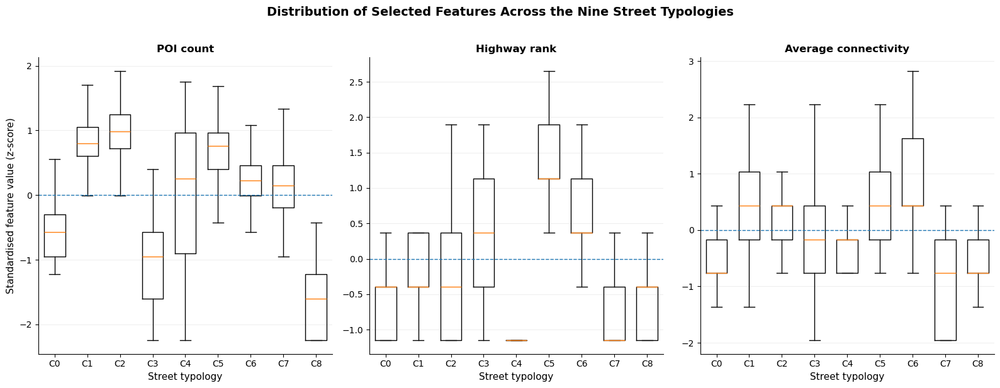

In [99]:
# ============================================================
# Distribution of selected standardised features across
# the final K=9 street typologies
# ============================================================

import matplotlib.pyplot as plt

# Exact standardised matrix used in K-means
boxplot_df = X_scaled.copy().reset_index(drop=True)

# Attach final K=9 labels
boxplot_df['cluster'] = candidate_models[9]['labels']

boxplot_df['typology'] = boxplot_df['cluster'].map({
    0: 'C0',
    1: 'C1',
    2: 'C2',
    3: 'C3',
    4: 'C4',
    5: 'C5',
    6: 'C6',
    7: 'C7',
    8: 'C8'
})

cluster_order = [
    'C0', 'C1', 'C2', 'C3', 'C4',
    'C5', 'C6', 'C7', 'C8'
]

features_to_plot = {
    'poi_count_50m': 'POI count',
    'highway_rank': 'Highway rank',
    'avg_connectivity': 'Average connectivity'
}

fig, axes = plt.subplots(
    1, 3,
    figsize=(16, 6)
)

for ax, (feature, title) in zip(
    axes,
    features_to_plot.items()
):

    data = [
        boxplot_df.loc[
            boxplot_df['typology'] == cluster,
            feature
        ].dropna().values
        for cluster in cluster_order
    ]

    ax.boxplot(
        data,
        tick_labels=cluster_order,
        showfliers=False,
        widths=0.65
    )

    # Overall standardised mean
    ax.axhline(
        0,
        linestyle='--',
        linewidth=1
    )

    ax.set_title(
        title,
        fontsize=12,
        fontweight='bold'
    )

    ax.set_xlabel(
        'Street typology',
        fontsize=11
    )

    ax.grid(
        axis='y',
        alpha=0.2
    )

    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)

axes[0].set_ylabel(
    'Standardised feature value (z-score)',
    fontsize=11
)

fig.suptitle(
    'Distribution of Selected Features Across the Nine Street Typologies',
    fontsize=14,
    fontweight='bold',
    y=1.02
)

plt.tight_layout()

plt.savefig(
    '/home/jovyan/work/outputs/typology_feature_distributions_final.png',
    dpi=300,
    bbox_inches='tight',
    facecolor='white'
)

plt.show()

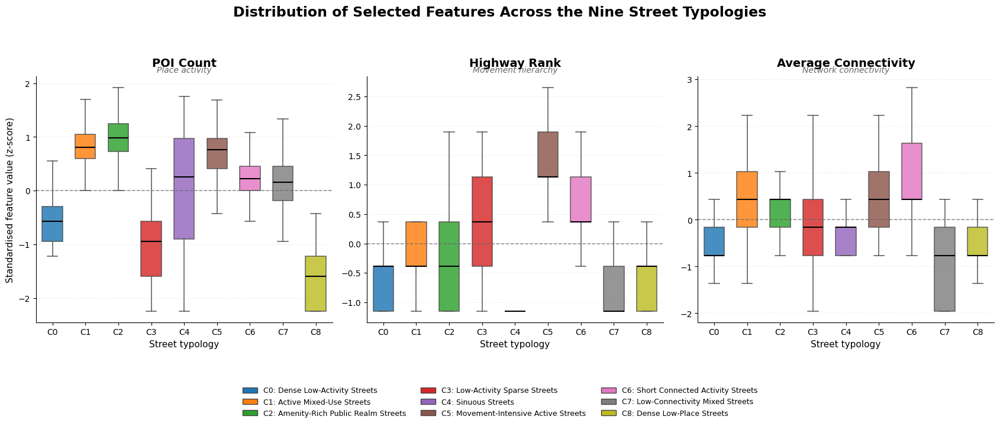

In [100]:
# ============================================================
# Dissertation-ready boxplot figure
# Distribution of selected features across K=9 typologies
# ============================================================

import matplotlib.pyplot as plt
from matplotlib.patches import Patch

# Exact standardised feature matrix used for K-means
boxplot_df = X_scaled.copy().reset_index(drop=True)

boxplot_df['cluster'] = candidate_models[9]['labels']

cluster_order = list(range(9))

cluster_names = {
    0: 'Dense Low-Activity Streets',
    1: 'Active Mixed-Use Streets',
    2: 'Amenity-Rich Public Realm Streets',
    3: 'Low-Activity Sparse Streets',
    4: 'Sinuous Streets',
    5: 'Movement-Intensive Active Streets',
    6: 'Short Connected Activity Streets',
    7: 'Low-Connectivity Mixed Streets',
    8: 'Dense Low-Place Streets'
}

# Same qualitative palette used throughout the dissertation
cluster_colours = {
    0: '#1f77b4',
    1: '#ff7f0e',
    2: '#2ca02c',
    3: '#d62728',
    4: '#9467bd',
    5: '#8c564b',
    6: '#e377c2',
    7: '#7f7f7f',
    8: '#bcbd22'
}

features_to_plot = {
    'poi_count_50m': {
        'title': 'POI Count',
        'subtitle': 'Place activity'
    },
    'highway_rank': {
        'title': 'Highway Rank',
        'subtitle': 'Movement hierarchy'
    },
    'avg_connectivity': {
        'title': 'Average Connectivity',
        'subtitle': 'Network connectivity'
    }
}

# ------------------------------------------------------------
# Figure
# ------------------------------------------------------------

fig, axes = plt.subplots(
    1, 3,
    figsize=(17, 7)
)

for ax, (feature, info) in zip(
    axes,
    features_to_plot.items()
):

    data = [
        boxplot_df.loc[
            boxplot_df['cluster'] == cluster,
            feature
        ].dropna().values
        for cluster in cluster_order
    ]

    bp = ax.boxplot(
        data,
        positions=range(9),
        widths=0.62,
        patch_artist=True,
        showfliers=False,
        medianprops={
            'color': 'black',
            'linewidth': 1.5
        },
        whiskerprops={
            'color': '#555555',
            'linewidth': 1.1
        },
        capprops={
            'color': '#555555',
            'linewidth': 1.1
        },
        boxprops={
            'edgecolor': '#444444',
            'linewidth': 1.1
        }
    )

    # Colour every box according to typology
    for cluster, box in zip(cluster_order, bp['boxes']):
        box.set_facecolor(cluster_colours[cluster])
        box.set_alpha(0.82)

    # Standardised dataset mean
    ax.axhline(
        0,
        color='#666666',
        linestyle='--',
        linewidth=1.1,
        alpha=0.75
    )

    ax.set_title(
        info['title'],
        fontsize=14,
        fontweight='bold',
        pad=12
    )

    # Small conceptual subtitle
    ax.text(
        0.5,
        1.01,
        info['subtitle'],
        transform=ax.transAxes,
        ha='center',
        va='bottom',
        fontsize=10,
        style='italic',
        color='#666666'
    )

    ax.set_xticks(range(9))
    ax.set_xticklabels(
        [f'C{i}' for i in range(9)],
        fontsize=10
    )

    ax.set_xlabel(
        'Street typology',
        fontsize=11
    )

    ax.grid(
        axis='y',
        linestyle='--',
        linewidth=0.6,
        alpha=0.25
    )

    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)

axes[0].set_ylabel(
    'Standardised feature value (z-score)',
    fontsize=11
)

# ------------------------------------------------------------
# Main title
# ------------------------------------------------------------

fig.suptitle(
    'Distribution of Selected Features Across the Nine Street Typologies',
    fontsize=17,
    fontweight='bold',
    y=0.99
)

# ------------------------------------------------------------
# Shared typology legend
# ------------------------------------------------------------

legend_handles = [
    Patch(
        facecolor=cluster_colours[i],
        edgecolor='#444444',
        label=f'C{i}: {cluster_names[i]}'
    )
    for i in cluster_order
]

fig.legend(
    handles=legend_handles,
    loc='lower center',
    bbox_to_anchor=(0.5, -0.02),
    ncol=3,
    frameon=False,
    fontsize=9
)

plt.tight_layout(
    rect=[0, 0.14, 1, 0.94]
)

# ------------------------------------------------------------
# Save
# ------------------------------------------------------------

plt.savefig(
    '/home/jovyan/work/outputs/'
    'typology_feature_distributions_final_coloured.png',
    dpi=300,
    bbox_inches='tight',
    facecolor='white'
)

plt.show()

In [101]:
# Identify possible spatial datasets currently stored in the notebook

for name, obj in list(globals().items()):
    if hasattr(obj, 'geometry'):
        try:
            print(
                f"{name:35s} "
                f"rows={len(obj):6d}   "
                f"CRS={obj.crs}"
            )
        except:
            pass

london                              rows=   927   CRS=EPSG:32630
barcelona                           rows=  1522   CRS=EPSG:32631
singapore                           rows=   385   CRS=EPSG:32648
tokyo                               rows=   848   CRS=EPSG:32654
df                                  rows=   848   CRS=EPSG:32654
problem                             rows=     2   CRS=EPSG:32654
high_conn                           rows=     0   CRS=EPSG:32630
test                                rows=   927   CRS=EPSG:32630
london_k9                           rows=   927   CRS=EPSG:32630
barcelona_k9                        rows=  1522   CRS=EPSG:32631
singapore_k9                        rows=   385   CRS=EPSG:32648
tokyo_k9                            rows=   848   CRS=EPSG:32654
gdf                                 rows=   848   CRS=EPSG:32654
plot_gdf                            rows=   848   CRS=EPSG:3857
cluster_streets                     rows=   377   CRS=EPSG:3857
c4                         

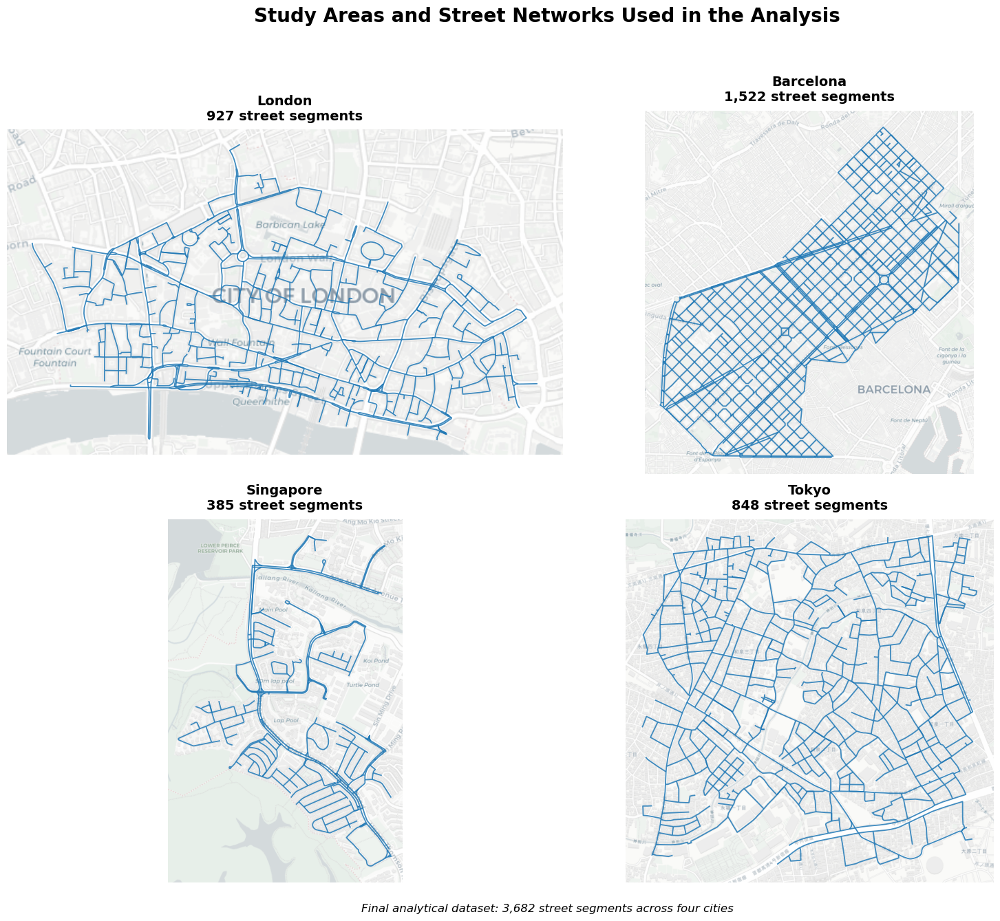

In [106]:
import matplotlib.pyplot as plt
import contextily as ctx

# Final study-area datasets
study_areas = {
    "London": london,
    "Barcelona": barcelona,
    "Singapore": singapore,
    "Tokyo": tokyo
}

fig, axes = plt.subplots(2, 2, figsize=(16, 14))
axes = axes.flatten()

for ax, (city, gdf_city) in zip(axes, study_areas.items()):
    
    # Convert to Web Mercator for basemap
    plot_data = gdf_city.to_crs(epsg=3857)
    
    # Plot final street segments
    plot_data.plot(
        ax=ax,
        linewidth=1.3,
        alpha=0.85
    )
    
    # Add basemap
    ctx.add_basemap(
        ax,
        source=ctx.providers.CartoDB.Positron,
        attribution=False
    )
    
    ax.set_title(
        f"{city}\n{len(gdf_city):,} street segments",
        fontsize=14,
        fontweight="bold",
        pad=10
    )
    
    ax.set_axis_off()

fig.suptitle(
    "Study Areas and Street Networks Used in the Analysis",
    fontsize=20,
    fontweight="bold",
    y=0.97
)

fig.text(
    0.5,
    0.03,
    "Final analytical dataset: 3,682 street segments across four cities",
    ha="center",
    fontsize=12,
    style="italic"
)

plt.tight_layout(rect=[0, 0.05, 1, 0.94])

plt.savefig(
    '/home/jovyan/work/outputs/'
    'figure_3_1_study_area_networks.png',
    dpi=300,
    bbox_inches='tight',
    facecolor='white'
)

plt.show()

In [108]:
# ---------------------------------------------------------
# CHECK FINAL ANALYTICAL DATASETS
# ---------------------------------------------------------

city_dfs_final = {
    "London": london,
    "Barcelona": barcelona,
    "Singapore": singapore,
    "Tokyo": tokyo
}

for city, gdf_city in city_dfs_final.items():
    print("\n" + "=" * 70)
    print(city)
    print("=" * 70)

    print(f"Rows: {len(gdf_city):,}")
    print(f"Columns: {len(gdf_city.columns)}")
    print(f"CRS: {gdf_city.crs}")

    print("\nGeometry types:")
    print(gdf_city.geometry.geom_type.value_counts(dropna=False))

    print("\nMissing geometries:", gdf_city.geometry.isna().sum())
    print("Empty geometries:", gdf_city.geometry.is_empty.sum())
    print("Invalid geometries:", (~gdf_city.geometry.is_valid).sum())

    print("\nExact duplicate rows:")
    print(gdf_city.drop(columns="geometry").duplicated().sum())

    print("\nDuplicate geometries:")
    print(gdf_city.geometry.to_wkb().duplicated().sum())

    print("\nColumns:")
    print(list(gdf_city.columns))


London
Rows: 927
Columns: 36
CRS: EPSG:32630

Geometry types:
LineString    927
Name: count, dtype: int64

Missing geometries: 0
Empty geometries: 0
Invalid geometries: 0

Exact duplicate rows:
75

Duplicate geometries:
84

Columns:
['from_node', 'to_node', 'u', 'v', 'key', 'index', 'osmid', 'maxspeed', 'oneway', 'reversed', 'length', 'access', 'tunnel', 'junction', 'bridge', 'length_m', 'building_count_50m', 'avg_building_area', 'poi_count_50m', 'highway_rank', 'sinuosity', 'poi_diversity', 'food_drink_count', 'street_furniture_count', 'degree_u', 'degree_v', 'avg_connectivity', 'city', 'cluster', 'typology', 'geometry', 'sinuosity_extreme', 'building_count_per_100m', 'poi_count_per_100m', 'food_drink_per_100m', 'street_furniture_per_100m']

Barcelona
Rows: 1,522
Columns: 36
CRS: EPSG:32631

Geometry types:
LineString    1522
Name: count, dtype: int64

Missing geometries: 0
Empty geometries: 0
Invalid geometries: 0

Exact duplicate rows:
141

Duplicate geometries:
143

Columns:
['fro

In [109]:
check_cols = [
    "from_node", "to_node", "u", "v", "key", "index", "osmid",
    "length", "length_m",
    "highway", "highway_clean", "highway_rank",
    "sinuosity", "sinuosity_extreme",
    "degree_u", "degree_v", "avg_connectivity"
]

for city, gdf_city in city_dfs_final.items():
    print("\n" + "=" * 70)
    print(city)
    print("=" * 70)

    available = [c for c in check_cols if c in gdf_city.columns]

    for col in available:
        print(
            f"{col:22s} "
            f"non-null={gdf_city[col].notna().sum():5d}   "
            f"unique={gdf_city[col].nunique(dropna=True):5d}"
        )


London
from_node              non-null=  927   unique=  514
to_node                non-null=  927   unique=  527
u                      non-null=  752   unique=  450
v                      non-null=  752   unique=  465
key                    non-null=  752   unique=    1
index                  non-null=  752   unique=  671
osmid                  non-null=  752   unique=  609
length                 non-null=  752   unique=  671
length_m               non-null=  927   unique=  843
highway_rank           non-null=  927   unique=    6
sinuosity              non-null=  927   unique=  719
sinuosity_extreme      non-null=  927   unique=    2
degree_u               non-null=  752   unique=    8
degree_v               non-null=  752   unique=    8
avg_connectivity       non-null=  752   unique=   12

Barcelona
from_node              non-null= 1522   unique=  760
to_node                non-null= 1522   unique=  762
u                      non-null= 1434   unique=  758
v                      non-

In [110]:
final_feature_cols = [
    "length_m",
    "building_count_50m",
    "avg_building_area",
    "highway_rank",
    "sinuosity",
    "poi_count_50m",
    "poi_diversity",
    "food_drink_count",
    "street_furniture_count",
    "avg_connectivity"
]

for city, gdf_city in city_dfs_final.items():
    print("\n" + "=" * 70)
    print(city)
    print("=" * 70)

    for feature in final_feature_cols:
        if feature in gdf_city.columns:
            print(
                f"{feature:28s} "
                f"missing={gdf_city[feature].isna().sum():4d}   "
                f"min={gdf_city[feature].min():10.3f}   "
                f"max={gdf_city[feature].max():10.3f}"
            )
        else:
            print(f"{feature:28s} MISSING COLUMN")


London
length_m                     missing=   0   min=     1.118   max=   640.367
building_count_50m           missing=   0   min=     2.000   max=    76.000
avg_building_area            missing=   0   min=   195.473   max=  7751.694
highway_rank                 missing=   0   min=     1.000   max=     6.000
sinuosity                    missing=   0   min=     1.000   max=     4.873
poi_count_50m                missing=   0   min=     0.000   max=   103.000
poi_diversity                missing=   0   min=     0.000   max=     1.873
food_drink_count             missing=   0   min=     0.000   max=    33.000
street_furniture_count       missing=   0   min=     0.000   max=    34.000
avg_connectivity             missing= 175   min=     2.000   max=     8.000

Barcelona
length_m                     missing=   0   min=     2.720   max=   482.095
building_count_50m           missing=   0   min=     1.000   max=    88.000
avg_building_area            missing=   0   min=   118.377   max= 127

In [111]:
for city, gdf_city in city_dfs_final.items():
    print(
        city,
        "rows =", len(gdf_city),
        "| avg_connectivity missing =",
        gdf_city["avg_connectivity"].isna().sum()
    )

London rows = 927 | avg_connectivity missing = 175
Barcelona rows = 1522 | avg_connectivity missing = 88
Singapore rows = 385 | avg_connectivity missing = 109
Tokyo rows = 848 | avg_connectivity missing = 173


In [112]:
print("X_scaled shape:", X_scaled.shape)

print("\nX_scaled columns:")
print(list(X_scaled.columns))

print("\nMissing values in X_scaled:")
print(X_scaled.isna().sum())

print("\nTotal missing values:")
print(X_scaled.isna().sum().sum())

X_scaled shape: (3682, 10)

X_scaled columns:
['length_m', 'building_count_50m', 'avg_building_area', 'highway_rank', 'sinuosity', 'poi_count_50m', 'poi_diversity', 'food_drink_count', 'street_furniture_count', 'avg_connectivity']

Missing values in X_scaled:
length_m                  0
building_count_50m        0
avg_building_area         0
highway_rank              0
sinuosity                 0
poi_count_50m             0
poi_diversity             0
food_drink_count          0
street_furniture_count    0
avg_connectivity          0
dtype: int64

Total missing values:
0


In [115]:
# Find every cell that created or modified X_final

for i, cell in enumerate(In):
    if "X_final" in cell:
        print("\n" + "=" * 70)
        print(f"Cell In[{i}]")
        print("=" * 70)
        print(cell[:5000])


Cell In[21]
# Transform strongly right-skewed features before clustering
# log1p handles zero values without removing any streets

LOG_FEATURES = [
    'length_m',
    'building_count_50m',
    'avg_building_area',
    'poi_count_50m',
    'food_drink_count',
    'street_furniture_count'
]

NON_LOG_FEATURES = [
    'highway_rank',
    'poi_diversity',
    'avg_connectivity'
]

print("Log-transformed features:")
for feature in LOG_FEATURES:
    print(f"  {feature}")

print("\nFeatures kept unchanged:")
for feature in NON_LOG_FEATURES:
    print(f"  {feature}")


# Create a copy of the 10 final features for clustering

X_final = all_features[FEATURE_COLS].copy()


# Apply log transformation to the skewed features

for feature in LOG_FEATURES:
    X_final[feature] = np.log1p(X_final[feature])


# Sinuosity starts at 1.0, where 1 represents a straight street
# Transform the amount above 1 rather than the original value

X_final['sinuosity'] = np.log1p(
    X_final['sinuosity'] - 1
)


# C

In [116]:
# Descriptive statistics for final analytical dataset
# Uses original feature values BEFORE log transformation and standardisation

FEATURE_COLS = [
    'length_m',
    'building_count_50m',
    'avg_building_area',
    'highway_rank',
    'sinuosity',
    'poi_count_50m',
    'poi_diversity',
    'food_drink_count',
    'street_furniture_count',
    'avg_connectivity'
]

table_3_2 = all_features[FEATURE_COLS].describe().T[
    ['mean', 'std', 'min', '25%', '50%', '75%', 'max']
].round(2)

table_3_2 = table_3_2.rename(columns={
    'mean': 'Mean',
    'std': 'SD',
    'min': 'Min',
    '25%': '25th percentile',
    '50%': 'Median',
    '75%': '75th percentile',
    'max': 'Max'
})

# Dissertation-friendly feature names
table_3_2.index = [
    'Segment length (m)',
    'Building count within 50 m',
    'Average building footprint area (m²)',
    'Highway rank',
    'Sinuosity',
    'POI count within 50 m',
    'POI diversity',
    'Food and drink count',
    'Street furniture count',
    'Average connectivity'
]

print("Rows in dataset:", len(all_features))
print("\nMissing values:")
print(all_features[FEATURE_COLS].isna().sum())

display(table_3_2)

Rows in dataset: 3682

Missing values:
length_m                  0
building_count_50m        0
avg_building_area         0
highway_rank              0
sinuosity                 0
poi_count_50m             0
poi_diversity             0
food_drink_count          0
street_furniture_count    0
avg_connectivity          0
dtype: int64


,Mean,SD,Min,25th percentile,Median,75th percentile,Max
Segment length (m),80.63,63.93,1.12,30.11,65.32,130.38,640.37
Building count within 50 m,31.81,27.82,0.00,12.00,23.00,43.00,184.00
Average building footprint area (m²),876.58,1192.34,0.00,193.31,509.63,1097.59,14919.67
Highway rank,2.51,1.31,1.00,1.00,2.00,4.00,6.00
Sinuosity,1.04,0.19,1.00,1.00,1.00,1.00,4.87
POI count within 50 m,16.16,14.13,0.00,4.00,13.00,24.00,103.00
POI diversity,1.07,0.57,0.00,0.69,1.28,1.50,1.87
Food and drink count,4.08,4.87,0.00,0.00,2.00,6.00,33.00
Street furniture count,1.71,3.51,0.00,0.00,0.00,2.00,34.00
Average connectivity,3.64,0.84,2.00,3.00,3.50,4.00,7.50


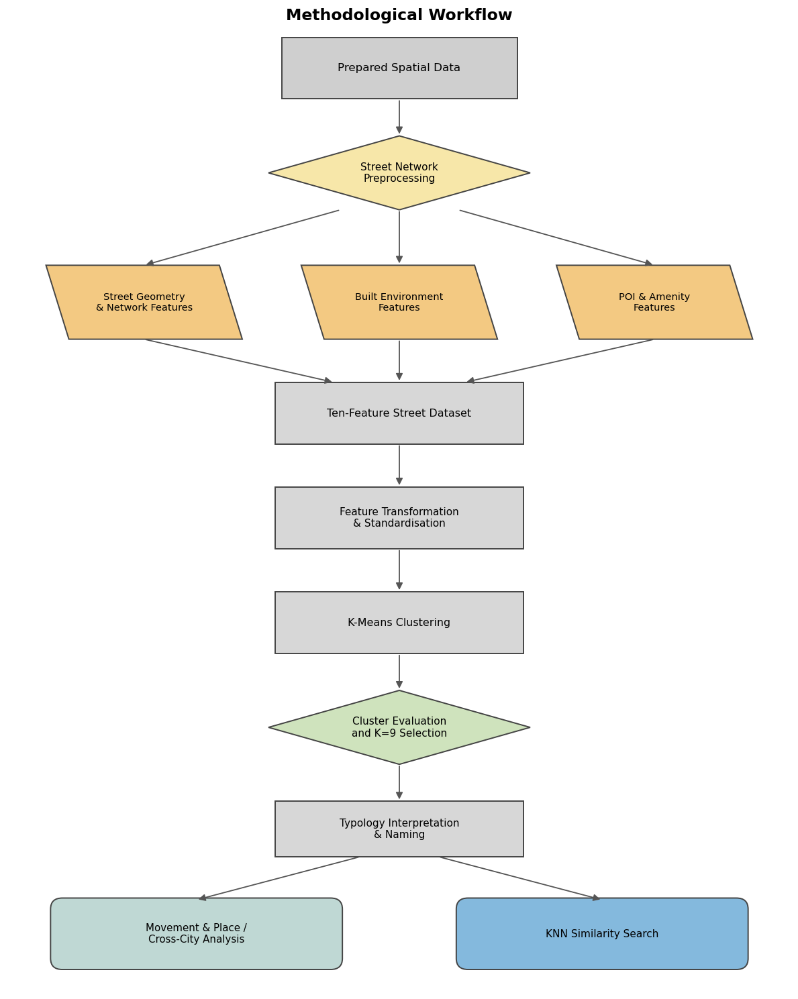

In [117]:
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle, FancyBboxPatch, Polygon, FancyArrowPatch

# ---------------------------------------------------------
# FIGURE 4.1 - Methodology Flowchart
# ---------------------------------------------------------

fig, ax = plt.subplots(figsize=(12, 15))
ax.set_xlim(0, 12)
ax.set_ylim(0, 16)
ax.axis('off')

# ---------------------------------------------------------
# Helper functions
# ---------------------------------------------------------

def add_box(x, y, w, h, text, facecolor='#D9D9D9',
            edgecolor='#444444', fontsize=11,
            rounded=False, italic_line=None):

    if rounded:
        patch = FancyBboxPatch(
            (x, y), w, h,
            boxstyle="round,pad=0.03,rounding_size=0.18",
            facecolor=facecolor,
            edgecolor=edgecolor,
            linewidth=1.4
        )
    else:
        patch = Rectangle(
            (x, y), w, h,
            facecolor=facecolor,
            edgecolor=edgecolor,
            linewidth=1.4
        )

    ax.add_patch(patch)

    ax.text(
        x + w/2,
        y + h/2 + (0.10 if italic_line else 0),
        text,
        ha='center',
        va='center',
        fontsize=fontsize
    )

    if italic_line:
        ax.text(
            x + w/2,
            y + 0.20,
            italic_line,
            ha='center',
            va='bottom',
            fontsize=fontsize-2,
            style='italic'
        )


def add_parallelogram(x, y, w, h, text,
                      facecolor='#F6CD83',
                      edgecolor='#444444',
                      fontsize=10.5):

    skew = 0.35

    points = [
        (x + skew, y),
        (x + w, y),
        (x + w - skew, y + h),
        (x, y + h)
    ]

    patch = Polygon(
        points,
        closed=True,
        facecolor=facecolor,
        edgecolor=edgecolor,
        linewidth=1.4
    )

    ax.add_patch(patch)

    ax.text(
        x + w/2,
        y + h/2,
        text,
        ha='center',
        va='center',
        fontsize=fontsize
    )


def add_diamond(x, y, w, h, text,
                facecolor='#CFE3BD',
                edgecolor='#444444',
                fontsize=10.5):

    points = [
        (x + w/2, y + h),
        (x + w, y + h/2),
        (x + w/2, y),
        (x, y + h/2)
    ]

    patch = Polygon(
        points,
        closed=True,
        facecolor=facecolor,
        edgecolor=edgecolor,
        linewidth=1.4
    )

    ax.add_patch(patch)

    ax.text(
        x + w/2,
        y + h/2,
        text,
        ha='center',
        va='center',
        fontsize=fontsize
    )


def arrow(x1, y1, x2, y2):
    arr = FancyArrowPatch(
        (x1, y1),
        (x2, y2),
        arrowstyle='-|>',
        mutation_scale=15,
        linewidth=1.3,
        color='#555555'
    )
    ax.add_patch(arr)


# ---------------------------------------------------------
# Flowchart nodes
# ---------------------------------------------------------

# 1. Prepared data
add_box(
    4.2, 14.5, 3.6, 1.0,
    'Prepared Spatial Data',
    facecolor='#CFCFCF',
    fontsize=12
)

# 2. Preprocessing
add_diamond(
    4.0, 12.7, 4.0, 1.2,
    'Street Network\nPreprocessing',
    facecolor='#F7E7A9',
    fontsize=11
)

arrow(6.0, 14.5, 6.0, 13.9)

# 3. Three feature groups
add_parallelogram(
    0.6, 10.6, 3.0, 1.2,
    'Street Geometry\n& Network Features',
    facecolor='#F3C982'
)

add_parallelogram(
    4.5, 10.6, 3.0, 1.2,
    'Built Environment\nFeatures',
    facecolor='#F3C982'
)

add_parallelogram(
    8.4, 10.6, 3.0, 1.2,
    'POI & Amenity\nFeatures',
    facecolor='#F3C982'
)

arrow(5.1, 12.7, 2.1, 11.8)
arrow(6.0, 12.7, 6.0, 11.8)
arrow(6.9, 12.7, 9.9, 11.8)

# 4. Ten-feature dataset
add_box(
    4.1, 8.9, 3.8, 1.0,
    'Ten-Feature Street Dataset',
    facecolor='#D7D7D7',
    fontsize=11.5
)

arrow(2.1, 10.6, 5.0, 9.9)
arrow(6.0, 10.6, 6.0, 9.9)
arrow(9.9, 10.6, 7.0, 9.9)

# 5. Transformation
add_box(
    4.1, 7.2, 3.8, 1.0,
    'Feature Transformation\n& Standardisation',
    facecolor='#D7D7D7',
    fontsize=11
)

arrow(6.0, 8.9, 6.0, 8.2)

# 6. K-means
add_box(
    4.1, 5.5, 3.8, 1.0,
    'K-Means Clustering',
    facecolor='#D7D7D7',
    fontsize=11.5
)

arrow(6.0, 7.2, 6.0, 6.5)

# 7. Evaluation
add_diamond(
    4.0, 3.7, 4.0, 1.2,
    'Cluster Evaluation\nand K=9 Selection',
    facecolor='#CFE3BD',
    fontsize=11
)

arrow(6.0, 5.5, 6.0, 4.9)

# 8. Naming
add_box(
    4.1, 2.2, 3.8, 0.9,
    'Typology Interpretation\n& Naming',
    facecolor='#D7D7D7',
    fontsize=11
)

arrow(6.0, 3.7, 6.0, 3.1)

# 9. Final branches
add_box(
    0.7, 0.4, 4.4, 1.1,
    'Movement & Place /\nCross-City Analysis',
    facecolor='#BFD8D4',
    fontsize=10.8,
    rounded=True
)

add_box(
    6.9, 0.4, 4.4, 1.1,
    'KNN Similarity Search',
    facecolor='#84B9DD',
    fontsize=11,
    rounded=True
)

arrow(5.4, 2.2, 2.9, 1.5)
arrow(6.6, 2.2, 9.1, 1.5)

# ---------------------------------------------------------
# Title
# ---------------------------------------------------------

ax.text(
    6,
    15.85,
    'Methodological Workflow',
    ha='center',
    va='center',
    fontsize=17,
    fontweight='bold'
)

# ---------------------------------------------------------
# Save
# ---------------------------------------------------------

plt.tight_layout()

plt.savefig(
    '/home/jovyan/work/outputs/'
    'figure_4_1_methodology_flowchart.png',
    dpi=300,
    bbox_inches='tight',
    facecolor='white'
)

plt.show()

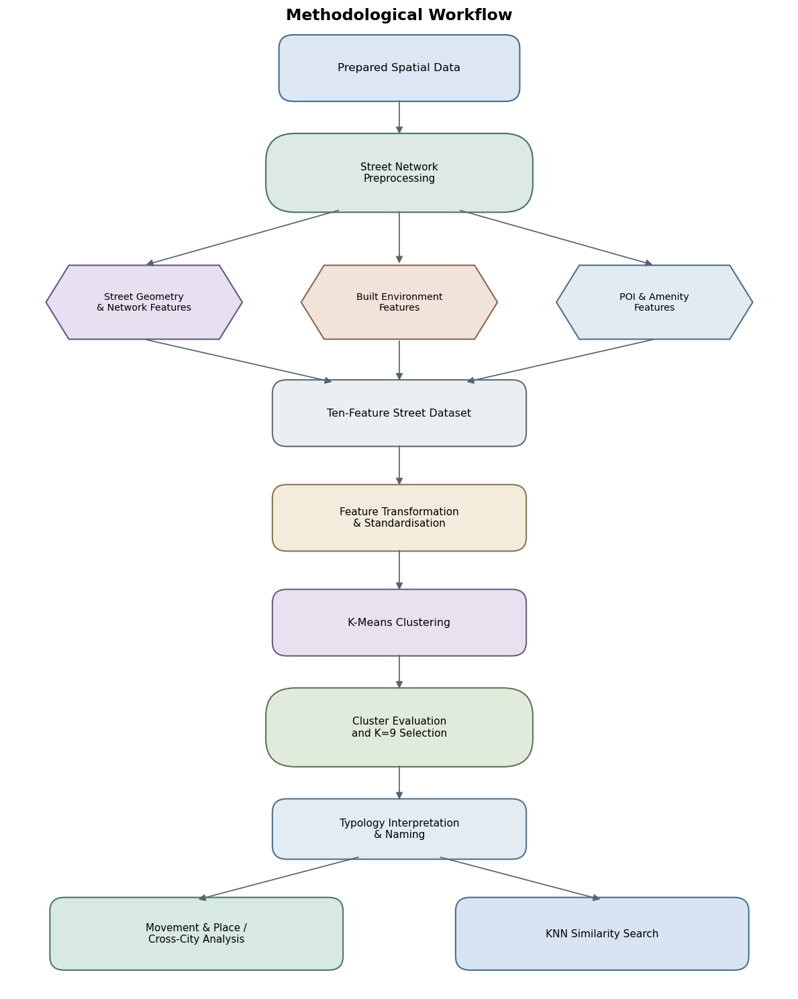

In [120]:
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle, FancyBboxPatch, Polygon, FancyArrowPatch

# ---------------------------------------------------------
# FIGURE 4.1 - Methodology Flowchart
# Same structure, new visual style
# ---------------------------------------------------------

fig, ax = plt.subplots(figsize=(12, 15))
ax.set_xlim(0, 12)
ax.set_ylim(0, 16)
ax.axis('off')


# ---------------------------------------------------------
# Helper functions
# ---------------------------------------------------------

def add_rect(x, y, w, h, text,
             facecolor='#E8EEF6',
             edgecolor='#39536D',
             fontsize=11,
             rounded=False):

    if rounded:
        patch = FancyBboxPatch(
            (x, y), w, h,
            boxstyle="round,pad=0.04,rounding_size=0.22",
            facecolor=facecolor,
            edgecolor=edgecolor,
            linewidth=1.5
        )
    else:
        patch = Rectangle(
            (x, y), w, h,
            facecolor=facecolor,
            edgecolor=edgecolor,
            linewidth=1.5
        )

    ax.add_patch(patch)

    ax.text(
        x + w/2,
        y + h/2,
        text,
        ha='center',
        va='center',
        fontsize=fontsize
    )


def add_pill(x, y, w, h, text,
             facecolor='#DDE9E7',
             edgecolor='#3C6864',
             fontsize=10.8):

    patch = FancyBboxPatch(
        (x, y), w, h,
        boxstyle="round,pad=0.04,rounding_size=0.45",
        facecolor=facecolor,
        edgecolor=edgecolor,
        linewidth=1.5
    )

    ax.add_patch(patch)

    ax.text(
        x + w/2,
        y + h/2,
        text,
        ha='center',
        va='center',
        fontsize=fontsize
    )


def add_hexagon(x, y, w, h, text,
                facecolor='#EAE3F2',
                edgecolor='#66507A',
                fontsize=10.3):

    inset = 0.35

    points = [
        (x + inset, y),
        (x + w - inset, y),
        (x + w, y + h/2),
        (x + w - inset, y + h),
        (x + inset, y + h),
        (x, y + h/2)
    ]

    patch = Polygon(
        points,
        closed=True,
        facecolor=facecolor,
        edgecolor=edgecolor,
        linewidth=1.5
    )

    ax.add_patch(patch)

    ax.text(
        x + w/2,
        y + h/2,
        text,
        ha='center',
        va='center',
        fontsize=fontsize
    )


def arrow(x1, y1, x2, y2):

    arr = FancyArrowPatch(
        (x1, y1),
        (x2, y2),
        arrowstyle='-|>',
        mutation_scale=15,
        linewidth=1.25,
        color='#59636E'
    )

    ax.add_patch(arr)


# ---------------------------------------------------------
# Title
# ---------------------------------------------------------

ax.text(
    6,
    15.85,
    'Methodological Workflow',
    ha='center',
    va='center',
    fontsize=17,
    fontweight='bold'
)


# ---------------------------------------------------------
# 1. Prepared spatial data
# ---------------------------------------------------------

add_rect(
    4.2, 14.5, 3.6, 1.0,
    'Prepared Spatial Data',
    facecolor='#DCE7F3',
    edgecolor='#476A8A',
    fontsize=12,
    rounded=True
)


# ---------------------------------------------------------
# 2. Preprocessing
# ---------------------------------------------------------

add_pill(
    4.0, 12.7, 4.0, 1.2,
    'Street Network\nPreprocessing',
    facecolor='#DCE9E4',
    edgecolor='#497264',
    fontsize=11
)

arrow(6.0, 14.5, 6.0, 13.9)


# ---------------------------------------------------------
# 3. Feature groups
# ---------------------------------------------------------

add_hexagon(
    0.6, 10.6, 3.0, 1.2,
    'Street Geometry\n& Network Features',
    facecolor='#E6E0F0',
    edgecolor='#685581'
)

add_hexagon(
    4.5, 10.6, 3.0, 1.2,
    'Built Environment\nFeatures',
    facecolor='#F2E3DA',
    edgecolor='#8A6654'
)

add_hexagon(
    8.4, 10.6, 3.0, 1.2,
    'POI & Amenity\nFeatures',
    facecolor='#E3EBF2',
    edgecolor='#4E6F88'
)

arrow(5.1, 12.7, 2.1, 11.8)
arrow(6.0, 12.7, 6.0, 11.8)
arrow(6.9, 12.7, 9.9, 11.8)


# ---------------------------------------------------------
# 4. Ten-feature dataset
# ---------------------------------------------------------

add_rect(
    4.1, 8.9, 3.8, 1.0,
    'Ten-Feature Street Dataset',
    facecolor='#ECEFF2',
    edgecolor='#5F6B75',
    fontsize=11.5,
    rounded=True
)

arrow(2.1, 10.6, 5.0, 9.9)
arrow(6.0, 10.6, 6.0, 9.9)
arrow(9.9, 10.6, 7.0, 9.9)


# ---------------------------------------------------------
# 5. Transformation
# ---------------------------------------------------------

add_rect(
    4.1, 7.2, 3.8, 1.0,
    'Feature Transformation\n& Standardisation',
    facecolor='#F3ECDD',
    edgecolor='#897451',
    fontsize=11,
    rounded=True
)

arrow(6.0, 8.9, 6.0, 8.2)


# ---------------------------------------------------------
# 6. K-means
# ---------------------------------------------------------

add_rect(
    4.1, 5.5, 3.8, 1.0,
    'K-Means Clustering',
    facecolor='#E8E2F0',
    edgecolor='#6B5C7D',
    fontsize=11.5,
    rounded=True
)

arrow(6.0, 7.2, 6.0, 6.5)


# ---------------------------------------------------------
# 7. Evaluation
# ---------------------------------------------------------

add_pill(
    4.0, 3.7, 4.0, 1.2,
    'Cluster Evaluation\nand K=9 Selection',
    facecolor='#E1EBDC',
    edgecolor='#5D7754',
    fontsize=11
)

arrow(6.0, 5.5, 6.0, 4.9)


# ---------------------------------------------------------
# 8. Typology interpretation
# ---------------------------------------------------------

add_rect(
    4.1, 2.2, 3.8, 0.9,
    'Typology Interpretation\n& Naming',
    facecolor='#E3EBF3',
    edgecolor='#527089',
    fontsize=11,
    rounded=True
)

arrow(6.0, 3.7, 6.0, 3.1)


# ---------------------------------------------------------
# 9. Final branches
# ---------------------------------------------------------

add_rect(
    0.7, 0.4, 4.4, 1.1,
    'Movement & Place /\nCross-City Analysis',
    facecolor='#D8E8E2',
    edgecolor='#4E7769',
    fontsize=10.8,
    rounded=True
)

add_rect(
    6.9, 0.4, 4.4, 1.1,
    'KNN Similarity Search',
    facecolor='#D8E4F1',
    edgecolor='#4B6E8E',
    fontsize=11,
    rounded=True
)

arrow(5.4, 2.2, 2.9, 1.5)
arrow(6.6, 2.2, 9.1, 1.5)


# ---------------------------------------------------------
# Save
# ---------------------------------------------------------

plt.tight_layout()

plt.savefig(
    '/home/jovyan/work/outputs/'
    'figure_4_1_methodology_flowchart_restyled.png',
    dpi=300,
    bbox_inches='tight',
    facecolor='white'
)

plt.show()

In [127]:
# Verify the final cluster solution

print("X_scaled shape:", X_scaled.shape)

for name in ['kmeans', 'kmeans_final', 'final_kmeans']:
    if name in globals():
        model = globals()[name]
        print(f"\n{name}")
        if hasattr(model, 'n_clusters'):
            print("n_clusters:", model.n_clusters)
        if hasattr(model, 'inertia_'):
            print("inertia:", model.inertia_)

X_scaled shape: (3682, 10)

kmeans
n_clusters: 12
inertia: 13255.92853437787


In [130]:
# ============================================================
# SHOW FINAL K-SELECTION RESULTS
# ============================================================

print("Dataset shape:", X_scaled.shape)

print("\nK-means evaluation results:")
print(
    k_results[
        ['k', 'inertia', 'silhouette',
         'smallest_cluster', 'largest_cluster']
    ].round(3).to_string(index=False)
)

print("\n" + "=" * 60)
print("DIRECT COMPARISON: K=5 vs K=9")
print("=" * 60)

print(
    k_results.loc[
        k_results['k'].isin([5, 9]),
        ['k', 'inertia', 'silhouette',
         'smallest_cluster', 'largest_cluster']
    ].round(3).to_string(index=False)
)

Dataset shape: (3682, 10)

K-means evaluation results:
 k   inertia  silhouette  smallest_cluster  largest_cluster
 2 26452.001       0.301              1203             2479
 3 22798.359       0.242               967             1692
 4 20931.612       0.211               748             1117
 5 18708.529       0.219                55             1092
 6 17301.975       0.216                54             1016
 7 16295.884       0.209                50              871
 8 15454.024       0.175                51              800
 9 14778.827       0.163                50              595
10 14233.786       0.168                18              594
11 13698.129       0.167                22              613
12 13255.929       0.167                24              561

DIRECT COMPARISON: K=5 vs K=9
 k   inertia  silhouette  smallest_cluster  largest_cluster
 5 18708.529       0.219                55             1092
 9 14778.827       0.163                50              595


In [132]:
# ============================================================
# COMPARE K=5 AND K=9 CLUSTER PROFILES
# ============================================================

for k in [5, 9]:

    labels = candidate_models[k]['labels']

    comparison = all_features[FEATURE_COLS].copy()
    comparison['cluster'] = labels

    profiles = (
        comparison
        .groupby('cluster')[FEATURE_COLS]
        .mean()
        .round(2)
    )

    sizes = (
        comparison['cluster']
        .value_counts()
        .sort_index()
    )

    print("\n" + "=" * 100)
    print(f"K = {k}")
    print("=" * 100)

    print("\nCluster sizes:")
    print(sizes.to_string())

    print("\nMean feature profiles:")
    print(profiles.to_string())


K = 5

Cluster sizes:
cluster
0     731
1    1092
2      55
3     938
4     866

Mean feature profiles:
         length_m  building_count_50m  avg_building_area  highway_rank  sinuosity  poi_count_50m  poi_diversity  food_drink_count  street_furniture_count  avg_connectivity
cluster                                                                                                                                                                    
0           92.76               19.76            1045.77          2.27       1.03          27.75           1.47              6.12                    6.53              3.55
1          113.47               31.67             706.61          3.00       1.01          25.50           1.41              7.72                    0.77              4.05
2          184.93               41.85             744.27          1.11       2.26          17.65           1.02              4.36                    2.53              3.32
3           65.96               62.

In [193]:
# ============================================================
# SIMILARITY SEARCH — STEP 1
# Verify the final data available for KNN
# ============================================================

print("X_scaled:")
print("  shape:", X_scaled.shape)
print("  missing values:", X_scaled.isna().sum().sum())
print("  index unique:", X_scaled.index.is_unique)

print("\nall_features:")
print("  shape:", all_features.shape)

print("\nAvailable identification columns:")
id_candidates = [
    'city',
    'cluster',
    'typology',
    'geometry',
    'osmid',
    'name',
    'from_node',
    'to_node'
]

for col in id_candidates:
    if col in all_features.columns:
        print(f"  ✓ {col}")
    else:
        print(f"  ✗ {col}")

print("\nFeature columns:")
for col in FEATURE_COLS:
    print(f"  ✓ {col}")

print("\nFirst five records:")
display_cols = [
    c for c in
    ['city', 'cluster', 'typology', 'osmid', 'name']
    if c in all_features.columns
]

print(all_features[display_cols].head())

X_scaled:
  shape: (3682, 10)
  missing values: 0
  index unique: True

all_features:
  shape: (3682, 13)

Available identification columns:
  ✓ city
  ✓ cluster
  ✓ typology
  ✗ geometry
  ✗ osmid
  ✗ name
  ✗ from_node
  ✗ to_node

Feature columns:
  ✓ length_m
  ✓ building_count_50m
  ✓ avg_building_area
  ✓ highway_rank
  ✓ sinuosity
  ✓ poi_count_50m
  ✓ poi_diversity
  ✓ food_drink_count
  ✓ street_furniture_count
  ✓ avg_connectivity

First five records:
     city  cluster                          typology
0  London        6  Short Connected Activity Streets
1  London        7    Low-Connectivity Mixed Streets
2  London        6  Short Connected Activity Streets
3  London        7    Low-Connectivity Mixed Streets
4  London        7    Low-Connectivity Mixed Streets


In [194]:
# ============================================================
# SIMILARITY SEARCH - STEP 2
# Check alignment with the spatial city datasets
# ============================================================

print("Rows in all_features:", len(all_features))
print()

total_spatial_rows = 0

for city_name, gdf in city_dfs.items():

    print("=" * 65)
    print(city_name)
    print("=" * 65)

    print("Rows in city_dfs:", len(gdf))

    n_features = (all_features['city'] == city_name).sum()
    print("Rows in all_features:", n_features)
    print("Row counts match:", len(gdf) == n_features)

    print("Index unique:", gdf.index.is_unique)

    available = [
        col for col in
        ['from_node', 'to_node', 'osmid', 'geometry']
        if col in gdf.columns
    ]

    print("Available spatial/ID columns:", available)

    total_spatial_rows += len(gdf)

print("\nTotal rows across city_dfs:", total_spatial_rows)
print("Total rows in all_features:", len(all_features))
print(
    "Overall row counts match:",
    total_spatial_rows == len(all_features)
)

Rows in all_features: 3682

London
Rows in city_dfs: 927
Rows in all_features: 927
Row counts match: True
Index unique: True
Available spatial/ID columns: ['from_node', 'to_node', 'osmid', 'geometry']
Barcelona
Rows in city_dfs: 1522
Rows in all_features: 1522
Row counts match: True
Index unique: True
Available spatial/ID columns: ['from_node', 'to_node', 'osmid', 'geometry']
Singapore
Rows in city_dfs: 385
Rows in all_features: 385
Row counts match: True
Index unique: True
Available spatial/ID columns: ['from_node', 'to_node', 'osmid', 'geometry']
Tokyo
Rows in city_dfs: 848
Rows in all_features: 848
Row counts match: True
Index unique: True
Available spatial/ID columns: ['from_node', 'to_node', 'osmid', 'geometry']

Total rows across city_dfs: 3682
Total rows in all_features: 3682
Overall row counts match: True


In [195]:
# ============================================================
# SIMILARITY SEARCH - STEP 3
# Verify row-by-row alignment before attaching geometries
# ============================================================

features_to_check = [
    'length_m',
    'building_count_50m',
    'avg_building_area',
    'highway_rank',
    'sinuosity',
    'poi_count_50m',
    'poi_diversity',
    'food_drink_count',
    'street_furniture_count',
    'avg_connectivity'
]

all_match = True

for city_name, gdf in city_dfs.items():

    city_features = (
        all_features[all_features['city'] == city_name]
        .reset_index(drop=True)
    )

    spatial_features = (
        gdf[features_to_check]
        .reset_index(drop=True)
    )

    print("\n" + "=" * 65)
    print(city_name)
    print("=" * 65)

    city_ok = True

    for feature in features_to_check:

        a = city_features[feature].to_numpy(dtype=float)
        b = spatial_features[feature].to_numpy(dtype=float)

        matches = np.allclose(
            a,
            b,
            rtol=1e-7,
            atol=1e-7,
            equal_nan=True
        )

        print(f"{feature:28s}: {matches}")

        if not matches:
            city_ok = False
            all_match = False

    print("FULL CITY ALIGNMENT:", city_ok)

print("\n" + "=" * 65)
print("ALL 3,682 ROWS SAFELY ALIGNED:", all_match)
print("=" * 65)


London
length_m                    : True
building_count_50m          : True
avg_building_area           : True
highway_rank                : True
sinuosity                   : True
poi_count_50m               : True
poi_diversity               : True
food_drink_count            : True
street_furniture_count      : True
avg_connectivity            : True
FULL CITY ALIGNMENT: True

Barcelona
length_m                    : True
building_count_50m          : True
avg_building_area           : True
highway_rank                : True
sinuosity                   : True
poi_count_50m               : True
poi_diversity               : True
food_drink_count            : True
street_furniture_count      : True
avg_connectivity            : True
FULL CITY ALIGNMENT: True

Singapore
length_m                    : True
building_count_50m          : True
avg_building_area           : True
highway_rank                : True
sinuosity                   : True
poi_count_50m               : True
poi_dive

In [196]:
# ============================================================
# SIMILARITY SEARCH - STEP 4
# Build master spatial search database
# Convert geometry copies to common CRS for storage/mapping
# ============================================================

search_parts = []

for city_name, gdf in city_dfs.items():

    # Work on a copy - original city data remain unchanged
    city_part = gdf.copy()

    # Convert geometry to common geographic CRS
    city_part = city_part.to_crs(epsg=4326)

    # Reset index after reprojection
    city_part = city_part.reset_index(drop=True)

    # Keep useful identifiers, geometry and final features
    keep_cols = [
        col for col in
        ['from_node', 'to_node', 'osmid', 'geometry'] + FEATURE_COLS
        if col in city_part.columns
    ]

    city_part = city_part[keep_cols].copy()
    city_part['city'] = city_name

    search_parts.append(city_part)


# ------------------------------------------------------------
# Combine all four cities
# ------------------------------------------------------------

search_db = gpd.GeoDataFrame(
    pd.concat(search_parts, ignore_index=True),
    geometry='geometry',
    crs='EPSG:4326'
)


# ------------------------------------------------------------
# Attach cluster and typology labels
# ------------------------------------------------------------

search_db['cluster'] = all_features['cluster'].to_numpy()
search_db['typology'] = all_features['typology'].to_numpy()


# ------------------------------------------------------------
# Create reproducible street IDs
# ------------------------------------------------------------

city_sequence = search_db.groupby('city').cumcount() + 1

search_db['street_id'] = [
    f"{city}_{number:04d}"
    for city, number in zip(
        search_db['city'],
        city_sequence
    )
]


# ------------------------------------------------------------
# Arrange useful columns
# ------------------------------------------------------------

front_cols = [
    'street_id',
    'city',
    'cluster',
    'typology',
    'from_node',
    'to_node',
    'osmid',
    'geometry'
]

remaining_cols = [
    col for col in search_db.columns
    if col not in front_cols
]

search_db = search_db[
    front_cols + remaining_cols
]


# ------------------------------------------------------------
# Verification
# ------------------------------------------------------------

print("Search database rows:", len(search_db))
print("Expected rows:", len(X_scaled))
print("CRS:", search_db.crs)

print(
    "Rows align with X_scaled:",
    len(search_db) == len(X_scaled)
)

print("\nCities:")
print(search_db['city'].value_counts())

print("\nMissing geometries:")
print(search_db.geometry.isna().sum())

print("\nEmpty geometries:")
print(search_db.geometry.is_empty.sum())

print("\nFirst five records:")

display(
    search_db[
        [
            'street_id',
            'city',
            'cluster',
            'typology'
        ]
    ].head()
)

Search database rows: 3682
Expected rows: 3682
CRS: EPSG:4326
Rows align with X_scaled: True

Cities:
city
Barcelona    1522
London        927
Tokyo         848
Singapore     385
Name: count, dtype: int64

Missing geometries:
0

Empty geometries:
0

First five records:


,street_id,city,cluster,typology
0,London_0001,London,6,Short Connected Activity Streets
1,London_0002,London,7,Low-Connectivity Mixed Streets
2,London_0003,London,6,Short Connected Activity Streets
3,London_0004,London,7,Low-Connectivity Mixed Streets
4,London_0005,London,7,Low-Connectivity Mixed Streets


In [197]:
# ============================================================
# SIMILARITY SEARCH - STEP 5
# Compare Euclidean and cosine similarity
# Top 9 overall + Top 9 from other cities
# ============================================================

from sklearn.neighbors import NearestNeighbors
import numpy as np
import pandas as pd

X_search = np.asarray(X_scaled)

# ------------------------------------------------------------
# Fit candidate models
# ------------------------------------------------------------

knn_euclidean = NearestNeighbors(
    metric='euclidean',
    algorithm='auto'
)

knn_cosine = NearestNeighbors(
    metric='cosine',
    algorithm='brute'
)

knn_euclidean.fit(X_search)
knn_cosine.fit(X_search)


# ------------------------------------------------------------
# Search function
# ------------------------------------------------------------

def get_similarity_results(
    query_index,
    model,
    metric_name,
    n_results=9
):

    # Search the whole database so that we can also
    # construct a cross-city ranking
    distances, indices = model.kneighbors(
        X_search[query_index].reshape(1, -1),
        n_neighbors=len(search_db)
    )

    results = pd.DataFrame({
        'index': indices[0],
        'distance': distances[0]
    })

    # Remove query street itself
    results = results[
        results['index'] != query_index
    ].copy()

    # Attach street information
    info = search_db.iloc[
        results['index'].to_numpy()
    ][
        ['street_id', 'city', 'cluster', 'typology']
    ].reset_index(drop=True)

    results = results.reset_index(drop=True)

    results = pd.concat(
        [info, results[['distance']]],
        axis=1
    )

    # --------------------------------------------------------
    # Overall top 9
    # --------------------------------------------------------

    overall = results.head(n_results).copy()

    overall.insert(
        0,
        'rank',
        range(1, len(overall) + 1)
    )

    # --------------------------------------------------------
    # Cross-city top 9
    # --------------------------------------------------------

    query_city = search_db.iloc[query_index]['city']

    cross_city = results[
        results['city'] != query_city
    ].head(n_results).copy()

    cross_city.insert(
        0,
        'rank',
        range(1, len(cross_city) + 1)
    )

    return overall, cross_city


# ------------------------------------------------------------
# Compare one example from each city
# ------------------------------------------------------------

test_indices = [
    search_db.index[search_db['city'] == 'London'][0],
    search_db.index[search_db['city'] == 'Barcelona'][0],
    search_db.index[search_db['city'] == 'Singapore'][0],
    search_db.index[search_db['city'] == 'Tokyo'][0]
]


for query_index in test_indices:

    query = search_db.iloc[query_index]

    print("\n" + "=" * 90)
    print("QUERY STREET")
    print("=" * 90)

    print("Street ID:", query['street_id'])
    print("City:", query['city'])
    print("Cluster:", query['cluster'])
    print("Typology:", query['typology'])

    # ========================================================
    # EUCLIDEAN
    # ========================================================

    e_all, e_cross = get_similarity_results(
        query_index,
        knn_euclidean,
        'Euclidean',
        n_results=9
    )

    print("\n--- EUCLIDEAN: TOP 9 OVERALL ---")
    display(e_all)

    print("\n--- EUCLIDEAN: TOP 9 OTHER CITIES ---")
    display(e_cross)

    # ========================================================
    # COSINE
    # ========================================================

    c_all, c_cross = get_similarity_results(
        query_index,
        knn_cosine,
        'Cosine',
        n_results=9
    )

    print("\n--- COSINE: TOP 9 OVERALL ---")
    display(c_all)

    print("\n--- COSINE: TOP 9 OTHER CITIES ---")
    display(c_cross)


QUERY STREET
Street ID: London_0001
City: London
Cluster: 6
Typology: Short Connected Activity Streets

--- EUCLIDEAN: TOP 9 OVERALL ---


,rank,street_id,city,cluster,typology,distance
0,1,London_0128,London,6,Short Connected Activity Streets,1.029196
1,2,London_0114,London,6,Short Connected Activity Streets,1.066493
2,3,London_0107,London,6,Short Connected Activity Streets,1.159582
3,4,London_0041,London,6,Short Connected Activity Streets,1.201323
4,5,London_0040,London,6,Short Connected Activity Streets,1.228337
5,6,London_0121,London,6,Short Connected Activity Streets,1.268781
6,7,London_0115,London,6,Short Connected Activity Streets,1.281827
7,8,London_0109,London,6,Short Connected Activity Streets,1.330155
8,9,London_0716,London,6,Short Connected Activity Streets,1.441452



--- EUCLIDEAN: TOP 9 OTHER CITIES ---


,rank,street_id,city,cluster,typology,distance
20,1,Barcelona_0603,Barcelona,6,Short Connected Activity Streets,1.835940
21,2,Barcelona_0949,Barcelona,6,Short Connected Activity Streets,1.853653
26,3,Barcelona_1267,Barcelona,6,Short Connected Activity Streets,1.906904
28,4,Barcelona_0055,Barcelona,6,Short Connected Activity Streets,1.947875
29,5,Barcelona_1284,Barcelona,6,Short Connected Activity Streets,2.008436
30,6,Barcelona_1285,Barcelona,6,Short Connected Activity Streets,2.008436
33,7,Barcelona_0056,Barcelona,6,Short Connected Activity Streets,2.107931
34,8,Barcelona_0006,Barcelona,6,Short Connected Activity Streets,2.121132
36,9,Barcelona_0005,Barcelona,6,Short Connected Activity Streets,2.140543



--- COSINE: TOP 9 OVERALL ---


,rank,street_id,city,cluster,typology,distance
0,1,London_0128,London,6,Short Connected Activity Streets,0.031140
1,2,London_0114,London,6,Short Connected Activity Streets,0.035117
2,3,London_0041,London,6,Short Connected Activity Streets,0.040826
3,4,London_0109,London,6,Short Connected Activity Streets,0.041072
4,5,London_0107,London,6,Short Connected Activity Streets,0.042300
5,6,London_0040,London,6,Short Connected Activity Streets,0.047772
6,7,London_0121,London,6,Short Connected Activity Streets,0.049907
7,8,London_0115,London,6,Short Connected Activity Streets,0.052158
8,9,Barcelona_0949,Barcelona,6,Short Connected Activity Streets,0.065620



--- COSINE: TOP 9 OTHER CITIES ---


,rank,street_id,city,cluster,typology,distance
8,1,Barcelona_0949,Barcelona,6,Short Connected Activity Streets,0.065620
15,2,Barcelona_0603,Barcelona,6,Short Connected Activity Streets,0.093768
23,3,Barcelona_1267,Barcelona,6,Short Connected Activity Streets,0.114090
24,4,Barcelona_0055,Barcelona,6,Short Connected Activity Streets,0.116659
25,5,Barcelona_1284,Barcelona,6,Short Connected Activity Streets,0.119298
26,6,Barcelona_1285,Barcelona,6,Short Connected Activity Streets,0.119298
31,7,Barcelona_1296,Barcelona,6,Short Connected Activity Streets,0.122321
35,8,Barcelona_0005,Barcelona,6,Short Connected Activity Streets,0.131876
36,9,Barcelona_0006,Barcelona,6,Short Connected Activity Streets,0.136464



QUERY STREET
Street ID: Barcelona_0001
City: Barcelona
Cluster: 2
Typology: Amenity-Rich Public Realm Streets

--- EUCLIDEAN: TOP 9 OVERALL ---


,rank,street_id,city,cluster,typology,distance
0,1,Barcelona_0878,Barcelona,2,Amenity-Rich Public Realm Streets,0.664427
1,2,Barcelona_1383,Barcelona,2,Amenity-Rich Public Realm Streets,0.774907
2,3,Barcelona_1384,Barcelona,2,Amenity-Rich Public Realm Streets,0.774907
3,4,Barcelona_1378,Barcelona,2,Amenity-Rich Public Realm Streets,0.860288
4,5,Barcelona_1347,Barcelona,2,Amenity-Rich Public Realm Streets,0.866682
5,6,Barcelona_0432,Barcelona,2,Amenity-Rich Public Realm Streets,1.060918
6,7,Barcelona_0977,Barcelona,2,Amenity-Rich Public Realm Streets,1.090035
7,8,Barcelona_0447,Barcelona,2,Amenity-Rich Public Realm Streets,1.114095
8,9,Barcelona_1451,Barcelona,2,Amenity-Rich Public Realm Streets,1.161641



--- EUCLIDEAN: TOP 9 OTHER CITIES ---


,rank,street_id,city,cluster,typology,distance
11,1,London_0800,London,6,Short Connected Activity Streets,1.317216
12,2,London_0799,London,6,Short Connected Activity Streets,1.317216
13,3,London_0690,London,2,Amenity-Rich Public Realm Streets,1.397655
15,4,London_0646,London,2,Amenity-Rich Public Realm Streets,1.414374
17,5,London_0284,London,2,Amenity-Rich Public Realm Streets,1.449294
19,6,London_0811,London,2,Amenity-Rich Public Realm Streets,1.495084
20,7,London_0317,London,2,Amenity-Rich Public Realm Streets,1.501920
21,8,London_0316,London,2,Amenity-Rich Public Realm Streets,1.501920
22,9,London_0445,London,2,Amenity-Rich Public Realm Streets,1.509882



--- COSINE: TOP 9 OVERALL ---


,rank,street_id,city,cluster,typology,distance
0,1,Barcelona_0878,Barcelona,2,Amenity-Rich Public Realm Streets,0.026018
1,2,Barcelona_1383,Barcelona,2,Amenity-Rich Public Realm Streets,0.032060
2,3,Barcelona_1384,Barcelona,2,Amenity-Rich Public Realm Streets,0.032060
3,4,Barcelona_1378,Barcelona,2,Amenity-Rich Public Realm Streets,0.043626
4,5,Barcelona_1347,Barcelona,2,Amenity-Rich Public Realm Streets,0.044446
5,6,Barcelona_0447,Barcelona,2,Amenity-Rich Public Realm Streets,0.061763
6,7,Barcelona_0432,Barcelona,2,Amenity-Rich Public Realm Streets,0.064769
7,8,Barcelona_0977,Barcelona,2,Amenity-Rich Public Realm Streets,0.070469
8,9,Barcelona_1057,Barcelona,6,Short Connected Activity Streets,0.070841



--- COSINE: TOP 9 OTHER CITIES ---


,rank,street_id,city,cluster,typology,distance
9,1,London_0316,London,2,Amenity-Rich Public Realm Streets,0.081316
10,2,London_0317,London,2,Amenity-Rich Public Realm Streets,0.081316
13,3,London_0660,London,2,Amenity-Rich Public Realm Streets,0.095554
14,4,London_0799,London,6,Short Connected Activity Streets,0.096731
15,5,London_0800,London,6,Short Connected Activity Streets,0.096731
16,6,London_0284,London,2,Amenity-Rich Public Realm Streets,0.100973
17,7,London_0690,London,2,Amenity-Rich Public Realm Streets,0.102310
18,8,London_0646,London,2,Amenity-Rich Public Realm Streets,0.118131
21,9,London_0315,London,2,Amenity-Rich Public Realm Streets,0.130545



QUERY STREET
Street ID: Singapore_0001
City: Singapore
Cluster: 8
Typology: High-Building-Count Low-Place Streets

--- EUCLIDEAN: TOP 9 OVERALL ---


,rank,street_id,city,cluster,typology,distance
0,1,Singapore_0116,Singapore,8,High-Building-Count Low-Place Streets,0.757460
1,2,Singapore_0063,Singapore,8,High-Building-Count Low-Place Streets,0.780730
2,3,Singapore_0114,Singapore,8,High-Building-Count Low-Place Streets,0.827369
3,4,Singapore_0055,Singapore,8,High-Building-Count Low-Place Streets,0.984321
4,5,Singapore_0062,Singapore,8,High-Building-Count Low-Place Streets,1.007842
5,6,Singapore_0275,Singapore,8,High-Building-Count Low-Place Streets,1.039397
6,7,Singapore_0088,Singapore,8,High-Building-Count Low-Place Streets,1.108569
7,8,Singapore_0280,Singapore,8,High-Building-Count Low-Place Streets,1.335449
8,9,Singapore_0279,Singapore,8,High-Building-Count Low-Place Streets,1.335449



--- EUCLIDEAN: TOP 9 OTHER CITIES ---


,rank,street_id,city,cluster,typology,distance
29,1,Barcelona_1315,Barcelona,3,Low-Building-Count Low-Activity Streets,5.296220
34,2,Barcelona_1313,Barcelona,3,Low-Building-Count Low-Activity Streets,5.450923
35,3,Barcelona_1050,Barcelona,3,Low-Building-Count Low-Activity Streets,5.494787
37,4,Barcelona_0064,Barcelona,3,Low-Building-Count Low-Activity Streets,5.654414
39,5,Barcelona_0051,Barcelona,3,Low-Building-Count Low-Activity Streets,5.682996
40,6,Tokyo_0275,Tokyo,8,High-Building-Count Low-Place Streets,5.689711
42,7,Barcelona_0065,Barcelona,3,Low-Building-Count Low-Activity Streets,5.704020
43,8,Tokyo_0167,Tokyo,3,Low-Building-Count Low-Activity Streets,5.706878
49,9,Tokyo_0448,Tokyo,8,High-Building-Count Low-Place Streets,5.822762



--- COSINE: TOP 9 OVERALL ---


,rank,street_id,city,cluster,typology,distance
0,1,Singapore_0116,Singapore,8,High-Building-Count Low-Place Streets,0.005396
1,2,Singapore_0063,Singapore,8,High-Building-Count Low-Place Streets,0.005688
2,3,Singapore_0114,Singapore,8,High-Building-Count Low-Place Streets,0.006217
3,4,Singapore_0062,Singapore,8,High-Building-Count Low-Place Streets,0.008863
4,5,Singapore_0055,Singapore,8,High-Building-Count Low-Place Streets,0.009146
5,6,Singapore_0275,Singapore,8,High-Building-Count Low-Place Streets,0.010068
6,7,Singapore_0088,Singapore,8,High-Building-Count Low-Place Streets,0.011644
7,8,Singapore_0280,Singapore,8,High-Building-Count Low-Place Streets,0.016810
8,9,Singapore_0279,Singapore,8,High-Building-Count Low-Place Streets,0.016810



--- COSINE: TOP 9 OTHER CITIES ---


,rank,street_id,city,cluster,typology,distance
23,1,Barcelona_0051,Barcelona,3,Low-Building-Count Low-Activity Streets,0.232692
27,2,Barcelona_1315,Barcelona,3,Low-Building-Count Low-Activity Streets,0.269613
30,3,Barcelona_1313,Barcelona,3,Low-Building-Count Low-Activity Streets,0.281721
31,4,Barcelona_1050,Barcelona,3,Low-Building-Count Low-Activity Streets,0.284647
32,5,Tokyo_0167,Tokyo,3,Low-Building-Count Low-Activity Streets,0.303789
33,6,Barcelona_0067,Barcelona,6,Short Connected Activity Streets,0.305771
39,7,Tokyo_0234,Tokyo,3,Low-Building-Count Low-Activity Streets,0.319121
43,8,Barcelona_0064,Barcelona,3,Low-Building-Count Low-Activity Streets,0.352567
44,9,Tokyo_0378,Tokyo,0,High-Building-Count Low-Activity Streets,0.356686



QUERY STREET
Street ID: Tokyo_0001
City: Tokyo
Cluster: 7
Typology: Low-Connectivity Mixed Streets

--- EUCLIDEAN: TOP 9 OVERALL ---


,rank,street_id,city,cluster,typology,distance
0,1,Tokyo_0669,Tokyo,0,High-Building-Count Low-Activity Streets,0.532121
1,2,Barcelona_0476,Barcelona,6,Short Connected Activity Streets,1.065436
2,3,London_0434,London,7,Low-Connectivity Mixed Streets,1.269343
3,4,London_0049,London,0,High-Building-Count Low-Activity Streets,1.333011
4,5,Barcelona_0046,Barcelona,7,Low-Connectivity Mixed Streets,1.540735
5,6,Singapore_0064,Singapore,7,Low-Connectivity Mixed Streets,1.544268
6,7,Barcelona_0952,Barcelona,7,Low-Connectivity Mixed Streets,1.583889
7,8,Tokyo_0667,Tokyo,0,High-Building-Count Low-Activity Streets,1.599233
8,9,Barcelona_0748,Barcelona,6,Short Connected Activity Streets,1.652946



--- EUCLIDEAN: TOP 9 OTHER CITIES ---


,rank,street_id,city,cluster,typology,distance
1,1,Barcelona_0476,Barcelona,6,Short Connected Activity Streets,1.065436
2,2,London_0434,London,7,Low-Connectivity Mixed Streets,1.269343
3,3,London_0049,London,0,High-Building-Count Low-Activity Streets,1.333011
4,4,Barcelona_0046,Barcelona,7,Low-Connectivity Mixed Streets,1.540735
5,5,Singapore_0064,Singapore,7,Low-Connectivity Mixed Streets,1.544268
6,6,Barcelona_0952,Barcelona,7,Low-Connectivity Mixed Streets,1.583889
8,7,Barcelona_0748,Barcelona,6,Short Connected Activity Streets,1.652946
9,8,London_0057,London,7,Low-Connectivity Mixed Streets,1.656665
10,9,Barcelona_1194,Barcelona,7,Low-Connectivity Mixed Streets,1.674352



--- COSINE: TOP 9 OVERALL ---


,rank,street_id,city,cluster,typology,distance
0,1,Tokyo_0669,Tokyo,0,High-Building-Count Low-Activity Streets,0.024234
1,2,London_0057,London,7,Low-Connectivity Mixed Streets,0.081674
2,3,Barcelona_0476,Barcelona,6,Short Connected Activity Streets,0.101357
3,4,London_0434,London,7,Low-Connectivity Mixed Streets,0.152502
4,5,London_0049,London,0,High-Building-Count Low-Activity Streets,0.169847
5,6,Barcelona_0046,Barcelona,7,Low-Connectivity Mixed Streets,0.182369
6,7,London_0097,London,7,Low-Connectivity Mixed Streets,0.189988
7,8,Tokyo_0111,Tokyo,0,High-Building-Count Low-Activity Streets,0.217033
8,9,Tokyo_0086,Tokyo,0,High-Building-Count Low-Activity Streets,0.217069



--- COSINE: TOP 9 OTHER CITIES ---


,rank,street_id,city,cluster,typology,distance
1,1,London_0057,London,7,Low-Connectivity Mixed Streets,0.081674
2,2,Barcelona_0476,Barcelona,6,Short Connected Activity Streets,0.101357
3,3,London_0434,London,7,Low-Connectivity Mixed Streets,0.152502
4,4,London_0049,London,0,High-Building-Count Low-Activity Streets,0.169847
5,5,Barcelona_0046,Barcelona,7,Low-Connectivity Mixed Streets,0.182369
6,6,London_0097,London,7,Low-Connectivity Mixed Streets,0.189988
10,7,Singapore_0064,Singapore,7,Low-Connectivity Mixed Streets,0.233675
11,8,London_0037,London,7,Low-Connectivity Mixed Streets,0.241493
12,9,Barcelona_0952,Barcelona,7,Low-Connectivity Mixed Streets,0.251780


In [198]:
# ============================================================
# SIMILARITY SEARCH - STEP 6
# Final Euclidean precedent-search function
# ============================================================

from sklearn.neighbors import NearestNeighbors
import numpy as np
import pandas as pd

X_search = np.asarray(X_scaled)

# Fit final nearest-neighbour model
similarity_model = NearestNeighbors(
    metric='euclidean',
    algorithm='auto'
)

similarity_model.fit(X_search)


def find_similar_streets(
    query_index,
    n_results=9,
    cross_city_only=False
):
    """
    Retrieve the most similar street segments using Euclidean
    distance in the transformed and standardised ten-feature space.

    Parameters
    ----------
    query_index : int
        Row index of the query street.

    n_results : int
        Number of precedents to return.

    cross_city_only : bool
        If True, exclude streets from the query street's city.
    """

    query_vector = X_search[
        query_index
    ].reshape(1, -1)

    # Search full database so city filtering can be applied
    distances, indices = similarity_model.kneighbors(
        query_vector,
        n_neighbors=len(search_db)
    )

    query_city = search_db.iloc[query_index]['city']

    matches = []

    for idx, distance in zip(
        indices[0],
        distances[0]
    ):

        # Exclude query street itself
        if idx == query_index:
            continue

        # Optional cross-city restriction
        if (
            cross_city_only
            and search_db.iloc[idx]['city'] == query_city
        ):
            continue

        matches.append({
            'database_index': idx,
            'street_id': search_db.iloc[idx]['street_id'],
            'city': search_db.iloc[idx]['city'],
            'cluster': search_db.iloc[idx]['cluster'],
            'typology': search_db.iloc[idx]['typology'],
            'distance': distance
        })

        if len(matches) == n_results:
            break

    results = pd.DataFrame(matches)

    results.insert(
        0,
        'rank',
        range(1, len(results) + 1)
    )

    return results


# ============================================================
# TEST
# London_0001
# ============================================================

query_index = 0

print("QUERY:")
print(
    search_db.iloc[query_index][
        ['street_id', 'city', 'cluster', 'typology']
    ]
)

print("\nTOP 9 OVERALL:")
display(
    find_similar_streets(
        query_index,
        n_results=9,
        cross_city_only=False
    )
)

print("\nTOP 9 CROSS-CITY PRECEDENTS:")
display(
    find_similar_streets(
        query_index,
        n_results=9,
        cross_city_only=True
    )
)

QUERY:
street_id                         London_0001
city                                   London
cluster                                     6
typology     Short Connected Activity Streets
Name: 0, dtype: object

TOP 9 OVERALL:


,rank,database_index,street_id,city,cluster,typology,distance
0,1,127,London_0128,London,6,Short Connected Activity Streets,1.029196
1,2,113,London_0114,London,6,Short Connected Activity Streets,1.066493
2,3,106,London_0107,London,6,Short Connected Activity Streets,1.159582
3,4,40,London_0041,London,6,Short Connected Activity Streets,1.201323
4,5,39,London_0040,London,6,Short Connected Activity Streets,1.228337
5,6,120,London_0121,London,6,Short Connected Activity Streets,1.268781
6,7,114,London_0115,London,6,Short Connected Activity Streets,1.281827
7,8,108,London_0109,London,6,Short Connected Activity Streets,1.330155
8,9,715,London_0716,London,6,Short Connected Activity Streets,1.441452



TOP 9 CROSS-CITY PRECEDENTS:


,rank,database_index,street_id,city,cluster,typology,distance
0,1,1529,Barcelona_0603,Barcelona,6,Short Connected Activity Streets,1.835940
1,2,1875,Barcelona_0949,Barcelona,6,Short Connected Activity Streets,1.853653
2,3,2193,Barcelona_1267,Barcelona,6,Short Connected Activity Streets,1.906904
3,4,981,Barcelona_0055,Barcelona,6,Short Connected Activity Streets,1.947875
4,5,2210,Barcelona_1284,Barcelona,6,Short Connected Activity Streets,2.008436
5,6,2211,Barcelona_1285,Barcelona,6,Short Connected Activity Streets,2.008436
6,7,982,Barcelona_0056,Barcelona,6,Short Connected Activity Streets,2.107931
7,8,932,Barcelona_0006,Barcelona,6,Short Connected Activity Streets,2.121132
8,9,931,Barcelona_0005,Barcelona,6,Short Connected Activity Streets,2.140543


In [199]:
# ============================================================
# SIMILARITY SEARCH - STEP 7
# Find current notebook datasets containing street names
# ============================================================

name_sources = []

for variable_name, obj in list(globals().items()):

    if isinstance(obj, (pd.DataFrame, gpd.GeoDataFrame)):

        if 'name' in obj.columns:

            name_sources.append({
                'object': variable_name,
                'rows': len(obj),
                'has_geometry': 'geometry' in obj.columns,
                'non_null_names': obj['name'].notna().sum(),
                'unique_names': obj['name'].nunique()
            })

if len(name_sources) > 0:

    name_sources_df = pd.DataFrame(name_sources)

    print("=" * 80)
    print("DATASETS CONTAINING A 'name' COLUMN")
    print("=" * 80)

    display(name_sources_df)

else:

    print("No current DataFrame or GeoDataFrame contains a 'name' column.")

DATASETS CONTAINING A 'name' COLUMN


,object,rows,has_geometry,non_null_names,unique_names
0,london_buildings_fig,5807,True,1672,1611
1,london_pois_fig,8363,True,4919,4096
2,buildings_plot,5807,True,1672,1611
3,pois_plot,8363,True,4919,4096
4,original,1577,True,215,20


In [200]:
# ============================================================
# SIMILARITY SEARCH - STEP 7B
# Locate original street files and inspect their columns
# ============================================================

import os
import geopandas as gpd

print("=" * 80)
print("POSSIBLE STREET FILES")
print("=" * 80)

street_files = []

for root, dirs, files in os.walk(DATA_DIR):

    for file in files:

        lower = file.lower()

        if (
            lower.endswith(('.geojson', '.gpkg', '.shp'))
            and any(
                term in lower
                for term in [
                    'street',
                    'streets',
                    'edge',
                    'edges',
                    'network'
                ]
            )
        ):

            path = os.path.join(root, file)
            street_files.append(path)

            print(path)


print("\n" + "=" * 80)
print("INSPECTING FILES")
print("=" * 80)

for path in street_files:

    try:

        test = gpd.read_file(path)

        print("\nFILE:")
        print(path)

        print("Rows:", len(test))

        print("Columns:")
        print(test.columns.tolist())

        print("Has name column:", 'name' in test.columns)

        if 'name' in test.columns:

            print(
                "Non-null names:",
                test['name'].notna().sum()
            )

            print("Example names:")

            print(
                test['name']
                .dropna()
                .astype(str)
                .drop_duplicates()
                .head(10)
                .tolist()
            )

    except Exception as e:

        print("\nCould not read:")
        print(path)
        print("Reason:", e)

POSSIBLE STREET FILES
/home/jovyan/work/data/singapore_streets.gpkg
/home/jovyan/work/data/london_streets.gpkg
/home/jovyan/work/data/tokyo_streets.gpkg
/home/jovyan/work/data/singapore_streets.geojson
/home/jovyan/work/data/tokyo_streets.geojson
/home/jovyan/work/data/barcelona_streets.geojson
/home/jovyan/work/data/barcelona_streets.gpkg
/home/jovyan/work/data/london_streets.geojson

INSPECTING FILES

FILE:
/home/jovyan/work/data/singapore_streets.gpkg
Rows: 548
Columns:
['u', 'v', 'key', 'osmid', 'highway', 'lanes', 'maxspeed', 'name', 'oneway', 'reversed', 'length', 'bridge', 'junction', 'geometry']
Has name column: True
Non-null names: 515
Example names:
['Sin Ming Road', 'Upper Thomson Road', 'Thomson Ridge', 'Island Gardens Walk', 'Jalan Tambur', 'Ang Mo Kio Avenue 1', 'Jasmine Road', 'Ang Mo Kio Avenue 3', 'Ang Mo Kio Avenue 4', 'Sin Ming Drive']

FILE:
/home/jovyan/work/data/london_streets.gpkg
Rows: 1382
Columns:
['u', 'v', 'key', 'osmid', 'highway', 'lanes', 'maxspeed', 'nam

Skipping field lanes: unsupported OGR type: 5
Skipping field name: unsupported OGR type: 5
Skipping field highway: unsupported OGR type: 5
Skipping field lanes: unsupported OGR type: 5
Skipping field name: unsupported OGR type: 5
Skipping field maxspeed: unsupported OGR type: 5
Skipping field highway_clean: unsupported OGR type: 5



FILE:
/home/jovyan/work/data/singapore_streets.geojson
Rows: 548
Columns:
['u', 'v', 'key', 'index', 'osmid', 'highway', 'maxspeed', 'oneway', 'reversed', 'length', 'bridge', 'junction', 'length_m', 'building_count_50m', 'avg_building_area', 'poi_count_50m', 'highway_clean', 'highway_rank', 'sinuosity', 'poi_diversity', 'food_drink_count', 'street_furniture_count', 'degree_u', 'degree_v', 'avg_connectivity', 'city', 'cluster', 'typology', 'geometry']
Has name column: False

FILE:
/home/jovyan/work/data/tokyo_streets.geojson
Rows: 1577
Columns:
['u', 'v', 'key', 'index', 'osmid', 'oneway', 'ref', 'reversed', 'length', 'access', 'bridge', 'width', 'length_m', 'building_count_50m', 'avg_building_area', 'poi_count_50m', 'highway_rank', 'sinuosity', 'poi_diversity', 'food_drink_count', 'street_furniture_count', 'degree_u', 'degree_v', 'avg_connectivity', 'city', 'cluster', 'typology', 'geometry']
Has name column: False


Skipping field highway: unsupported OGR type: 5
Skipping field lanes: unsupported OGR type: 5
Skipping field maxspeed: unsupported OGR type: 5
Skipping field name: unsupported OGR type: 5
Skipping field width: unsupported OGR type: 5
Skipping field highway_clean: unsupported OGR type: 5



FILE:
/home/jovyan/work/data/barcelona_streets.geojson
Rows: 1503
Columns:
['u', 'v', 'key', 'index', 'osmid', 'oneway', 'reversed', 'length', 'ref', 'access', 'bridge', 'junction', 'est_width', 'length_m', 'building_count_50m', 'avg_building_area', 'poi_count_50m', 'highway_rank', 'sinuosity', 'poi_diversity', 'food_drink_count', 'street_furniture_count', 'degree_u', 'degree_v', 'avg_connectivity', 'city', 'cluster', 'typology', 'geometry']
Has name column: False

FILE:
/home/jovyan/work/data/barcelona_streets.gpkg
Rows: 1503
Columns:
['u', 'v', 'key', 'osmid', 'highway', 'lanes', 'maxspeed', 'name', 'oneway', 'reversed', 'length', 'width', 'ref', 'access', 'bridge', 'junction', 'est_width', 'geometry']
Has name column: True
Non-null names: 1484
Example names:
['Plaça de Catalunya', 'Ronda de la Universitat', 'Rambla de Catalunya', "Plaça d'Urquinaona", 'Ronda de Sant Pere', 'Carrer de Balmes', 'Passeig de Gràcia', 'Gran Via de les Corts Catalanes', 'Carrer del Bruc', 'Carrer de Traf

Skipping field highway: unsupported OGR type: 5
Skipping field lanes: unsupported OGR type: 5
Skipping field name: unsupported OGR type: 5
Skipping field ref: unsupported OGR type: 5
Skipping field width: unsupported OGR type: 5
Skipping field highway_clean: unsupported OGR type: 5



FILE:
/home/jovyan/work/data/london_streets.geojson
Rows: 1382
Columns:
['u', 'v', 'key', 'index', 'osmid', 'maxspeed', 'oneway', 'reversed', 'length', 'access', 'tunnel', 'junction', 'bridge', 'length_m', 'building_count_50m', 'avg_building_area', 'poi_count_50m', 'highway_rank', 'sinuosity', 'poi_diversity', 'food_drink_count', 'street_furniture_count', 'degree_u', 'degree_v', 'avg_connectivity', 'city', 'cluster', 'typology', 'geometry']
Has name column: False


In [201]:
# ============================================================
# SIMILARITY SEARCH - STEP 7C
# Test recovery of street names using OSM IDs
# DO NOT modify search_db yet
# ============================================================

import geopandas as gpd
import pandas as pd
import ast

original_files = {
    'London': '/home/jovyan/work/data/london_streets.gpkg',
    'Barcelona': '/home/jovyan/work/data/barcelona_streets.gpkg',
    'Singapore': '/home/jovyan/work/data/singapore_streets.gpkg',
    'Tokyo': '/home/jovyan/work/data/tokyo_streets.gpkg'
}


# ------------------------------------------------------------
# Normalise OSM IDs
# Handles integers, strings and list-like OSM IDs
# ------------------------------------------------------------

def normalise_osmid(value):

    if value is None:
        return []

    if isinstance(value, (list, tuple, set)):
        return [str(x) for x in value]

    # Sometimes lists have been stored as strings
    if isinstance(value, str):

        value = value.strip()

        if value.startswith('[') and value.endswith(']'):
            try:
                parsed = ast.literal_eval(value)

                if isinstance(parsed, (list, tuple, set)):
                    return [str(x) for x in parsed]

            except:
                pass

    return [str(value)]


# ------------------------------------------------------------
# Build OSM ID -> street name lookup for each city
# ------------------------------------------------------------

name_lookup_by_city = {}

for city, path in original_files.items():

    original = gpd.read_file(path)

    lookup = {}

    for _, row in original.iterrows():

        name = row.get('name')

        if pd.isna(name):
            continue

        osmids = normalise_osmid(row.get('osmid'))

        for osmid in osmids:

            if osmid not in lookup:
                lookup[osmid] = set()

            lookup[osmid].add(str(name))

    name_lookup_by_city[city] = lookup


# ------------------------------------------------------------
# Test name recovery for final search database
# ------------------------------------------------------------

recovered_names = []

for _, row in search_db.iterrows():

    city = row['city']
    osmids = normalise_osmid(row['osmid'])

    names = set()

    lookup = name_lookup_by_city[city]

    for osmid in osmids:

        if osmid in lookup:
            names.update(lookup[osmid])

    if len(names) == 0:
        recovered_names.append(None)

    else:
        recovered_names.append(
            ' / '.join(sorted(names))
        )


# ------------------------------------------------------------
# Report recovery quality
# ------------------------------------------------------------

test_names = pd.Series(
    recovered_names,
    index=search_db.index
)

print("=" * 80)
print("STREET NAME RECOVERY TEST")
print("=" * 80)

print("\nOverall:")
print("Total final streets:", len(search_db))
print("Names recovered:", test_names.notna().sum())

print(
    "Recovery rate:",
    f"{test_names.notna().mean() * 100:.1f}%"
)


print("\nRecovery by city:")

for city in [
    'London',
    'Barcelona',
    'Singapore',
    'Tokyo'
]:

    mask = search_db['city'] == city

    recovered = test_names[mask].notna().sum()
    total = mask.sum()

    print(
        f"{city:12s}: "
        f"{recovered}/{total} "
        f"({recovered / total * 100:.1f}%)"
    )


# ------------------------------------------------------------
# Show examples
# ------------------------------------------------------------

preview = search_db[
    ['street_id', 'city', 'osmid', 'typology']
].copy()

preview['recovered_name'] = test_names

print("\nExample recovered names:")

display(
    preview[
        preview['recovered_name'].notna()
    ].head(20)
)


print("\nExample streets with no recovered name:")

display(
    preview[
        preview['recovered_name'].isna()
    ].head(20)
)

STREET NAME RECOVERY TEST

Overall:
Total final streets: 3682
Names recovered: 2554
Recovery rate: 69.4%

Recovery by city:
London      : 736/927 (79.4%)
Barcelona   : 1419/1522 (93.2%)
Singapore   : 260/385 (67.5%)
Tokyo       : 139/848 (16.4%)

Example recovered names:


,street_id,city,osmid,typology,recovered_name
0,London_0001,London,57042810,Short Connected Activity Streets,Holborn Viaduct
1,London_0002,London,1190902283,Low-Connectivity Mixed Streets,Cheapside
2,London_0003,London,939580170,Short Connected Activity Streets,Eastcheap
3,London_0004,London,33905424,Low-Connectivity Mixed Streets,Black Friars Lane
4,London_0005,London,2424001,Low-Connectivity Mixed Streets,Ludgate Hill
5,London_0006,London,479911431,Short Connected Activity Streets,Ludgate Hill
6,London_0007,London,4255922,Amenity-Rich Public Realm Streets,West Smithfield
7,London_0008,London,1252208117,Low-Building-Count Low-Activity Streets,Fann Street
8,London_0009,London,1157275649,Low-Building-Count Low-Activity Streets,Queenhithe
9,London_0010,London,975841622,Short Connected Activity Streets,Gracechurch Street



Example streets with no recovered name:


,street_id,city,osmid,typology,recovered_name
69,London_0070,London,174644967,Low-Building-Count Low-Activity Streets,None
80,London_0081,London,1263969784,Short Connected Activity Streets,None
91,London_0092,London,1263969785,Short Connected Activity Streets,None
96,London_0097,London,512249964,Low-Connectivity Mixed Streets,None
100,London_0101,London,1260446771,Short Connected Activity Streets,None
101,London_0102,London,121991560,Short Connected Activity Streets,None
102,London_0103,London,1260446772,Short Connected Activity Streets,None
118,London_0119,London,1260443448,Short Connected Activity Streets,None
132,London_0133,London,None,Low-Connectivity Mixed Streets,None
141,London_0142,London,None,Low-Connectivity Mixed Streets,None


In [203]:
# ============================================================
# SIMILARITY SEARCH - STEP 8
# Attach recovered street names to final search database
# ============================================================

search_db['street_name'] = test_names

# Use street ID when no OSM street name could be recovered
search_db['display_name'] = search_db['street_name'].fillna(
    search_db['street_id']
)

print("=" * 80)
print("FINAL SEARCH DATABASE")
print("=" * 80)

print("Rows:", len(search_db))
print("Named streets:", search_db['street_name'].notna().sum())
print(
    "Fallback IDs:",
    search_db['street_name'].isna().sum()
)

print("\nExample named streets:")
display(
    search_db[
        [
            'street_id',
            'display_name',
            'city',
            'cluster',
            'typology'
        ]
    ].head(15)
)

print("\nCheapside records:")
display(
    search_db[
        search_db['street_name']
        .fillna('')
        .str.contains(
            'Cheapside',
            case=False,
            regex=False
        )
    ][
        [
            'street_id',
            'street_name',
            'city',
            'cluster',
            'typology'
        ]
    ]
)

FINAL SEARCH DATABASE
Rows: 3682
Named streets: 2554
Fallback IDs: 1128

Example named streets:


,street_id,display_name,city,cluster,typology
0,London_0001,Holborn Viaduct,London,6,Short Connected Activity Streets
1,London_0002,Cheapside,London,7,Low-Connectivity Mixed Streets
2,London_0003,Eastcheap,London,6,Short Connected Activity Streets
3,London_0004,Black Friars Lane,London,7,Low-Connectivity Mixed Streets
4,London_0005,Ludgate Hill,London,7,Low-Connectivity Mixed Streets
5,London_0006,Ludgate Hill,London,6,Short Connected Activity Streets
6,London_0007,West Smithfield,London,2,Amenity-Rich Public Realm Streets
7,London_0008,Fann Street,London,3,Low-Building-Count Low-Activity Streets
8,London_0009,Queenhithe,London,3,Low-Building-Count Low-Activity Streets
9,London_0010,Gracechurch Street,London,6,Short Connected Activity Streets



Cheapside records:


,street_id,street_name,city,cluster,typology
1,London_0002,Cheapside,London,7,Low-Connectivity Mixed Streets
133,London_0134,Cheapside,London,1,Active Mixed-Use Streets
135,London_0136,Cheapside,London,6,Short Connected Activity Streets
137,London_0138,Cheapside,London,2,Amenity-Rich Public Realm Streets
245,London_0246,Cheapside,London,2,Amenity-Rich Public Realm Streets
287,London_0288,Cheapside,London,2,Amenity-Rich Public Realm Streets
526,London_0527,Cheapside,London,2,Amenity-Rich Public Realm Streets
527,London_0528,Cheapside,London,2,Amenity-Rich Public Realm Streets


In [204]:
# ============================================================
# SIMILARITY SEARCH - STEP 9
# Final interactive Street Typology Explorer
# ============================================================

import ipywidgets as widgets
from IPython.display import display, clear_output
from sklearn.neighbors import NearestNeighbors
import numpy as np
import pandas as pd


# ------------------------------------------------------------
# Final similarity model
# Same standardised 10-feature space used for K-means
# ------------------------------------------------------------

X_search = np.asarray(X_scaled)

similarity_model = NearestNeighbors(
    metric='euclidean',
    algorithm='auto'
)

similarity_model.fit(X_search)


# ------------------------------------------------------------
# Search function
# ------------------------------------------------------------

def find_similar_streets(
    query_index,
    n_results=9,
    cross_city_only=False
):

    query_vector = X_search[
        query_index
    ].reshape(1, -1)

    distances, indices = similarity_model.kneighbors(
        query_vector,
        n_neighbors=len(search_db)
    )

    query_city = search_db.iloc[query_index]['city']

    results = []

    for idx, distance in zip(
        indices[0],
        distances[0]
    ):

        # Exclude exact query segment
        if idx == query_index:
            continue

        # Optional cross-city restriction
        if (
            cross_city_only
            and search_db.iloc[idx]['city'] == query_city
        ):
            continue

        row = search_db.iloc[idx]

        results.append({
            'Rank': len(results) + 1,
            'Street': row['display_name'],
            'Segment ID': row['street_id'],
            'City': row['city'],
            'Typology': row['typology'],
            'Distance': round(float(distance), 3)
        })

        if len(results) == n_results:
            break

    return pd.DataFrame(results)


# ------------------------------------------------------------
# Create readable dropdown labels
# ------------------------------------------------------------

dropdown_options = []

for idx, row in search_db.iterrows():

    label = (
        f"{row['display_name']} | "
        f"{row['city']} | "
        f"{row['street_id']} | "
        f"{row['typology']}"
    )

    # label shown to user, index used internally
    dropdown_options.append(
        (label, idx)
    )


# Sort alphabetically by visible label
dropdown_options = sorted(
    dropdown_options,
    key=lambda x: x[0]
)


# ------------------------------------------------------------
# Widgets
# ------------------------------------------------------------

street_dropdown = widgets.Dropdown(
    options=dropdown_options,
    description='Query segment:',
    style={'description_width': 'initial'},
    layout=widgets.Layout(width='850px')
)


search_mode = widgets.RadioButtons(
    options=[
        ('Top 9 overall', 'overall'),
        ('Top 9 cross-city precedents', 'cross_city')
    ],
    value='overall',
    description='Search mode:',
    style={'description_width': 'initial'}
)


search_button = widgets.Button(
    description='Find Similar Streets',
    button_style='primary',
    layout=widgets.Layout(width='220px')
)


output = widgets.Output()


# ------------------------------------------------------------
# Interactive search
# ------------------------------------------------------------

def run_similarity_search(b):

    with output:

        clear_output()

        query_index = street_dropdown.value
        query = search_db.iloc[query_index]

        cross_city = (
            search_mode.value == 'cross_city'
        )

        results = find_similar_streets(
            query_index=query_index,
            n_results=9,
            cross_city_only=cross_city
        )

        print("=" * 85)
        print("STREET TYPOLOGY EXPLORER")
        print("=" * 85)

        print(f"\nQuery street: {query['display_name']}")
        print(f"Segment ID:   {query['street_id']}")
        print(f"City:         {query['city']}")
        print(f"Typology:     {query['typology']}")

        if cross_city:
            print(
                "\nSearch: Top 9 precedents "
                "from other study cities"
            )
        else:
            print(
                "\nSearch: Top 9 precedents "
                "across the full dataset"
            )

        print(
            "\nLower distance indicates greater similarity "
            "in the standardised ten-feature space."
        )

        print()

        display(
            results.style.format({
                'Distance': '{:.3f}'
            })
        )


search_button.on_click(run_similarity_search)


# ------------------------------------------------------------
# Display explorer
# ------------------------------------------------------------

print("STREET TYPOLOGY EXPLORER")
print(
    "Select a street segment and retrieve "
    "the nine most similar precedents."
)

display(street_dropdown)
display(search_mode)
display(search_button)
display(output)

STREET TYPOLOGY EXPLORER
Select a street segment and retrieve the nine most similar precedents.


Dropdown(description='Query segment:', layout=Layout(width='850px'), options=(('Abchurch Lane | London | Londo…

RadioButtons(description='Search mode:', options=(('Top 9 overall', 'overall'), ('Top 9 cross-city precedents'…

Button(button_style='primary', description='Find Similar Streets', layout=Layout(width='220px'), style=ButtonS…

Output()

In [205]:
# ============================================================
# CLEAN RECOVERED STREET NAMES
# Handles list-like OSM names, especially Tokyo
# ============================================================

import ast
import re


def clean_street_name(value):

    if pd.isna(value):
        return None

    # If the value itself is already a Python list
    if isinstance(value, (list, tuple, np.ndarray)):
        names = [str(x).strip() for x in value if str(x).strip()]
        names = list(dict.fromkeys(names))
        return " / ".join(names)

    text = str(value).strip()

    names = []

    # Extract Python-list-looking parts:
    # e.g. ['方南通り(方南町交差点)', '方南通り']
    list_matches = re.findall(r"\[[^\]]*\]", text)

    for match in list_matches:
        try:
            parsed = ast.literal_eval(match)

            if isinstance(parsed, (list, tuple)):
                names.extend([
                    str(x).strip()
                    for x in parsed
                    if str(x).strip()
                ])
        except (ValueError, SyntaxError):
            pass

    # Remove list portions from text
    remainder = re.sub(r"\[[^\]]*\]", "", text)

    # Deal with additional names separated by /
    for part in remainder.split("/"):
        part = part.strip()

        if part:
            names.append(part)

    # Remove duplicate names while preserving order
    names = list(dict.fromkeys(names))

    if len(names) == 0:
        return text

    return " / ".join(names)


# Clean recovered names
search_db['street_name'] = (
    search_db['street_name']
    .apply(clean_street_name)
)


# Rebuild display names
search_db['display_name'] = search_db.apply(
    lambda row:
        row['street_name']
        if pd.notna(row['street_name'])
        else f"Unnamed segment — {row['street_id']}",
    axis=1
)


print("Street names cleaned.")

print("\nTokyo examples:")
print(
    search_db.loc[
        (search_db['city'] == 'Tokyo') &
        (search_db['street_name'].notna()),
        ['street_id', 'street_name']
    ]
    .head(20)
    .to_string(index=False)
)

Street names cleaned.

Tokyo examples:
 street_id street_name
Tokyo_0002       井ノ頭通り
Tokyo_0003        方南通り
Tokyo_0006       瀬田貫井線
Tokyo_0007       瀬田貫井線
Tokyo_0015         蔵下橋
Tokyo_0017       瀬田貫井線
Tokyo_0018       井ノ頭通り
Tokyo_0025       瀬田貫井線
Tokyo_0034         明風橋
Tokyo_0040       井ノ頭通り
Tokyo_0041         蔵下橋
Tokyo_0045       瀬田貫井線
Tokyo_0046      荒玉水道道路
Tokyo_0064         番屋橋
Tokyo_0065         番屋橋
Tokyo_0066         番屋橋
Tokyo_0067         番屋橋
Tokyo_0071       瀬田貫井線
Tokyo_0072       瀬田貫井線
Tokyo_0073       瀬田貫井線


In [206]:
# ============================================================
# SIMILARITY SEARCH - STEP 10
# Improved four-city Street Typology Explorer
# ============================================================

import ipywidgets as widgets
from IPython.display import display, clear_output

# ------------------------------------------------------------
# 1. CITY SELECTOR
# ------------------------------------------------------------

city_dropdown = widgets.Dropdown(
    options=['London', 'Barcelona', 'Singapore', 'Tokyo'],
    description='City:',
    style={'description_width': 'initial'},
    layout=widgets.Layout(width='400px')
)


# ------------------------------------------------------------
# 2. STREET SELECTOR
# ------------------------------------------------------------

street_dropdown = widgets.Dropdown(
    description='Street:',
    style={'description_width': 'initial'},
    layout=widgets.Layout(width='650px')
)


# ------------------------------------------------------------
# 3. SEGMENT SELECTOR
# ------------------------------------------------------------

segment_dropdown = widgets.Dropdown(
    description='Segment:',
    style={'description_width': 'initial'},
    layout=widgets.Layout(width='850px')
)


# ------------------------------------------------------------
# Update street list when city changes
# ------------------------------------------------------------

def update_streets(change=None):

    city = city_dropdown.value

    city_data = search_db[
        search_db['city'] == city
    ].copy()

    # Named streets
    named = sorted(
        city_data.loc[
            city_data['street_name'].notna(),
            'street_name'
        ].unique()
    )

    # Unnamed segments - label clearly
    unnamed_ids = city_data.loc[
        city_data['street_name'].isna(),
        'street_id'
    ].tolist()

    unnamed = [
        f"Unnamed segment — {street_id}"
        for street_id in unnamed_ids
    ]

    street_dropdown.options = named + unnamed


# ------------------------------------------------------------
# Update segment list when street changes
# ------------------------------------------------------------

def update_segments(change=None):

    city = city_dropdown.value
    selected = street_dropdown.value

    if selected is None:
        segment_dropdown.options = []
        return

    city_data = search_db[
        search_db['city'] == city
    ]

    # Unnamed segment
    if selected.startswith("Unnamed segment — "):

        street_id = selected.replace(
            "Unnamed segment — ",
            ""
        )

        matches = city_data[
            city_data['street_id'] == street_id
        ]

    # Named street
    else:

        matches = city_data[
            city_data['street_name'] == selected
        ]

    options = []

    for idx, row in matches.iterrows():

        label = (
            f"{row['street_id']} | "
            f"{row['typology']}"
        )

        options.append(
            (label, idx)
        )

    segment_dropdown.options = options


# ------------------------------------------------------------
# Link dropdowns
# ------------------------------------------------------------

city_dropdown.observe(
    update_streets,
    names='value'
)

street_dropdown.observe(
    update_segments,
    names='value'
)


# ------------------------------------------------------------
# SEARCH MODE
# ------------------------------------------------------------

search_mode = widgets.RadioButtons(
    options=[
        ('Top 9 overall', 'overall'),
        ('Top 9 cross-city precedents', 'cross_city')
    ],
    value='overall',
    description='Search mode:',
    style={'description_width': 'initial'}
)


search_button = widgets.Button(
    description='Find Similar Streets',
    button_style='primary',
    layout=widgets.Layout(width='220px')
)


output = widgets.Output()


# ------------------------------------------------------------
# Run search
# ------------------------------------------------------------

def run_explorer_search(b):

    with output:

        clear_output()

        if segment_dropdown.value is None:
            print("Please select a street segment.")
            return

        query_index = segment_dropdown.value
        query = search_db.iloc[query_index]

        cross_city = (
            search_mode.value == 'cross_city'
        )

        results = find_similar_streets(
            query_index=query_index,
            n_results=9,
            cross_city_only=cross_city
        )

        print("=" * 85)
        print("STREET TYPOLOGY EXPLORER")
        print("=" * 85)

        print(
            f"\nQuery street: "
            f"{query['display_name']}"
        )

        print(
            f"Segment ID:   "
            f"{query['street_id']}"
        )

        print(
            f"City:         "
            f"{query['city']}"
        )

        print(
            f"Typology:     "
            f"{query['typology']}"
        )

        if cross_city:

            print(
                "\nSearch: Top 9 precedents "
                "from the other study cities"
            )

        else:

            print(
                "\nSearch: Top 9 precedents "
                "across all four study cities"
            )

        print(
            "\nLower distance indicates greater similarity "
            "in the standardised ten-feature space."
        )

        print()

        display(
            results.style
            .hide(axis='index')
            .format({
                'Distance': '{:.3f}'
            })
        )


search_button.on_click(
    run_explorer_search
)


# ------------------------------------------------------------
# Initialise
# ------------------------------------------------------------

update_streets()
update_segments()


# ------------------------------------------------------------
# DISPLAY
# ------------------------------------------------------------

title = widgets.HTML(
    """
    <h2 style="margin-bottom:4px;">
    Street Typology Explorer
    </h2>

    <p style="margin-top:0px;">
    Select a street segment and retrieve its nine most
    similar precedents across London, Barcelona,
    Singapore and Tokyo.
    </p>
    """
)

display(title)
display(city_dropdown)
display(street_dropdown)
display(segment_dropdown)
display(search_mode)
display(search_button)
display(output)

HTML(value='\n    <h2 style="margin-bottom:4px;">\n    Street Typology Explorer\n    </h2>\n\n    <p style="ma…

Dropdown(description='City:', layout=Layout(width='400px'), options=('London', 'Barcelona', 'Singapore', 'Toky…

Dropdown(description='Street:', layout=Layout(width='650px'), options=('Abchurch Lane', 'Addle Hill', 'Albion …

Dropdown(description='Segment:', layout=Layout(width='850px'), options=(('London_0329 | Low-Connectivity Mixed…

RadioButtons(description='Search mode:', options=(('Top 9 overall', 'overall'), ('Top 9 cross-city precedents'…

Button(button_style='primary', description='Find Similar Streets', layout=Layout(width='220px'), style=ButtonS…

Output()

Query segment:


,street_id,display_name,city,typology
352,London_0353,Bush Lane,London,Active Mixed-Use Streets



Nearest cross-city precedent:


,street_id,display_name,city,typology
2388,Barcelona_1462,Carrer de la Diputació,Barcelona,Active Mixed-Use Streets


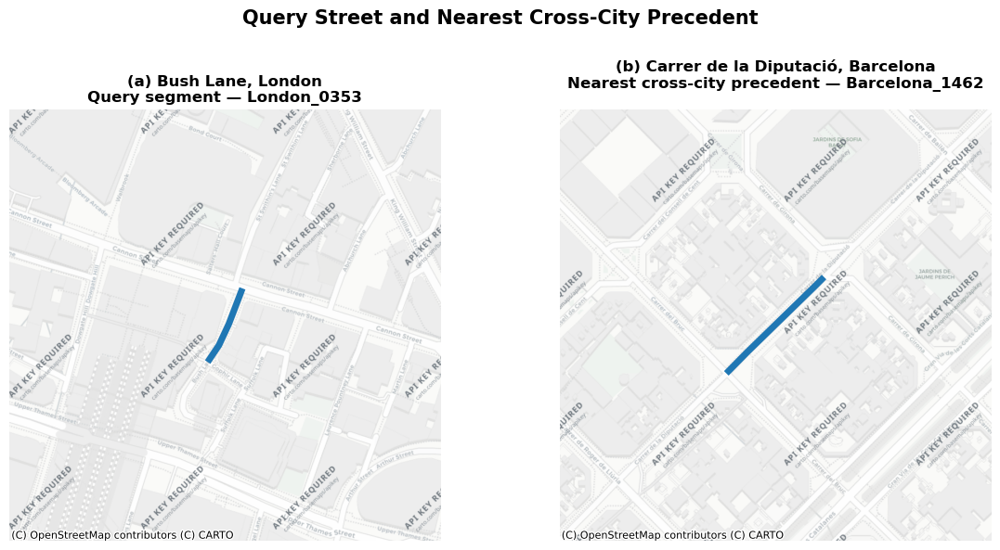

Saved to: /home/jovyan/work/outputs/figure_5_similarity_query_precedent_map.png


In [207]:
# ============================================================
# FIGURE 5.X+1
# Spatial comparison of query street and nearest precedent
# Bush Lane, London vs Carrer de la Diputació, Barcelona
# ============================================================

import matplotlib.pyplot as plt
import geopandas as gpd
import contextily as ctx

# ------------------------------------------------------------
# Segment IDs from final similarity-search result
# ------------------------------------------------------------

query_id = 'London_0353'
match_id = 'Barcelona_1462'

# ------------------------------------------------------------
# Extract exact street segments
# ------------------------------------------------------------

query_gdf = search_db[
    search_db['street_id'] == query_id
].copy()

match_gdf = search_db[
    search_db['street_id'] == match_id
].copy()

print("Query segment:")
display(
    query_gdf[
        ['street_id', 'display_name', 'city', 'typology']
    ]
)

print("\nNearest cross-city precedent:")
display(
    match_gdf[
        ['street_id', 'display_name', 'city', 'typology']
    ]
)

# ------------------------------------------------------------
# Convert to Web Mercator for basemap plotting
# ------------------------------------------------------------

query_plot = query_gdf.to_crs(epsg=3857)
match_plot = match_gdf.to_crs(epsg=3857)

# ------------------------------------------------------------
# Helper function: set a consistent local map window
# ------------------------------------------------------------

def set_local_extent(ax, gdf, buffer_m=250):

    minx, miny, maxx, maxy = gdf.total_bounds

    cx = (minx + maxx) / 2
    cy = (miny + maxy) / 2

    ax.set_xlim(
        cx - buffer_m,
        cx + buffer_m
    )

    ax.set_ylim(
        cy - buffer_m,
        cy + buffer_m
    )


# ------------------------------------------------------------
# Create figure
# ------------------------------------------------------------

fig, axes = plt.subplots(
    1,
    2,
    figsize=(12, 6)
)

# ============================================================
# (a) Bush Lane
# ============================================================

set_local_extent(
    axes[0],
    query_plot,
    buffer_m=250
)

ctx.add_basemap(
    axes[0],
    source=ctx.providers.CartoDB.Positron
)

query_plot.plot(
    ax=axes[0],
    linewidth=5,
    zorder=5
)

axes[0].set_title(
    '(a) Bush Lane, London\n'
    'Query segment — London_0353',
    fontsize=12,
    fontweight='bold'
)

axes[0].set_axis_off()


# ============================================================
# (b) Carrer de la Diputació
# ============================================================

set_local_extent(
    axes[1],
    match_plot,
    buffer_m=250
)

ctx.add_basemap(
    axes[1],
    source=ctx.providers.CartoDB.Positron
)

match_plot.plot(
    ax=axes[1],
    linewidth=5,
    zorder=5
)

axes[1].set_title(
    '(b) Carrer de la Diputació, Barcelona\n'
    'Nearest cross-city precedent — Barcelona_1462',
    fontsize=12,
    fontweight='bold'
)

axes[1].set_axis_off()


# ------------------------------------------------------------
# Overall title
# ------------------------------------------------------------

fig.suptitle(
    'Query Street and Nearest Cross-City Precedent',
    fontsize=15,
    fontweight='bold',
    y=0.98
)

plt.tight_layout(
    rect=[0, 0, 1, 0.94]
)

# ------------------------------------------------------------
# Save
# ------------------------------------------------------------

output_path = (
    '/home/jovyan/work/outputs/'
    'figure_5_similarity_query_precedent_map.png'
)

plt.savefig(
    output_path,
    dpi=300,
    bbox_inches='tight',
    facecolor='white'
)

plt.show()

print(f"Saved to: {output_path}")

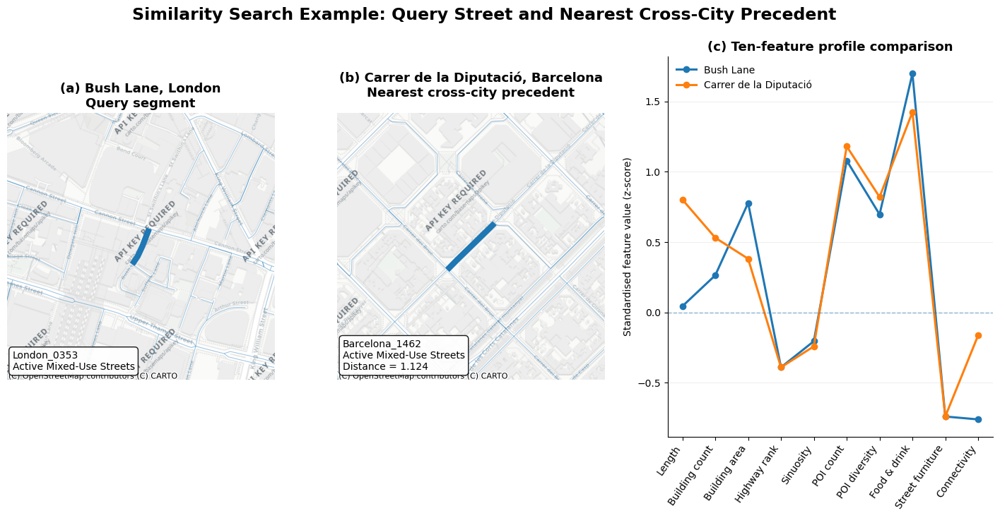

Saved to: /home/jovyan/work/outputs/figure_5_similarity_enhanced_comparison.png


In [160]:
# ============================================================
# FIGURE 5.X+1
# Enhanced query vs nearest cross-city precedent comparison
# Bush Lane, London vs Carrer de la Diputació, Barcelona
# ============================================================

import matplotlib.pyplot as plt
import geopandas as gpd
import numpy as np
import contextily as ctx

# ------------------------------------------------------------
# Segment IDs
# ------------------------------------------------------------

query_id = 'London_0353'
match_id = 'Barcelona_1462'

# ------------------------------------------------------------
# Extract exact segments
# ------------------------------------------------------------

query_row = search_db[
    search_db['street_id'] == query_id
].copy()

match_row = search_db[
    search_db['street_id'] == match_id
].copy()

query_index = query_row.index[0]
match_index = match_row.index[0]

# ------------------------------------------------------------
# Get original city street networks
# ------------------------------------------------------------

london_context = city_dfs['London'].copy()
barcelona_context = city_dfs['Barcelona'].copy()

# Convert all plotting layers to Web Mercator
london_context = london_context.to_crs(epsg=3857)
barcelona_context = barcelona_context.to_crs(epsg=3857)

query_plot = query_row.to_crs(epsg=3857)
match_plot = match_row.to_crs(epsg=3857)

# ------------------------------------------------------------
# Helper: local extent around selected segment
# ------------------------------------------------------------

def local_extent(gdf, buffer_m=320):
    minx, miny, maxx, maxy = gdf.total_bounds
    cx = (minx + maxx) / 2
    cy = (miny + maxy) / 2

    return (
        cx - buffer_m,
        cx + buffer_m,
        cy - buffer_m,
        cy + buffer_m
    )

# ------------------------------------------------------------
# Feature labels
# ------------------------------------------------------------

feature_labels = {
    'length_m': 'Length',
    'building_count_50m': 'Building count',
    'avg_building_area': 'Building area',
    'highway_rank': 'Highway rank',
    'sinuosity': 'Sinuosity',
    'poi_count_50m': 'POI count',
    'poi_diversity': 'POI diversity',
    'food_drink_count': 'Food & drink',
    'street_furniture_count': 'Street furniture',
    'avg_connectivity': 'Connectivity'
}

labels = [
    feature_labels[f]
    for f in FEATURE_COLS
]

query_values = X_scaled.iloc[query_index][FEATURE_COLS].to_numpy()
match_values = X_scaled.iloc[match_index][FEATURE_COLS].to_numpy()

# ------------------------------------------------------------
# Create figure
# ------------------------------------------------------------

fig = plt.figure(figsize=(18, 7))

gs = fig.add_gridspec(
    1,
    3,
    width_ratios=[1.15, 1.15, 1.4],
    wspace=0.22
)

ax1 = fig.add_subplot(gs[0, 0])
ax2 = fig.add_subplot(gs[0, 1])
ax3 = fig.add_subplot(gs[0, 2])

# ============================================================
# PANEL A — Bush Lane
# ============================================================

x1, x2, y1, y2 = local_extent(
    query_plot,
    buffer_m=320
)

# Plot surrounding network
london_context.plot(
    ax=ax1,
    linewidth=0.8,
    alpha=0.40
)

# Highlight query
query_plot.plot(
    ax=ax1,
    linewidth=6,
    zorder=5
)

ax1.set_xlim(x1, x2)
ax1.set_ylim(y1, y2)

ctx.add_basemap(
    ax1,
    source=ctx.providers.CartoDB.Positron
)

ax1.set_title(
    '(a) Bush Lane, London\nQuery segment',
    fontsize=13,
    fontweight='bold'
)

ax1.text(
    0.02,
    0.03,
    'London_0353\nActive Mixed-Use Streets',
    transform=ax1.transAxes,
    fontsize=10,
    va='bottom',
    bbox=dict(
        boxstyle='round,pad=0.35',
        facecolor='white',
        alpha=0.9
    )
)

ax1.set_axis_off()

# ============================================================
# PANEL B — Carrer de la Diputació
# ============================================================

x1, x2, y1, y2 = local_extent(
    match_plot,
    buffer_m=320
)

barcelona_context.plot(
    ax=ax2,
    linewidth=0.8,
    alpha=0.40
)

match_plot.plot(
    ax=ax2,
    linewidth=6,
    zorder=5
)

ax2.set_xlim(x1, x2)
ax2.set_ylim(y1, y2)

ctx.add_basemap(
    ax2,
    source=ctx.providers.CartoDB.Positron
)

ax2.set_title(
    '(b) Carrer de la Diputació, Barcelona\nNearest cross-city precedent',
    fontsize=13,
    fontweight='bold'
)

ax2.text(
    0.02,
    0.03,
    'Barcelona_1462\nActive Mixed-Use Streets\nDistance = 1.124',
    transform=ax2.transAxes,
    fontsize=10,
    va='bottom',
    bbox=dict(
        boxstyle='round,pad=0.35',
        facecolor='white',
        alpha=0.9
    )
)

ax2.set_axis_off()

# ============================================================
# PANEL C — FEATURE PROFILE COMPARISON
# ============================================================

x = np.arange(len(FEATURE_COLS))

ax3.plot(
    x,
    query_values,
    marker='o',
    linewidth=2.2,
    label='Bush Lane'
)

ax3.plot(
    x,
    match_values,
    marker='o',
    linewidth=2.2,
    label='Carrer de la Diputació'
)

ax3.axhline(
    0,
    linewidth=1,
    linestyle='--',
    alpha=0.5
)

ax3.set_xticks(x)
ax3.set_xticklabels(
    labels,
    rotation=55,
    ha='right'
)

ax3.set_ylabel(
    'Standardised feature value (z-score)'
)

ax3.set_title(
    '(c) Ten-feature profile comparison',
    fontsize=13,
    fontweight='bold'
)

ax3.legend(
    frameon=False,
    loc='best'
)

ax3.grid(
    axis='y',
    alpha=0.2
)

ax3.spines['top'].set_visible(False)
ax3.spines['right'].set_visible(False)

# ------------------------------------------------------------
# Overall title
# ------------------------------------------------------------

fig.suptitle(
    'Similarity Search Example: Query Street and Nearest Cross-City Precedent',
    fontsize=17,
    fontweight='bold',
    y=0.98
)

plt.tight_layout(
    rect=[0, 0, 1, 0.93]
)

# ------------------------------------------------------------
# Save
# ------------------------------------------------------------

output_path = (
    '/home/jovyan/work/outputs/'
    'figure_5_similarity_enhanced_comparison.png'
)

plt.savefig(
    output_path,
    dpi=300,
    bbox_inches='tight',
    facecolor='white'
)

plt.show()

print(f"Saved to: {output_path}")

In [161]:
# ============================================================
# VERIFY FEATURE VALUES USED IN SIMILARITY FIGURE
# ============================================================

query_id = 'London_0353'
match_id = 'Barcelona_1462'

query_index = search_db.index[
    search_db['street_id'] == query_id
][0]

match_index = search_db.index[
    search_db['street_id'] == match_id
][0]

print("=" * 70)
print("SIMILARITY FIGURE VERIFICATION")
print("=" * 70)

print("\nQuery:")
print("Index:", query_index)
print(
    search_db.loc[
        query_index,
        ['street_id', 'display_name', 'city', 'cluster', 'typology']
    ]
)

print("\nNearest precedent:")
print("Index:", match_index)
print(
    search_db.loc[
        match_index,
        ['street_id', 'display_name', 'city', 'cluster', 'typology']
    ]
)

print("\nX_scaled information:")
print("Type:", type(X_scaled))
print("Shape:", X_scaled.shape)

if hasattr(X_scaled, 'columns'):
    print("Columns:")
    print(list(X_scaled.columns))

print("\nExpected clustering features:")
print(FEATURE_COLS)

# Check row alignment
print("\nAlignment checks:")
print(
    "Rows in search_db:",
    len(search_db)
)
print(
    "Rows in X_scaled:",
    len(X_scaled)
)
print(
    "Same number of rows:",
    len(search_db) == len(X_scaled)
)

# Show the actual standardised values used
print("\n" + "=" * 70)
print("STANDARDISED FEATURE VALUES")
print("=" * 70)

if hasattr(X_scaled, 'iloc'):

    comparison = pd.DataFrame({
        'Feature': FEATURE_COLS,
        'Bush Lane': X_scaled.iloc[
            query_index
        ][FEATURE_COLS].to_numpy(),
        'Carrer de la Diputació': X_scaled.iloc[
            match_index
        ][FEATURE_COLS].to_numpy()
    })

else:

    comparison = pd.DataFrame({
        'Feature': FEATURE_COLS,
        'Bush Lane': X_scaled[query_index],
        'Carrer de la Diputació': X_scaled[match_index]
    })

display(comparison.round(3))

SIMILARITY FIGURE VERIFICATION

Query:
Index: 352
street_id                    London_0353
display_name                   Bush Lane
city                              London
cluster                                1
typology        Active Mixed-Use Streets
Name: 352, dtype: object

Nearest precedent:
Index: 2388
street_id                 Barcelona_1462
display_name      Carrer de la Diputació
city                           Barcelona
cluster                                1
typology        Active Mixed-Use Streets
Name: 2388, dtype: object

X_scaled information:
Type: <class 'pandas.core.frame.DataFrame'>
Shape: (3682, 10)
Columns:
['length_m', 'building_count_50m', 'avg_building_area', 'highway_rank', 'sinuosity', 'poi_count_50m', 'poi_diversity', 'food_drink_count', 'street_furniture_count', 'avg_connectivity']

Expected clustering features:
['length_m', 'building_count_50m', 'avg_building_area', 'highway_rank', 'sinuosity', 'poi_count_50m', 'poi_diversity', 'food_drink_count', 'street_

,Feature,Bush Lane,Carrer de la Diputació
0,length_m,0.043,0.801
1,building_count_50m,0.263,0.530
2,avg_building_area,0.778,0.381
3,highway_rank,-0.391,-0.391
4,sinuosity,-0.205,-0.242
5,poi_count_50m,1.079,1.180
6,poi_diversity,0.696,0.820
7,food_drink_count,1.697,1.423
8,street_furniture_count,-0.741,-0.741
9,avg_connectivity,-0.762,-0.163


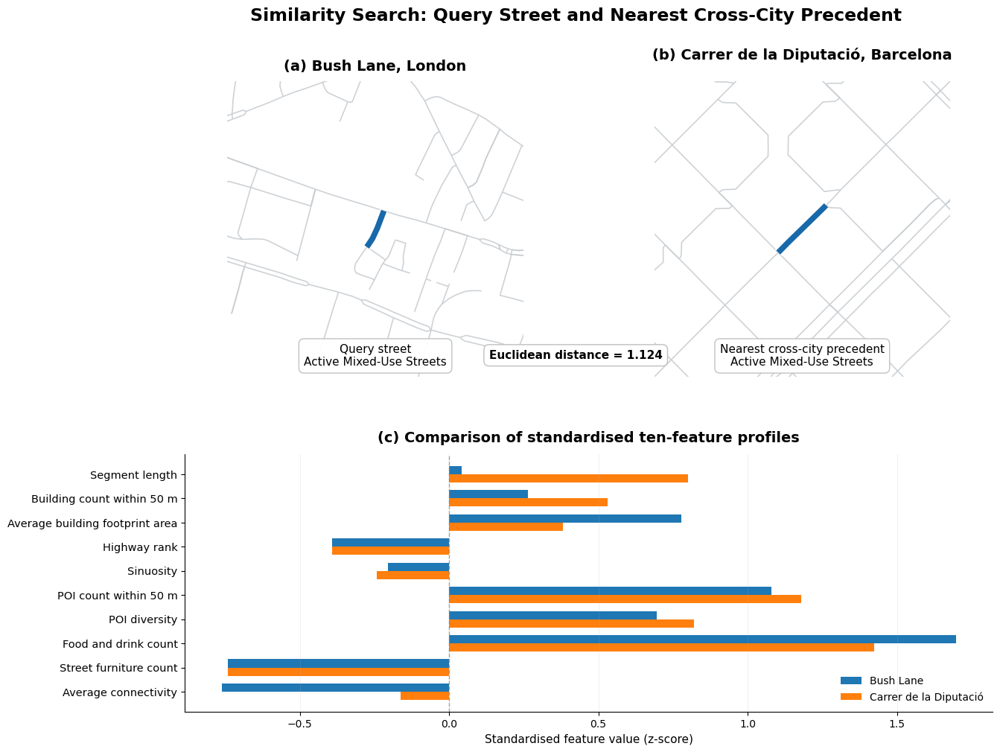

Saved to:
/home/jovyan/work/outputs/figure_5_similarity_final_refined.png


In [208]:
# ============================================================
# FINAL REFINED SIMILARITY SEARCH FIGURE
# Bush Lane vs Carrer de la Diputació
# ============================================================

import matplotlib.pyplot as plt
import numpy as np

# ------------------------------------------------------------
# SEGMENTS
# ------------------------------------------------------------

query_id = 'London_0353'
match_id = 'Barcelona_1462'

query_index = search_db.index[
    search_db['street_id'] == query_id
][0]

match_index = search_db.index[
    search_db['street_id'] == match_id
][0]

query_row = search_db.loc[[query_index]].copy()
match_row = search_db.loc[[match_index]].copy()

query_plot = query_row.to_crs(epsg=3857)
match_plot = match_row.to_crs(epsg=3857)

london_context = city_dfs['London'].to_crs(epsg=3857)
barcelona_context = city_dfs['Barcelona'].to_crs(epsg=3857)

# ------------------------------------------------------------
# FEATURE VALUES
# ------------------------------------------------------------

feature_labels = [
    'Segment length',
    'Building count within 50 m',
    'Average building footprint area',
    'Highway rank',
    'Sinuosity',
    'POI count within 50 m',
    'POI diversity',
    'Food and drink count',
    'Street furniture count',
    'Average connectivity'
]

query_values = (
    X_scaled.iloc[query_index][FEATURE_COLS].to_numpy()
)

match_values = (
    X_scaled.iloc[match_index][FEATURE_COLS].to_numpy()
)

# ------------------------------------------------------------
# MAP FUNCTION
# ------------------------------------------------------------

def plot_network_context(
    ax,
    context,
    selected,
    buffer_m=350
):

    minx, miny, maxx, maxy = selected.total_bounds

    cx = (minx + maxx) / 2
    cy = (miny + maxy) / 2

    xmin = cx - buffer_m
    xmax = cx + buffer_m
    ymin = cy - buffer_m
    ymax = cy + buffer_m

    local = context.cx[
        xmin:xmax,
        ymin:ymax
    ]

    # Surrounding network
    local.plot(
        ax=ax,
        linewidth=1.2,
        color='#C9CED2',
        alpha=0.9,
        zorder=1
    )

    # White halo
    selected.plot(
        ax=ax,
        linewidth=9,
        color='white',
        zorder=3
    )

    # Selected segment
    selected.plot(
        ax=ax,
        linewidth=5.5,
        color='#1769AA',
        zorder=4
    )

    ax.set_xlim(xmin, xmax)
    ax.set_ylim(ymin, ymax)

    ax.set_aspect('equal')
    ax.set_axis_off()


# ------------------------------------------------------------
# FIGURE LAYOUT
# ------------------------------------------------------------

fig = plt.figure(
    figsize=(14, 11)
)

gs = fig.add_gridspec(
    2,
    2,
    height_ratios=[1.15, 1],
    hspace=0.28,
    wspace=0.12
)

ax1 = fig.add_subplot(gs[0, 0])
ax2 = fig.add_subplot(gs[0, 1])

# Bottom chart spans full width
ax3 = fig.add_subplot(gs[1, :])


# ============================================================
# PANEL A — BUSH LANE
# ============================================================

plot_network_context(
    ax1,
    london_context,
    query_plot,
    buffer_m=350
)

ax1.set_title(
    '(a) Bush Lane, London',
    fontsize=14,
    fontweight='bold',
    pad=10
)

ax1.text(
    0.5,
    0.03,
    'Query street\nActive Mixed-Use Streets',
    transform=ax1.transAxes,
    ha='center',
    va='bottom',
    fontsize=11,
    bbox=dict(
        boxstyle='round,pad=0.45',
        facecolor='white',
        edgecolor='0.75',
        alpha=0.95
    )
)


# ============================================================
# PANEL B — CARRER DE LA DIPUTACIÓ
# ============================================================

plot_network_context(
    ax2,
    barcelona_context,
    match_plot,
    buffer_m=350
)

ax2.set_title(
    '(b) Carrer de la Diputació, Barcelona',
    fontsize=14,
    fontweight='bold',
    pad=10
)

ax2.text(
    0.5,
    0.03,
    'Nearest cross-city precedent\nActive Mixed-Use Streets',
    transform=ax2.transAxes,
    ha='center',
    va='bottom',
    fontsize=11,
    bbox=dict(
        boxstyle='round,pad=0.45',
        facecolor='white',
        edgecolor='0.75',
        alpha=0.95
    )
)


# ------------------------------------------------------------
# DISTANCE ANNOTATION BETWEEN MAPS
# ------------------------------------------------------------

fig.text(
    0.5,
    0.545,
    'Euclidean distance = 1.124',
    ha='center',
    va='center',
    fontsize=11,
    fontweight='bold',
    bbox=dict(
        boxstyle='round,pad=0.45',
        facecolor='white',
        edgecolor='0.75'
    )
)


# ============================================================
# PANEL C — HORIZONTAL FEATURE COMPARISON
# ============================================================

y = np.arange(
    len(feature_labels)
)

bar_height = 0.34

ax3.barh(
    y - bar_height/2,
    query_values,
    height=bar_height,
    label='Bush Lane'
)

ax3.barh(
    y + bar_height/2,
    match_values,
    height=bar_height,
    label='Carrer de la Diputació'
)

ax3.axvline(
    0,
    linestyle='--',
    linewidth=1,
    color='0.5',
    alpha=0.7
)

ax3.set_yticks(y)
ax3.set_yticklabels(
    feature_labels,
    fontsize=10.5
)

ax3.invert_yaxis()

ax3.set_xlabel(
    'Standardised feature value (z-score)',
    fontsize=11
)

ax3.set_title(
    '(c) Comparison of standardised ten-feature profiles',
    fontsize=14,
    fontweight='bold',
    pad=12
)

ax3.legend(
    frameon=False,
    loc='lower right'
)

ax3.grid(
    axis='x',
    alpha=0.18
)

ax3.spines['top'].set_visible(False)
ax3.spines['right'].set_visible(False)


# ------------------------------------------------------------
# MAIN TITLE
# ------------------------------------------------------------

fig.suptitle(
    'Similarity Search: Query Street and Nearest Cross-City Precedent',
    fontsize=17,
    fontweight='bold',
    y=0.97
)

plt.tight_layout(
    rect=[0.03, 0.03, 0.97, 0.94]
)


# ------------------------------------------------------------
# SAVE
# ------------------------------------------------------------

output_path = (
    '/home/jovyan/work/outputs/'
    'figure_5_similarity_final_refined.png'
)

plt.savefig(
    output_path,
    dpi=300,
    bbox_inches='tight',
    facecolor='white'
)

plt.show()

print(
    f"Saved to:\n{output_path}"
)